# Problem Statement

This case study aims to identify patterns which indicate, if a client has difficulty paying their installments which may be used for taking actions :- 
      
        1. such as denying the loan 
        2. reducing the amount of loan
        3. lending (to risky applicants) at a higher interest rate, etc.  
        This will ensure that the consumers capable of repaying the loan are not rejected.   
          
Identification of such applicants using EDA is the aim of this case study.In other words, the company wants to understand 
   
 - The **driving factors** (or **driver variables** ) behind loan default, i.e. the variables which are strong indicators of default. On the basis of that company going to set rules for portfolio assesment for future loan applications.

#### Importing Libraries

In [1]:
#Import Libraries

#1. For Analysis
import numpy as np
import pandas as pd

#2. For Visualizations
import matplotlib.pyplot as plt
import seaborn as sns

#3.Import Warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [2]:
#set display option

pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",300)

#### Read Application Dataset

In [3]:
#Read dataset of application_data in app_df

app_df = pd.read_csv("application_data.csv")

#### Analysis 

In [6]:
app_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [7]:
app_df.tail()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,225000.0,Unaccompanied,Working,Secondary / secondary special,Separated,With parents,0.032561,-9327,-236,-8456.0,-1982,NaN,1,1,0,1,0,0,Sales staff,1.0,1,1,THURSDAY,15,0,0,0,0,0,0,Services,0.145570,0.681632,NaN,0.2021,0.0887,0.9876,0.8300,0.0202,0.22,0.1034,0.6042,0.2708,0.0594,0.1484,0.1965,0.0753,0.1095,0.1008,0.0172,0.9782,0.7125,0.0172,0.0806,0.0345,0.4583,0.0417,0.0094,0.0882,0.0853,0.0,0.0125,0.2040,0.0887,0.9876,0.8323,0.0203,0.22,0.1034,0.6042,0.2708,0.0605,0.1509,0.2001,0.0757,0.1118,reg oper account,block of flats,0.2898,"Stone, brick",No,0.0,0.0,0.0,0.0,-273.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,225000.0,Unaccompanied,Pensioner,Secondary / secondary special,Widow,House / apartment,0.025164,-20775,365243,-4388.0,-4090,NaN,1,0,0,1,1,0,NaN,1.0,2,2,MONDAY,8,0,0,0,0,0,0,XNA,NaN,0.115992,NaN,0.0247,0.0435,0.9727,0.6260,0.0022,0.00,0.1034,0.0833,0.1250,0.0579,0.0202,0.0257,0.0000,0.0000,0.0252,0.0451,0.9727,0.6406,0.0022,0.0000,0.1034,0.0833,0.1250,0.0592,0.0220,0.0267,0.0,0.0000,0.0250,0.0435,0.9727,0.6310,0.0022,0.00,0.1034,0.0833,0.1250,0.0589,0.0205,0.0261,0.0000,0.0000,reg oper account,block of flats,0.0214,"Stone, brick",No,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,585000.0,Unaccompanied,Working,Higher education,Separated,House / apartment,0.005002,-14966,-7921,-6737.0,-5150,NaN,1,1,0,1,0,1,Managers,1.0,3,3,THURSDAY,9,0,0,0,0,1,1,School,0.744026,0.535722,0.218859,0.1031,0.0862,0.9816,0.7484,0.0123,0.00,0.2069,0.1667,0.2083,NaN,0.0841,0.9279,0.0000,0.0000,0.1050,0.0894,0.9816,0.7583,0.0124,0.0000,0.2069,0.1667,0.2

In [4]:
#Checking shape of the dataset

app_df.shape

(307511, 122)

In [4]:
app_df.columns.values

array(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
       'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE',
       'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1',
       'EXT_SOURCE_2', 'EXT_SOURCE_3',

In [9]:
#Checking info of the dataset

app_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Dtype  
---   ------                        -----  
 0    SK_ID_CURR                    int64  
 1    TARGET                        int64  
 2    NAME_CONTRACT_TYPE            object 
 3    CODE_GENDER                   object 
 4    FLAG_OWN_CAR                  object 
 5    FLAG_OWN_REALTY               object 
 6    CNT_CHILDREN                  int64  
 7    AMT_INCOME_TOTAL              float64
 8    AMT_CREDIT                    float64
 9    AMT_ANNUITY                   float64
 10   AMT_GOODS_PRICE               float64
 11   NAME_TYPE_SUITE               object 
 12   NAME_INCOME_TYPE              object 
 13   NAME_EDUCATION_TYPE           object 
 14   NAME_FAMILY_STATUS            object 
 15   NAME_HOUSING_TYPE             object 
 16   REGION_POPULATION_RELATIVE    float64
 17   DAYS_BIRTH                    int64  
 18   DA

In [10]:
app_df.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.97

#### Duplicate Checks

In [4]:
#Duplicate Check

app_df.drop_duplicates().shape  # No duplicate rows

(307511, 122)

#### Missing Values and/or Analysis

In [15]:
#1. Calculate % of missing values

app_df.isnull().mean() * 100


SK_ID_CURR                       0.000000
TARGET                           0.000000
NAME_CONTRACT_TYPE               0.000000
CODE_GENDER                      0.000000
FLAG_OWN_CAR                     0.000000
FLAG_OWN_REALTY                  0.000000
CNT_CHILDREN                     0.000000
AMT_INCOME_TOTAL                 0.000000
AMT_CREDIT                       0.000000
AMT_ANNUITY                      0.003902
AMT_GOODS_PRICE                  0.090403
NAME_TYPE_SUITE                  0.420148
NAME_INCOME_TYPE                 0.000000
NAME_EDUCATION_TYPE              0.000000
NAME_FAMILY_STATUS               0.000000
NAME_HOUSING_TYPE                0.000000
REGION_POPULATION_RELATIVE       0.000000
DAYS_BIRTH                       0.000000
DAYS_EMPLOYED                    0.000000
DAYS_REGISTRATION                0.000000
DAYS_ID_PUBLISH                  0.000000
OWN_CAR_AGE                     65.990810
FLAG_MOBIL                       0.000000
FLAG_EMP_PHONE                   0

**list down the columns having missing value of more than 40%**

In [5]:
cut_off = 40

cols_to_drop = list(app_df.columns[ 100 * app_df.isnull().mean() > cut_off ] )

# print(cols_to_drop)

# print("\nNo. of columns to be dropped:",len(cols_to_drop))


In [6]:
#Drop columns having missing value more than 40%

app_df = app_df.drop(cols_to_drop,axis=1)

In [7]:
#Re-check the shape

app_df.shape

(307511, 73)

In [15]:
#Again calculate the percentage of missing values

app_df.isnull().mean() * 100

SK_ID_CURR                      0.000000
TARGET                          0.000000
NAME_CONTRACT_TYPE              0.000000
CODE_GENDER                     0.000000
FLAG_OWN_CAR                    0.000000
FLAG_OWN_REALTY                 0.000000
CNT_CHILDREN                    0.000000
AMT_INCOME_TOTAL                0.000000
AMT_CREDIT                      0.000000
AMT_ANNUITY                     0.003902
AMT_GOODS_PRICE                 0.090403
NAME_TYPE_SUITE                 0.420148
NAME_INCOME_TYPE                0.000000
NAME_EDUCATION_TYPE             0.000000
NAME_FAMILY_STATUS              0.000000
NAME_HOUSING_TYPE               0.000000
REGION_POPULATION_RELATIVE      0.000000
DAYS_BIRTH                      0.000000
DAYS_EMPLOYED                   0.000000
DAYS_REGISTRATION               0.000000
DAYS_ID_PUBLISH                 0.000000
FLAG_MOBIL                      0.000000
FLAG_EMP_PHONE                  0.000000
FLAG_WORK_PHONE                 0.000000
FLAG_CONT_MOBILE

**2.  Analyzing the Columns having less than 1% of null values**

In [ ]:
#These columns having less than 1% missing 

# AMT_ANNUITY                     0.003902
# AMT_GOODS_PRICE                 0.090403
# NAME_TYPE_SUITE                 0.420148
# DAYS_LAST_PHONE_CHANGE          0.000325
# OBS_30_CNT_SOCIAL_CIRCLE        0.332021
# DEF_30_CNT_SOCIAL_CIRCLE        0.332021
# OBS_60_CNT_SOCIAL_CIRCLE        0.332021
# DEF_60_CNT_SOCIAL_CIRCLE        0.332021


In [16]:
#1. AMT_ANNUITY

app_df[ app_df["AMT_ANNUITY"].isnull() ]


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
47531,155054,0,Cash loans,M,N,N,0,180000.0,450000.0,NaN,450000.0,Unaccompanied,Commercial associate,Incomplete higher,Single / not married,House / apartment,0.026392,-10668,-2523,-4946.0,-3238,1,1,1,1,1,0,High skill tech staff,1.0,2,2,WEDNESDAY,13,0,0,0,0,0,0,Business Entity Type 3,0.626896,0.372334,1.0,0.0,1.0,0.0,-2.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
50035,157917,0,Cash loans,F,N,N,0,94500.0,450000.0,NaN,450000.0,Unaccompanied,Working,Lower secondary,Civil marriage,House / apartment,0.035792,-9027,-1270,-3640.0,-741,1,1,1,1,0,0,Laborers,2.0,2,2,MONDAY,20,0,0,0,0,0,0,Business Entity Type 1,0.727274,0.468660,0.0,0.0,0.0,0.0,-706.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,1.0
51594,159744,0,Cash loans,F,N,N,0,202500.0,539100.0,NaN,450000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.046220,-17376,-3950,-11524.0,-831,1,1,0,1,0,0,Cooking staff,2.0,1,1,WEDNESDAY,15,0,0,0,1,1,1,Self-employed,0.738370,0.452534,1.0,0.0,1.0,0.0,-199.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,1.0
55025,163757,0,Cash loans,F,N,N,0,162000.0,296280.0,NaN,225000.0,Unaccompanied,State servant,Higher education,Married,House / apartment,0.035792,-11329,-2040,-3195.0,-3069,1,1,0,1,0,0,Core staff,2.0,2,2,FRIDAY,13,0,0,0,1,1,1,Government,0.566316,0.220095,0.0,0.0,0.0,0.0,-2841.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,4.0
59934,169487,0,Cash loans,M,Y,N,0,202500.0,360000.0,NaN,360000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.046220,-19762,-2498,-11285.0,-3305,1,1,1,1,1,0,Laborers,1.0,1,1,FRIDAY,15,0,1,1,0,1,1,Other,0.583947,0.177704,0.0,0.0,0.0,0.0,-743.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,1.0,0.0,0.0,6.0
75873,187985,0,Cash loans,M,Y,N,0,144000.0,219249.0,NaN,166500.0,Unaccompanied,Working,Higher education,Single / not married,Rented apartment,0.022800,-20831,-2450,-771.0,-4203,1,1,0,1,0,0,Drivers,1.0,2,2,FRIDAY,15,0,0,0,0,0,0,Business Entity Type 3,0.667564,0.425893,0.0,0.0,0.0,0.0,-1986.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,11.0
89343,203726,0,Cash loans,F,Y,N,0,90000.0,157500.0,NaN,157500.0,Unaccompanied,State servant,Secondary / secondary special,Married,House / apartment,0.015221,-12134,-3721,-858.0,-591,1,1,0,1,1,0,Medicine staff,2.0,2,2,WEDNESDAY,11,0,0,0,0,0,0,Medicine,0.154811,0.297087,0.0,0.0,0.0,0.0,-348.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,2.0,0.0,0.0
123872,243648,0,Cash loans,F,N,Y,0,202500.0,929088.0,NaN,720000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0

In [22]:
#Analyze AMT_ANNUITY feature with NAME_CONTRACT_TYPE and AMT_GOODS_PRICE features


app_df[ (app_df["NAME_CONTRACT_TYPE"] !="Cash loans") & ( app_df["AMT_GOODS_PRICE"] <=0 ) ][ app_df["AMT_ANNUITY"].isnull() ]


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR


**This columns having null values, where loans is of revolving type and good_price is 0,**
 
-  It seems like the these values represents a revolving credit agreement where the borrower hasn't specified a purchase 
   (hence the zero goods price) and where there's no fixed monthly payment obligation (hence the null annuity)
    
-  As of now we keeping null value as it is 


In [17]:
#2. AMT_GOODS_PRICE  



app_df[ app_df["AMT_GOODS_PRICE"].isnull() ]


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
724,100837,0,Revolving loans,F,N,Y,2,45000.0,135000.0,6750.0,NaN,NaN,Commercial associate,Secondary / secondary special,Married,House / apartment,0.024610,-10072,-381,-519.0,-1834,1,1,1,1,0,0,Core staff,4.0,2,2,WEDNESDAY,14,0,0,0,0,0,0,Kindergarten,0.378174,NaN,2.0,1.0,2.0,1.0,-2011.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
5937,106955,0,Revolving loans,F,N,N,0,157500.0,450000.0,22500.0,NaN,NaN,Working,Secondary / secondary special,Married,House / apartment,0.010006,-11993,-2921,-1289.0,-1948,1,1,1,1,1,1,Private service staff,2.0,2,2,SATURDAY,13,0,0,0,0,0,0,Business Entity Type 3,0.464614,0.537070,0.0,0.0,0.0,0.0,-476.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
6425,107494,0,Revolving loans,F,N,N,0,67500.0,202500.0,10125.0,NaN,NaN,Working,Higher education,Married,House / apartment,0.008474,-9727,-2712,-4132.0,-800,1,1,1,1,1,0,Accountants,2.0,2,2,WEDNESDAY,18,0,0,0,0,0,0,Trade: type 7,0.565849,NaN,1.0,1.0,1.0,0.0,-643.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
6703,107822,0,Revolving loans,F,N,N,1,121500.0,180000.0,9000.0,NaN,NaN,Working,Secondary / secondary special,Civil marriage,House / apartment,0.011657,-11079,-899,-3765.0,-572,1,1,1,1,1,0,Managers,3.0,1,1,WEDNESDAY,11,0,0,0,0,0,0,Government,0.645519,0.863363,1.0,0.0,1.0,0.0,-1292.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
7647,108913,0,Revolving loans,M,N,Y,0,180000.0,450000.0,22500.0,NaN,NaN,Working,Higher education,Single / not married,House / apartment,0.032561,-9986,-1847,-4762.0,-506,1,1,1,1,1,0,Security staff,1.0,1,1,SATURDAY,18,0,0,0,0,0,0,Construction,0.552557,0.661024,1.0,0.0,1.0,0.0,-159.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
7880,109190,1,Revolving loans,F,N,N,0,121500.0,270000.0,13500.0,NaN,NaN,Working,Higher education,Single / not married,With parents,0.006296,-12390,-640,-6365.0,-3597,1,1,0,1,1,0,Managers,1.0,3,3,FRIDAY,16,0,0,0,0,0,0,Business Entity Type 3,0.407925,0.240541,2.0,0.0,1.0,0.0,-158.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
7995,109322,0,Revolving loans,M,N,Y,0,112500.0,180000.0,9000.0,NaN,NaN,Working,Secondary / secondary special,Single / not married,House / apartment,0.008230,-12420,-1610,-6443.0,-2463,1,1,0,1,1,0,Security staff,1.0,2,2,THURSDAY,16,0,1,1,1,1,1,Security,0.078597,0.504681,3.0,0.0,3.0,0.0,-2.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,2.0,3.0
10819,112595,0,Revolving loans,F,N,Y,0,90000.0,270000.0,13500.0,NaN,NaN,Working,Secondary / secondary special,Married,House / apartment,0.022800,-18193,-242,-1462.0,-1731,1,1,1,1,1,0,NaN,2.0,2,2,SUNDAY,15,0,0,0,0,0,0

- It seems AMT_Goods_Price having null values, when Name_Contract_Type is of Revolving Type

In [19]:
#Now check whether AMT_goods_price feature with respect with NAME_CONTRACT_TYPE features  



app_df[ app_df["NAME_CONTRACT_TYPE"] !=  "Revolving loans" ][app_df["AMT_GOODS_PRICE"].isnull() ]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR


- Its look like this only, so null value of AMT_Goods_Price is relevant, We need not to impute this columns

In [20]:
#3.NAME_TYPE_SUITE  


app_df[ app_df["NAME_TYPE_SUITE"].isnull() ]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
64,100076,0,Cash loans,M,Y,N,0,180000.0,315000.0,9679.5,315000.0,NaN,Commercial associate,Secondary / secondary special,Married,House / apartment,0.028663,-13866,-2546,-5448.0,-4097,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,12,0,0,0,0,0,0,Transport: type 3,0.584887,0.095070,0.0,0.0,0.0,0.0,-3.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
724,100837,0,Revolving loans,F,N,Y,2,45000.0,135000.0,6750.0,NaN,NaN,Commercial associate,Secondary / secondary special,Married,House / apartment,0.024610,-10072,-381,-519.0,-1834,1,1,1,1,0,0,Core staff,4.0,2,2,WEDNESDAY,14,0,0,0,0,0,0,Kindergarten,0.378174,NaN,2.0,1.0,2.0,1.0,-2011.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1199,101414,0,Cash loans,M,Y,N,0,135000.0,533668.5,34636.5,477000.0,NaN,Working,Secondary / secondary special,Civil marriage,House / apartment,0.046220,-21717,-2393,-5486.0,-4513,1,1,0,1,0,0,NaN,2.0,1,1,SUNDAY,10,0,0,0,0,0,0,Transport: type 3,0.756676,0.544235,3.0,0.0,3.0,0.0,-3.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,4.0,0.0,0.0
1669,101954,0,Cash loans,F,Y,N,2,153000.0,1162170.0,30654.0,832500.0,NaN,State servant,Higher education,Separated,House / apartment,0.024610,-12975,-1839,-3896.0,-2179,1,1,0,1,1,0,Core staff,3.0,2,2,THURSDAY,12,0,0,0,0,0,0,Government,0.685813,0.528093,0.0,0.0,0.0,0.0,-2.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1862,102183,0,Cash loans,F,Y,N,0,121500.0,268659.0,13774.5,243000.0,NaN,Commercial associate,Secondary / secondary special,Married,House / apartment,0.010147,-12870,-2822,-777.0,-4371,1,1,1,1,1,0,NaN,2.0,2,2,THURSDAY,11,0,0,0,0,1,1,Business Entity Type 3,0.492076,0.178760,2.0,0.0,2.0,0.0,-326.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.0,0.0,0.0,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
306273,454852,0,Revolving loans,M,N,Y,2,67500.0,202500.0,10125.0,NaN,NaN,Working,Higher education,Married,House / apartment,0.020713,-14079,-1648,-2492.0,-4905,1,1,1,1,1,0,Laborers,4.0,3,3,THURSDAY,6,0,0,0,0,0,0,Self-employed,0.608328,NaN,0.0,0.0,0.0,0.0,-1154.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,0.0
306544,455158,0,Cash loans,F,N,N,0,180000.0,894825.0,23602.5,894825.0,NaN,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,0.026392,-19625,-1634,-12077.0,-721,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,18,0,0,0,0,0,0,Business Entity Type 3,0.601387,N

- This is the column which specify client accompanied with whom while applying for loan 
- We should not impute this columns also, might be applicant does not fill the details


In [23]:
#5.Analyze DAYS_LAST_PHONE_CHANGE


app_df[ app_df["DAYS_LAST_PHONE_CHANGE"].isnull() ]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
15709,118330,0,Cash loans,M,Y,Y,0,126000.0,278613.0,25911.0,252000.0,Unaccompanied,Working,Incomplete higher,Married,House / apartment,0.010643,-8574,-293,-4790.0,-1075,0,1,0,1,0,0,NaN,2.0,2,2,FRIDAY,13,0,0,0,0,0,0,Trade: type 3,NaN,NaN,0.0,0.0,0.0,0.0,NaN,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


- This row we can drop as it having only single data that also FLAG_MOBIL column having 0,means applicant does not own mobile


In [24]:
#Analyze DAYS_LAST_PHONE_CHANGE with respect to FLAG_MOBIL features


app_df[ app_df["FLAG_MOBIL"] != 0 ][ app_df["DAYS_LAST_PHONE_CHANGE"].isnull() ]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR


- Its clear applicant does not mentioned its mobile, its Days_Last_Phone_Change value null is relevant, 
- so we can replace this with zero, or keep as it is


In [25]:
#6. Analyze OBS_30_CNT_SOCIAL_CIRCLE (0.332021% null)

app_df[ app_df["OBS_30_CNT_SOCIAL_CIRCLE"].isnull() ]


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
68,100080,0,Revolving loans,F,N,N,1,157500.0,450000.0,22500.0,450000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Civil marriage,House / apartment,0.010966,-11956,-3154,-8118.0,-4143,1,1,0,1,0,0,Sales staff,3.0,2,2,SUNDAY,10,0,0,0,0,0,0,Kindergarten,0.123888,0.832785,NaN,NaN,NaN,NaN,-1711.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,5.0
394,100457,0,Revolving loans,F,Y,Y,0,211500.0,270000.0,13500.0,270000.0,Unaccompanied,Working,Higher education,Single / not married,House / apartment,0.006008,-8922,-728,-8882.0,-66,1,1,0,1,1,0,Core staff,1.0,2,2,MONDAY,12,0,0,0,1,1,0,Trade: type 2,0.656779,NaN,NaN,NaN,NaN,NaN,-638.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
397,100460,0,Revolving loans,F,N,N,0,315000.0,540000.0,27000.0,540000.0,Unaccompanied,Commercial associate,Higher education,Single / not married,Rented apartment,0.014464,-9842,-157,-2291.0,-2291,1,1,0,1,0,0,NaN,1.0,2,2,FRIDAY,13,0,1,1,0,0,0,Business Entity Type 3,0.349457,0.633032,NaN,NaN,NaN,NaN,-404.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
457,100527,0,Revolving loans,F,N,N,0,112500.0,270000.0,13500.0,270000.0,Unaccompanied,Commercial associate,Higher education,Civil marriage,House / apartment,0.026392,-9393,-992,-4145.0,-2081,1,1,0,1,1,0,Accountants,2.0,2,2,WEDNESDAY,15,0,0,0,1,1,0,Bank,0.696210,0.669057,NaN,NaN,NaN,NaN,-187.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1042,101209,0,Revolving loans,M,Y,N,0,180000.0,540000.0,27000.0,540000.0,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,0.025164,-18800,-5516,-5862.0,-2306,1,1,0,1,0,0,Laborers,2.0,2,2,MONDAY,12,0,0,0,0,0,0,Other,0.640041,0.490258,NaN,NaN,NaN,NaN,-1943.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305526,453980,0,Revolving loans,F,Y,Y,2,72000.0,225000.0,11250.0,225000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.010643,-14981,-2205,-6053.0,-4253,1,1,0,1,0,0,Sales staff,4.0,2,2,MONDAY,14,0,0,0,0,0,0,Business Entity Type 3,0.567572,NaN,NaN,NaN,NaN,NaN,-165.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
305623,454093,0,Revolving loans,M,Y,Y,2,90000.0,202500.0,10125.0,202500.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.015221,-16306,-678,-8688.0,-4796,

In [27]:
#2. Analyze OBS_30_CNT_SOCIAL_CIRCLE it with NAME_CONTRACT_TYPE 

#Here we found in maximum case  NAME_CONTRACT_TYPE  having value -- Revolving loans (1020), 
#only case where it having value - Cash

app_df[ app_df["OBS_30_CNT_SOCIAL_CIRCLE"].isnull() ]["NAME_CONTRACT_TYPE" ].value_counts()


NAME_CONTRACT_TYPE
Revolving loans    1020
Cash loans            1
Name: count, dtype: int64

In [29]:
#3. Analyze OBS_30_CNT_SOCIAL_CIRCLE it with Target 

#Here we found in maximum case  TARGET  having value -- 0 (985), only (36) cases where it having value - 1

app_df[ app_df["OBS_30_CNT_SOCIAL_CIRCLE"].isnull() ]["TARGET" ].value_counts()

TARGET
0    985
1     36
Name: count, dtype: int64

In [30]:
#7. Analyze  DEF_30_CNT_SOCIAL_CIRCLE        0.332021

app_df[ app_df["DEF_30_CNT_SOCIAL_CIRCLE"].isnull() ]


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
68,100080,0,Revolving loans,F,N,N,1,157500.0,450000.0,22500.0,450000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Civil marriage,House / apartment,0.010966,-11956,-3154,-8118.0,-4143,1,1,0,1,0,0,Sales staff,3.0,2,2,SUNDAY,10,0,0,0,0,0,0,Kindergarten,0.123888,0.832785,NaN,NaN,NaN,NaN,-1711.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,5.0
394,100457,0,Revolving loans,F,Y,Y,0,211500.0,270000.0,13500.0,270000.0,Unaccompanied,Working,Higher education,Single / not married,House / apartment,0.006008,-8922,-728,-8882.0,-66,1,1,0,1,1,0,Core staff,1.0,2,2,MONDAY,12,0,0,0,1,1,0,Trade: type 2,0.656779,NaN,NaN,NaN,NaN,NaN,-638.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
397,100460,0,Revolving loans,F,N,N,0,315000.0,540000.0,27000.0,540000.0,Unaccompanied,Commercial associate,Higher education,Single / not married,Rented apartment,0.014464,-9842,-157,-2291.0,-2291,1,1,0,1,0,0,NaN,1.0,2,2,FRIDAY,13,0,1,1,0,0,0,Business Entity Type 3,0.349457,0.633032,NaN,NaN,NaN,NaN,-404.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
457,100527,0,Revolving loans,F,N,N,0,112500.0,270000.0,13500.0,270000.0,Unaccompanied,Commercial associate,Higher education,Civil marriage,House / apartment,0.026392,-9393,-992,-4145.0,-2081,1,1,0,1,1,0,Accountants,2.0,2,2,WEDNESDAY,15,0,0,0,1,1,0,Bank,0.696210,0.669057,NaN,NaN,NaN,NaN,-187.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1042,101209,0,Revolving loans,M,Y,N,0,180000.0,540000.0,27000.0,540000.0,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,0.025164,-18800,-5516,-5862.0,-2306,1,1,0,1,0,0,Laborers,2.0,2,2,MONDAY,12,0,0,0,0,0,0,Other,0.640041,0.490258,NaN,NaN,NaN,NaN,-1943.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305526,453980,0,Revolving loans,F,Y,Y,2,72000.0,225000.0,11250.0,225000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.010643,-14981,-2205,-6053.0,-4253,1,1,0,1,0,0,Sales staff,4.0,2,2,MONDAY,14,0,0,0,0,0,0,Business Entity Type 3,0.567572,NaN,NaN,NaN,NaN,NaN,-165.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
305623,454093,0,Revolving loans,M,Y,Y,2,90000.0,202500.0,10125.0,202500.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.015221,-16306,-678,-8688.0,-4796,

In [31]:
#2. Analyze DEF_30_CNT_SOCIAL_CIRCLE it with NAME_CONTRACT_TYPE 

#Here we found in maximum case  NAME_CONTRACT_TYPE  having value -- Revolving loans (1020), only case where it having value - Cash

app_df[ app_df["DEF_30_CNT_SOCIAL_CIRCLE"].isnull() ]["NAME_CONTRACT_TYPE" ].value_counts()

NAME_CONTRACT_TYPE
Revolving loans    1020
Cash loans            1
Name: count, dtype: int64

In [32]:
#3. Analyze DEF_30_CNT_SOCIAL_CIRCLE it with Target 

#Here we found in maximum case  TARGET  having value -- 0 (985), only (36) cases where it having value - 1

app_df[ app_df["DEF_30_CNT_SOCIAL_CIRCLE"].isnull() ]["TARGET" ].value_counts()

TARGET
0    985
1     36
Name: count, dtype: int64

In [33]:
#8. Analyze OBS_60_CNT_SOCIAL_CIRCLE        0.332021

app_df[ app_df["OBS_60_CNT_SOCIAL_CIRCLE"].isnull() ]


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
68,100080,0,Revolving loans,F,N,N,1,157500.0,450000.0,22500.0,450000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Civil marriage,House / apartment,0.010966,-11956,-3154,-8118.0,-4143,1,1,0,1,0,0,Sales staff,3.0,2,2,SUNDAY,10,0,0,0,0,0,0,Kindergarten,0.123888,0.832785,NaN,NaN,NaN,NaN,-1711.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,5.0
394,100457,0,Revolving loans,F,Y,Y,0,211500.0,270000.0,13500.0,270000.0,Unaccompanied,Working,Higher education,Single / not married,House / apartment,0.006008,-8922,-728,-8882.0,-66,1,1,0,1,1,0,Core staff,1.0,2,2,MONDAY,12,0,0,0,1,1,0,Trade: type 2,0.656779,NaN,NaN,NaN,NaN,NaN,-638.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
397,100460,0,Revolving loans,F,N,N,0,315000.0,540000.0,27000.0,540000.0,Unaccompanied,Commercial associate,Higher education,Single / not married,Rented apartment,0.014464,-9842,-157,-2291.0,-2291,1,1,0,1,0,0,NaN,1.0,2,2,FRIDAY,13,0,1,1,0,0,0,Business Entity Type 3,0.349457,0.633032,NaN,NaN,NaN,NaN,-404.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
457,100527,0,Revolving loans,F,N,N,0,112500.0,270000.0,13500.0,270000.0,Unaccompanied,Commercial associate,Higher education,Civil marriage,House / apartment,0.026392,-9393,-992,-4145.0,-2081,1,1,0,1,1,0,Accountants,2.0,2,2,WEDNESDAY,15,0,0,0,1,1,0,Bank,0.696210,0.669057,NaN,NaN,NaN,NaN,-187.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1042,101209,0,Revolving loans,M,Y,N,0,180000.0,540000.0,27000.0,540000.0,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,0.025164,-18800,-5516,-5862.0,-2306,1,1,0,1,0,0,Laborers,2.0,2,2,MONDAY,12,0,0,0,0,0,0,Other,0.640041,0.490258,NaN,NaN,NaN,NaN,-1943.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305526,453980,0,Revolving loans,F,Y,Y,2,72000.0,225000.0,11250.0,225000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.010643,-14981,-2205,-6053.0,-4253,1,1,0,1,0,0,Sales staff,4.0,2,2,MONDAY,14,0,0,0,0,0,0,Business Entity Type 3,0.567572,NaN,NaN,NaN,NaN,NaN,-165.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
305623,454093,0,Revolving loans,M,Y,Y,2,90000.0,202500.0,10125.0,202500.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.015221,-16306,-678,-8688.0,-4796,

In [34]:
#1. Analyze OBS_60_CNT_SOCIAL_CIRCLE it with NAME_CONTRACT_TYPE 

#Here we found in maximum case  NAME_CONTRACT_TYPE  having value -- Revolving loans (1020), only case where it having value - Cash

app_df[ app_df["OBS_60_CNT_SOCIAL_CIRCLE"].isnull() ]["NAME_CONTRACT_TYPE" ].value_counts()

NAME_CONTRACT_TYPE
Revolving loans    1020
Cash loans            1
Name: count, dtype: int64

In [35]:
#2. Analyze OBS_60_CNT_SOCIAL_CIRCLE it with Target 

#Here we found in maximum case  TARGET  having value -- 0 (985), only (36) cases where it having value - 1

app_df[ app_df["OBS_60_CNT_SOCIAL_CIRCLE"].isnull() ]["TARGET" ].value_counts()

TARGET
0    985
1     36
Name: count, dtype: int64

In [36]:
#9. Analyze DEF_60_CNT_SOCIAL_CIRCLE        0.332021

app_df[ app_df["DEF_60_CNT_SOCIAL_CIRCLE"].isnull() ]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
68,100080,0,Revolving loans,F,N,N,1,157500.0,450000.0,22500.0,450000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Civil marriage,House / apartment,0.010966,-11956,-3154,-8118.0,-4143,1,1,0,1,0,0,Sales staff,3.0,2,2,SUNDAY,10,0,0,0,0,0,0,Kindergarten,0.123888,0.832785,NaN,NaN,NaN,NaN,-1711.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,5.0
394,100457,0,Revolving loans,F,Y,Y,0,211500.0,270000.0,13500.0,270000.0,Unaccompanied,Working,Higher education,Single / not married,House / apartment,0.006008,-8922,-728,-8882.0,-66,1,1,0,1,1,0,Core staff,1.0,2,2,MONDAY,12,0,0,0,1,1,0,Trade: type 2,0.656779,NaN,NaN,NaN,NaN,NaN,-638.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
397,100460,0,Revolving loans,F,N,N,0,315000.0,540000.0,27000.0,540000.0,Unaccompanied,Commercial associate,Higher education,Single / not married,Rented apartment,0.014464,-9842,-157,-2291.0,-2291,1,1,0,1,0,0,NaN,1.0,2,2,FRIDAY,13,0,1,1,0,0,0,Business Entity Type 3,0.349457,0.633032,NaN,NaN,NaN,NaN,-404.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
457,100527,0,Revolving loans,F,N,N,0,112500.0,270000.0,13500.0,270000.0,Unaccompanied,Commercial associate,Higher education,Civil marriage,House / apartment,0.026392,-9393,-992,-4145.0,-2081,1,1,0,1,1,0,Accountants,2.0,2,2,WEDNESDAY,15,0,0,0,1,1,0,Bank,0.696210,0.669057,NaN,NaN,NaN,NaN,-187.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1042,101209,0,Revolving loans,M,Y,N,0,180000.0,540000.0,27000.0,540000.0,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,0.025164,-18800,-5516,-5862.0,-2306,1,1,0,1,0,0,Laborers,2.0,2,2,MONDAY,12,0,0,0,0,0,0,Other,0.640041,0.490258,NaN,NaN,NaN,NaN,-1943.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305526,453980,0,Revolving loans,F,Y,Y,2,72000.0,225000.0,11250.0,225000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.010643,-14981,-2205,-6053.0,-4253,1,1,0,1,0,0,Sales staff,4.0,2,2,MONDAY,14,0,0,0,0,0,0,Business Entity Type 3,0.567572,NaN,NaN,NaN,NaN,NaN,-165.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
305623,454093,0,Revolving loans,M,Y,Y,2,90000.0,202500.0,10125.0,202500.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.015221,-16306,-678,-8688.0,-4796,

In [37]:
#1. Analyze DEF_60_CNT_SOCIAL_CIRCLE it with NAME_CONTRACT_TYPE 

#Here we found in maximum case  NAME_CONTRACT_TYPE  having value -- Revolving loans (1020), only case where it having value - Cash

app_df[ app_df["DEF_60_CNT_SOCIAL_CIRCLE"].isnull() ]["NAME_CONTRACT_TYPE" ].value_counts()

NAME_CONTRACT_TYPE
Revolving loans    1020
Cash loans            1
Name: count, dtype: int64

In [38]:
#2. Analyze DEF_60_CNT_SOCIAL_CIRCLE it with Target 

#Here we found in maximum case  TARGET  having value -- 0 (985), only (36) cases where it having value - 1

app_df[ app_df["DEF_60_CNT_SOCIAL_CIRCLE"].isnull() ]["TARGET" ].value_counts()

TARGET
0    985
1     36
Name: count, dtype: int64

In [47]:
#3. Analyze all these columns together

#OBS_30_CNT_SOCIAL_CIRCLE        0.332021
#DEF_30_CNT_SOCIAL_CIRCLE        0.332021
#OBS_60_CNT_SOCIAL_CIRCLE        0.332021
#DEF_60_CNT_SOCIAL_CIRCLE        0.332021

app_df[ app_df["OBS_30_CNT_SOCIAL_CIRCLE"].isnull() ][["DEF_60_CNT_SOCIAL_CIRCLE","OBS_60_CNT_SOCIAL_CIRCLE","DEF_30_CNT_SOCIAL_CIRCLE"]]

,DEF_60_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE
68,NaN,NaN,NaN
394,NaN,NaN,NaN
397,NaN,NaN,NaN
457,NaN,NaN,NaN
1042,NaN,NaN,NaN
...,...,...,...
305526,NaN,NaN,NaN
305623,NaN,NaN,NaN
305641,NaN,NaN,NaN
305642,NaN,NaN,NaN


Some Insights regarding null values of these columns
  
a. OBS_30_CNT_SOCIAL_CIRCLE        
b. DEF_30_CNT_SOCIAL_CIRCLE        
c. OBS_60_CNT_SOCIAL_CIRCLE        
c. DEF_60_CNT_SOCIAL_CIRCLE        


1. The presence of null values in these columns, specifically when the loan type is **revolving** , indicates that there may not be much relevant data available for these fields in the context of revolving credit loans.It could be that the nature of revolving credit loans doesn't necessitate or capture social circle information as much as other types of loans.

2. The lack of payment difficulty despite the null values in these columns further supports the notion that revolving credit loans might not rely heavily on social circle information for assessing creditworthiness or predicting payment behavior. This aligns with the flexibility and different risk assessment methods typically associated with revolving credit

3. It's also possible that the dataset's data collection practices or the structure of the loan agreements prioritize  other factors over social circle information for revolving credit loans. This could result in missing or null values  for these variables in such cases.


**After done above analysis on the Columns having less than 1% of null values  
 We leave NULL values these columns as is**

1.  AMT_ANNUITY
2.  AMT_GOODS_PRICE
3.  NAME_TYPE_SUITE
4.  DAYS_LAST_PHONE_CHANGE
5.  OBS_30_CNT_SOCIAL_CIRCLE
6.  DEF_30_CNT_SOCIAL_CIRCLE
7.  OBS_60_CNT_SOCIAL_CIRCLE
8.  DEF_60_CNT_SOCIAL_CIRCLE

In [7]:
#List of columns we are keeping the null value as it is till further analysis

cols_Not_imputing = ["AMT_ANNUITY","AMT_GOODS_PRICE", "NAME_TYPE_SUITE", "DAYS_LAST_PHONE_CHANGE", "OBS_30_CNT_SOCIAL_CIRCLE", "DEF_30_CNT_SOCIAL_CIRCLE", "OBS_60_CNT_SOCIAL_CIRCLE", "DEF_60_CNT_SOCIAL_CIRCLE"]

#### Segmentaion of columns -- Divide columns in Categorical and Numerical for further analysis

- Dividing columns types on the basis of count of unique value it having

In [8]:


cat_cols = []
num_cols = []
for i in app_df.columns:
    
        if app_df[i].nunique()>30:
            num_cols.append(i)
        else:
            cat_cols.append(i)


In [9]:
#CAtegorical columns

len(cat_cols)

57

In [10]:
#Numerical columns

len(num_cols)

16

In [11]:
#Check data of categorical columns

app_df[cat_cols].head()

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,1,Cash loans,M,N,Y,0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,2.0,2.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,0,Cash loans,F,N,N,0,Family,State servant,Higher education,Married,House / apartment,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,Revolving loans,M,Y,Y,0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,Cash loans,F,N,Y,0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,0,Cash loans,M,N,Y,0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
#Check data of numerical columns

app_df[num_cols].head()

#ORGANIZATION_TYPE -- CAtegorical Column : From the data it seems this columns belongs to categorical

,SK_ID_CURR,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE
0,100002,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,-3648.0,-2120,Business Entity Type 3,0.262949,0.139376,2.0,2.0,-1134.0
1,100003,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,-1186.0,-291,School,0.622246,NaN,1.0,1.0,-828.0
2,100004,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,-4260.0,-2531,Government,0.555912,0.729567,0.0,0.0,-815.0
3,100006,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,-9833.0,-2437,Business Entity Type 3,0.650442,NaN,2.0,2.0,-617.0
4,100007,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,-4311.0,-3458,Religion,0.322738,NaN,0.0,0.0,-1106.0


In [9]:
#Adding Organization Type in Categorical Column, Removing it from Num_cols

cat_cols.append("ORGANIZATION_TYPE")
num_cols.remove("ORGANIZATION_TYPE")


In [12]:
print(len(cat_cols))
print(len(num_cols))

58
15


In [13]:
#Checking data types of categorical columns
app_df[cat_cols].dtypes

TARGET                           int64
NAME_CONTRACT_TYPE              object
CODE_GENDER                     object
FLAG_OWN_CAR                    object
FLAG_OWN_REALTY                 object
CNT_CHILDREN                     int64
NAME_TYPE_SUITE                 object
NAME_INCOME_TYPE                object
NAME_EDUCATION_TYPE             object
NAME_FAMILY_STATUS              object
NAME_HOUSING_TYPE               object
FLAG_MOBIL                       int64
FLAG_EMP_PHONE                   int64
FLAG_WORK_PHONE                  int64
FLAG_CONT_MOBILE                 int64
FLAG_PHONE                       int64
FLAG_EMAIL                       int64
OCCUPATION_TYPE                 object
CNT_FAM_MEMBERS                float64
REGION_RATING_CLIENT             int64
REGION_RATING_CLIENT_W_CITY      int64
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START          int64
REG_REGION_NOT_LIVE_REGION       int64
REG_REGION_NOT_WORK_REGION       int64
LIVE_REGION_NOT_WORK_REGI

**Checking null value percentage of categorical columns**

- OCCUPATION_TYPE
- AMT_REQ_CREDIT_BUREAU_HOUR
- AMT_REQ_CREDIT_BUREAU_DAY
- AMT_REQ_CREDIT_BUREAU_WEEK
- AMT_REQ_CREDIT_BUREAU_MON
- AMT_REQ_CREDIT_BUREAU_QRT
- AMT_REQ_CREDIT_BUREAU_YEAR

In [16]:

app_df[cat_cols].isnull().mean() * 100



TARGET                          0.000000
NAME_CONTRACT_TYPE              0.000000
CODE_GENDER                     0.000000
FLAG_OWN_CAR                    0.000000
FLAG_OWN_REALTY                 0.000000
CNT_CHILDREN                    0.000000
NAME_TYPE_SUITE                 0.420148
NAME_INCOME_TYPE                0.000000
NAME_EDUCATION_TYPE             0.000000
NAME_FAMILY_STATUS              0.000000
NAME_HOUSING_TYPE               0.000000
FLAG_MOBIL                      0.000000
FLAG_EMP_PHONE                  0.000000
FLAG_WORK_PHONE                 0.000000
FLAG_CONT_MOBILE                0.000000
FLAG_PHONE                      0.000000
FLAG_EMAIL                      0.000000
OCCUPATION_TYPE                31.345545
CNT_FAM_MEMBERS                 0.000650
REGION_RATING_CLIENT            0.000000
REGION_RATING_CLIENT_W_CITY     0.000000
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
REG_REGION_NOT_LIVE_REGION      0.000000
REG_REGION_NOT_W

In [ ]:
#OCCUPATION_TYPE                31.345545

In [26]:
#Checking OCCUPATION_TYPE with NAME_INCOME_TYPE  

app_df[app_df["OCCUPATION_TYPE"].isnull()][["NAME_INCOME_TYPE"]].value_counts()

NAME_INCOME_TYPE    
Pensioner               55357
Working                 24920
Commercial associate    12297
State servant            3787
Unemployed                 22
Student                     5
Businessman                 2
Maternity leave             1
Name: count, dtype: int64

In [27]:
#Checking Occupation_type when Income type is Unemployed, Pensioner, Student or Maternity leave

app_df[ (app_df['NAME_INCOME_TYPE']=='Pensioner') | (app_df['NAME_INCOME_TYPE']=='Unemployed') | (app_df['NAME_INCOME_TYPE']=='Student') | (app_df['NAME_INCOME_TYPE']=='Maternity leave')]['OCCUPATION_TYPE'].value_counts()


OCCUPATION_TYPE
Laborers                7
Core staff              5
Low-skill Laborers      2
Cleaning staff          2
Accountants             2
Waiters/barmen staff    1
Drivers                 1
Medicine staff          1
Sales staff             1
Name: count, dtype: int64


1.When the OCCUPATION_TYPE column has null values while the NAME_INCOME_TYPE column has non-null values in the dataset, 
 it indicates that for certain individuals, their income type is known, but their occupation type is not specified

2. This pattern suggests that while the dataset captures information about the source of income for these individuals (NAME_INCOME_TYPE),  details about their specific occupation (OCCUPATION_TYPE) are missing. This could be due to various reasons such as incomplete data entry, voluntary omission of occupation information by applicants, or limitations in data collection processe

As of now we keep the null values of these columns as it is


In [10]:
#Final list of Categorical columns for imputing null for imputing

final_cat_col_impute = ["AMT_REQ_CREDIT_BUREAU_HOUR","AMT_REQ_CREDIT_BUREAU_DAY","AMT_REQ_CREDIT_BUREAU_WEEK", "AMT_REQ_CREDIT_BUREAU_MON", "AMT_REQ_CREDIT_BUREAU_QRT", "AMT_REQ_CREDIT_BUREAU_YEAR"]


In [14]:
#Null value percentage of columns, that we are taking for imputing

app_df[final_cat_col_impute].isnull().mean() * 100

AMT_REQ_CREDIT_BUREAU_HOUR    13.501631
AMT_REQ_CREDIT_BUREAU_DAY     13.501631
AMT_REQ_CREDIT_BUREAU_WEEK    13.501631
AMT_REQ_CREDIT_BUREAU_MON     13.501631
AMT_REQ_CREDIT_BUREAU_QRT     13.501631
AMT_REQ_CREDIT_BUREAU_YEAR    13.501631
dtype: float64

- Imputing categorical columns with null value less than 40% with mode of that columns

In [12]:


for i in final_cat_col_impute:             
    if app_df[i].isnull().mean() > 0:      
        mod = app_df[i].mode()[0]          
        app_df[i] = app_df[i].fillna(mod)  
        

In [13]:
#Re-check null value percentage of categorical columns

app_df[cat_cols].isnull().mean() * 100


TARGET                          0.000000
NAME_CONTRACT_TYPE              0.000000
CODE_GENDER                     0.000000
FLAG_OWN_CAR                    0.000000
FLAG_OWN_REALTY                 0.000000
CNT_CHILDREN                    0.000000
NAME_TYPE_SUITE                 0.420148
NAME_INCOME_TYPE                0.000000
NAME_EDUCATION_TYPE             0.000000
NAME_FAMILY_STATUS              0.000000
NAME_HOUSING_TYPE               0.000000
FLAG_MOBIL                      0.000000
FLAG_EMP_PHONE                  0.000000
FLAG_WORK_PHONE                 0.000000
FLAG_CONT_MOBILE                0.000000
FLAG_PHONE                      0.000000
FLAG_EMAIL                      0.000000
OCCUPATION_TYPE                31.345545
CNT_FAM_MEMBERS                 0.000650
REGION_RATING_CLIENT            0.000000
REGION_RATING_CLIENT_W_CITY     0.000000
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
REG_REGION_NOT_LIVE_REGION      0.000000
REG_REGION_NOT_W

In [12]:
#Check data type of numerical columns

app_df[num_cols].dtypes

SK_ID_CURR                      int64
AMT_INCOME_TOTAL              float64
AMT_CREDIT                    float64
AMT_ANNUITY                   float64
AMT_GOODS_PRICE               float64
REGION_POPULATION_RELATIVE    float64
DAYS_BIRTH                      int64
DAYS_EMPLOYED                   int64
DAYS_REGISTRATION             float64
DAYS_ID_PUBLISH                 int64
EXT_SOURCE_2                  float64
EXT_SOURCE_3                  float64
OBS_30_CNT_SOCIAL_CIRCLE      float64
OBS_60_CNT_SOCIAL_CIRCLE      float64
DAYS_LAST_PHONE_CHANGE        float64
dtype: object

In [14]:
#Checking null value percentage of numerical columns

app_df[num_cols].isnull().mean() * 100


SK_ID_CURR                     0.000000
AMT_INCOME_TOTAL               0.000000
AMT_CREDIT                     0.000000
AMT_ANNUITY                    0.003902
AMT_GOODS_PRICE                0.090403
REGION_POPULATION_RELATIVE     0.000000
DAYS_BIRTH                     0.000000
DAYS_EMPLOYED                  0.000000
DAYS_REGISTRATION              0.000000
DAYS_ID_PUBLISH                0.000000
EXT_SOURCE_2                   0.214626
EXT_SOURCE_3                  19.825307
OBS_30_CNT_SOCIAL_CIRCLE       0.332021
OBS_60_CNT_SOCIAL_CIRCLE       0.332021
DAYS_LAST_PHONE_CHANGE         0.000325
dtype: float64

In [34]:
#analyzing EXT_SOURCE_3

app_df[ app_df["EXT_SOURCE_3"].isnull() ].shape


(60965, 73)

- "EXT_SOURCE_3" typically refer to external credit scores or ratings provided by third-party sources. 
 These scores are often used by banks and financial institutions to assess the creditworthiness of applicants

- Large no. of missing values in the columns means
    1. Sometimes, external credit score information might not be available for certain applicants.
       This could happen if the applicant is new to the credit system or if the data provider does not have sufficient information about the applicant
  
    2. Certain demographic groups might be less likely to have their credit scores reported, leading to biased data
  
- So we we choose to drop the column, instead of imputing which may lead to wrong analysis

In [13]:
#Drop EXT_SOURCE_3 column because of High % of  null values as 19.825307, 

app_df = app_df.drop("EXT_SOURCE_3",axis=1)


- Impute EXT_SOURCE_2 with median value

In [14]:


med = app_df["EXT_SOURCE_2"].median()
app_df["EXT_SOURCE_2"] = app_df["EXT_SOURCE_2"].fillna(med)


In [15]:
num_cols.remove("EXT_SOURCE_3")

In [19]:
print(len(cat_cols))
print(len(num_cols))

58
14


In [21]:
#Re-Checking null value percentage of numerical columns

app_df[num_cols].isnull().mean() * 100


SK_ID_CURR                    0.000000
AMT_INCOME_TOTAL              0.000000
AMT_CREDIT                    0.000000
AMT_ANNUITY                   0.003902
AMT_GOODS_PRICE               0.090403
REGION_POPULATION_RELATIVE    0.000000
DAYS_BIRTH                    0.000000
DAYS_EMPLOYED                 0.000000
DAYS_REGISTRATION             0.000000
DAYS_ID_PUBLISH               0.000000
EXT_SOURCE_2                  0.000000
OBS_30_CNT_SOCIAL_CIRCLE      0.332021
OBS_60_CNT_SOCIAL_CIRCLE      0.332021
DAYS_LAST_PHONE_CHANGE        0.000325
dtype: float64

In [28]:
#Rechecking null value percentage for entire application dataset

app_df.isnull().mean() * 100

#AMT_ANNUITY                     0.003902
#AMT_GOODS_PRICE                 0.090403
#NAME_TYPE_SUITE                 0.420148
#OCCUPATION_TYPE                31.345545
#CNT_FAM_MEMBERS                 0.000650
#OBS_30_CNT_SOCIAL_CIRCLE        0.332021
#DEF_30_CNT_SOCIAL_CIRCLE        0.332021
#OBS_60_CNT_SOCIAL_CIRCLE        0.332021
#DEF_60_CNT_SOCIAL_CIRCLE        0.332021   -- We keep null values of these columns as it is

SK_ID_CURR                      0.000000
TARGET                          0.000000
NAME_CONTRACT_TYPE              0.000000
CODE_GENDER                     0.000000
FLAG_OWN_CAR                    0.000000
FLAG_OWN_REALTY                 0.000000
CNT_CHILDREN                    0.000000
AMT_INCOME_TOTAL                0.000000
AMT_CREDIT                      0.000000
AMT_ANNUITY                     0.003902
AMT_GOODS_PRICE                 0.090403
NAME_TYPE_SUITE                 0.420148
NAME_INCOME_TYPE                0.000000
NAME_EDUCATION_TYPE             0.000000
NAME_FAMILY_STATUS              0.000000
NAME_HOUSING_TYPE               0.000000
REGION_POPULATION_RELATIVE      0.000000
DAYS_BIRTH                      0.000000
DAYS_EMPLOYED                   0.000000
DAYS_REGISTRATION               0.000000
DAYS_ID_PUBLISH                 0.000000
FLAG_MOBIL                      0.000000
FLAG_EMP_PHONE                  0.000000
FLAG_WORK_PHONE                 0.000000
FLAG_CONT_MOBILE

#### Standarization

Checking values of below columns
 
1. DAYS_BIRTH                      
2. DAYS_EMPLOYED                   
3. DAYS_REGISTRATION               
4. DAYS_ID_PUBLISH                 

In [44]:
#1. DAYS_BIRTH  

app_df["DAYS_BIRTH"].value_counts()

DAYS_BIRTH
-13749    43
-13481    42
-18248    41
-10020    41
-15771    40
          ..
-24898     1
-24868     1
-8017      1
-25098     1
-25061     1
Name: count, Length: 17460, dtype: int64

In [16]:
#DAys_BIRTH cannot be negative
#Convert value of this column to absolute and convert it to year also change the column name

app_df["DAYS_BIRTH"] = abs(app_df["DAYS_BIRTH"]) // 365.25
app_df.rename({'DAYS_BIRTH':'YEARS_BIRTH'}, axis=1, inplace=True)



In [30]:
#DAYS_EMPLOYED 

app_df["DAYS_EMPLOYED"].value_counts()

DAYS_EMPLOYED
 365243    55374
-200         156
-224         152
-230         151
-199         151
           ...  
-13961         1
-11827         1
-10176         1
-9459          1
-8694          1
Name: count, Length: 12574, dtype: int64

In [17]:
#DAYS_EMPLOYED cannot be -Ve

#Converting DAYS_EMPLOYED to +ve (taking abs) and renamed the columns as Years_ Instead of days

app_df["DAYS_EMPLOYED"] = abs(app_df["DAYS_EMPLOYED"]) // 365.25

app_df.rename({'DAYS_EMPLOYED':'YEARS_EMPLOYED'}, axis=1, inplace=True)



In [47]:
#3.DAYS_REGISTRATION               0.000000

app_df["DAYS_REGISTRATION"].value_counts()

DAYS_REGISTRATION
-1.0        113
-7.0         98
-6.0         96
-4.0         92
-2.0         92
           ... 
-15581.0      1
-15031.0      1
-14804.0      1
-15008.0      1
-14798.0      1
Name: count, Length: 15688, dtype: int64

In [18]:
#DAYS_REGISTRATION cannot be -ve

#Converting DAYS_EMPLOYED to +ve (taking abs) and renamed the columns as Years_ Instead of days

app_df["DAYS_REGISTRATION"] = abs(app_df["DAYS_REGISTRATION"]) // 365.25

app_df.rename({'DAYS_REGISTRATION':'YEARS_REGISTRATION'}, axis=1, inplace=True)



In [48]:
#4.DAYS_ID_PUBLISH                 0.000000

app_df["DAYS_ID_PUBLISH"].value_counts()


DAYS_ID_PUBLISH
-4053    169
-4095    162
-4046    161
-4417    159
-4256    158
        ... 
-5896      1
-5921      1
-5753      1
-5960      1
-6211      1
Name: count, Length: 6168, dtype: int64

In [19]:
#DAYS_ID_PUBLISH cannot be -ve 
#Converting DAYS_EMPLOYED to +ve (taking abs) and renamed the columns as Years_ Instead of days

app_df["DAYS_ID_PUBLISH"] = abs(app_df["DAYS_ID_PUBLISH"]) // 365.25

app_df.rename({'DAYS_ID_PUBLISH':'YEARS_ID_PUBLISH'}, axis=1, inplace=True)



In [20]:
#Adding Some Columns in the Numerical Columns List

#DAYS_ID_PUBLISH - Remove
#DAYS_REGISTRATION - Remove
#DAYS_EMPLOYED - Remove
#DAYS_BIRTH  - Remove

#YEARS_BIRTH - ADD
#YEARS_ID_PUBLISH - Add
#YEARS_REGISTRATION --ADD
#YEARS_EMPLOYED - ADD

num_cols.remove("DAYS_ID_PUBLISH")
num_cols.remove("DAYS_REGISTRATION")
num_cols.remove("DAYS_EMPLOYED")
num_cols.remove("DAYS_BIRTH")

#Append
num_cols.append("YEARS_ID_PUBLISH")
num_cols.append("YEARS_REGISTRATION")
num_cols.append("YEARS_EMPLOYED")
num_cols.append("YEARS_BIRTH")

len(num_cols)


14

In [29]:
app_df.isnull().mean() * 100

SK_ID_CURR                      0.000000
TARGET                          0.000000
NAME_CONTRACT_TYPE              0.000000
CODE_GENDER                     0.000000
FLAG_OWN_CAR                    0.000000
FLAG_OWN_REALTY                 0.000000
CNT_CHILDREN                    0.000000
AMT_INCOME_TOTAL                0.000000
AMT_CREDIT                      0.000000
AMT_ANNUITY                     0.003902
AMT_GOODS_PRICE                 0.090403
NAME_TYPE_SUITE                 0.420148
NAME_INCOME_TYPE                0.000000
NAME_EDUCATION_TYPE             0.000000
NAME_FAMILY_STATUS              0.000000
NAME_HOUSING_TYPE               0.000000
REGION_POPULATION_RELATIVE      0.000000
YEARS_BIRTH                     0.000000
YEARS_EMPLOYED                  0.000000
YEARS_REGISTRATION              0.000000
YEARS_ID_PUBLISH                0.000000
FLAG_MOBIL                      0.000000
FLAG_EMP_PHONE                  0.000000
FLAG_WORK_PHONE                 0.000000
FLAG_CONT_MOBILE

In [30]:
#Analyzing value in NAME_EDUCATION_TYPE

app_df["NAME_EDUCATION_TYPE"].value_counts()


NAME_EDUCATION_TYPE
Secondary / secondary special    218391
Higher education                  74863
Incomplete higher                 10277
Lower secondary                    3816
Academic degree                     164
Name: count, dtype: int64

In [31]:
#Analyzing value in NAME_FAMILY_STATUS

app_df["NAME_FAMILY_STATUS"].value_counts()


NAME_FAMILY_STATUS
Married                 196432
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Unknown                      2
Name: count, dtype: int64

In [32]:
#Analyzing value in NAME_HOUSING_TYPE

app_df["NAME_HOUSING_TYPE"].value_counts()


NAME_HOUSING_TYPE
House / apartment      272868
With parents            14840
Municipal apartment     11183
Rented apartment         4881
Office apartment         2617
Co-op apartment          1122
Name: count, dtype: int64

In [20]:
print(len(num_cols))
print(len(cat_cols))

14
58


### Univariate Analysis


#### Numerical columns

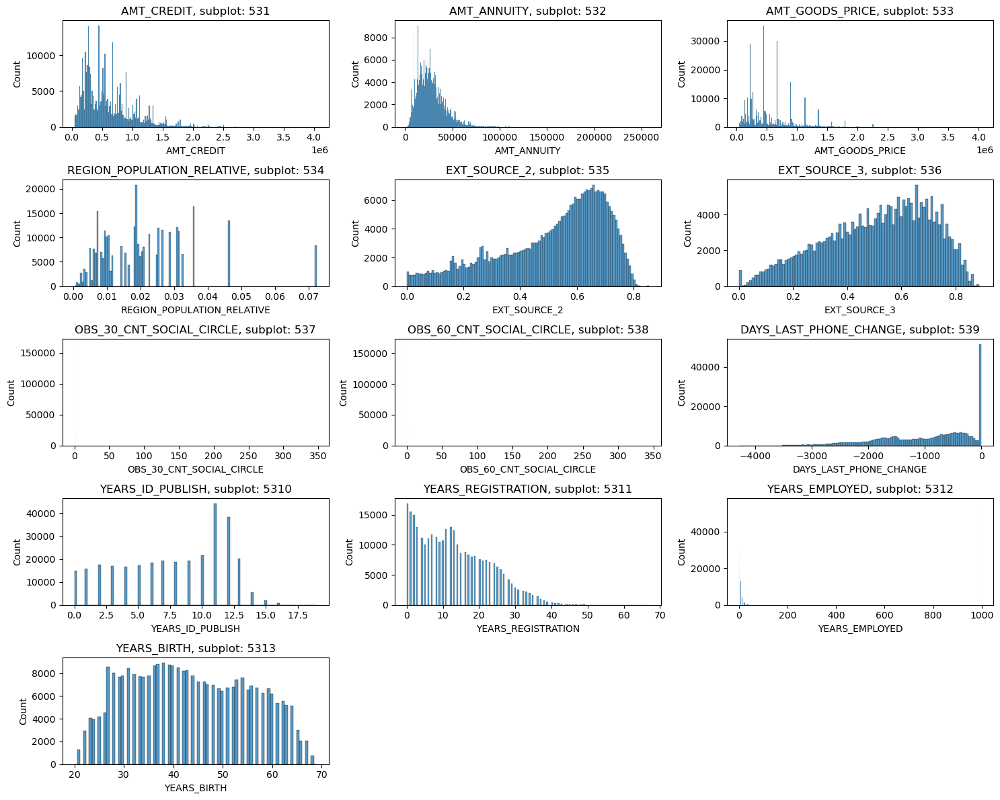

In [19]:
#Histogram

i = 5  # Row Count 
j = 3  # Column Count
k = 1  #  plot counter

fig = plt.figure(figsize=(15,12))

for col in num_cols:
    if col not in  ['SK_ID_CURR','AMT_INCOME_TOTAL'] :

        plt.subplot(i, j, k)
        plt.title('{}, subplot: {}{}{}'.format(col, i, j, k))
        plt.xlabel(col)
        sns.histplot(x = app_df[col], palette="Blues_d")
        k = k + 1

fig.tight_layout()
plt.show()

**POINTS**
  
1.  Many Columns shows less distribution like : Years_Employed, AMT_GOODS_Price etc.
2.  Many Having outlier


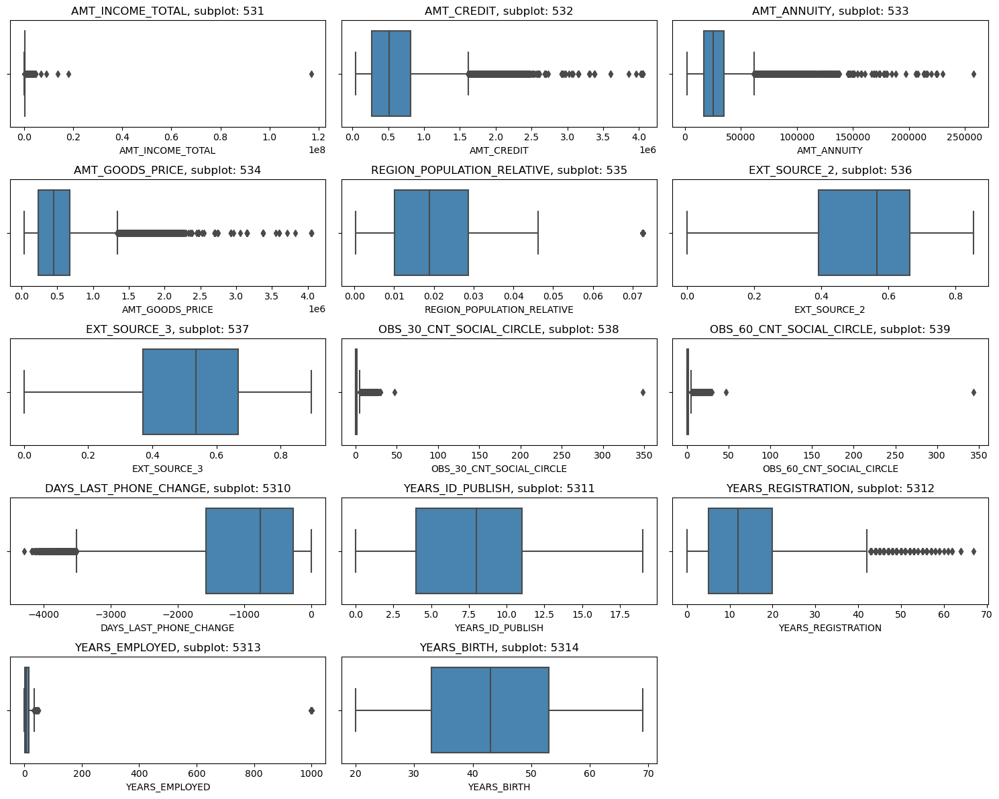

In [20]:
#Boxplot : Checking by Ploting BoxPlot

i = 5  # Row Count 
j = 3  # Column Count
k = 1  #  plot counter

fig = plt.figure(figsize=(15,12))

for col in num_cols:
    if col not in  ['SK_ID_CURR'] :

        plt.subplot(i, j, k)
        plt.title('{}, subplot: {}{}{}'.format(col, i, j, k))
        plt.xlabel(col)
        sns.boxplot(x = app_df[col], palette="Blues_d")
        k = k + 1

fig.tight_layout()
plt.show()

**Outliers observed in**

1. AMT_INCOME_TOTAL
2. AMT_CREDIT
3. REGION_POPULATION_RELATIVE
4. YEARS_EMPLOYED
5. AMT_GOODS_PRICE
6. AMT_ANNUITY
7. YEARS_REGISTRATION
8. DAYS_LAST_PHONE_CHANGE
9. OBS_30_CNT_SOCIAL_CIRCLE


**Points from Numerical Univariate Analysis**

- Maximum applicant change their phone within 0 days

### Outliet handling

In [29]:
#Analyzing AMT_INCOME_TOTAL

app_df["AMT_INCOME_TOTAL"].value_counts()

AMT_INCOME_TOTAL
135000.0    35750
112500.0    31019
157500.0    26556
180000.0    24719
90000.0     22483
            ...  
117324.0        1
64584.0         1
142897.5        1
109170.0        1
113062.5        1
Name: count, Length: 2548, dtype: int64

In [30]:
app_df["AMT_INCOME_TOTAL"].describe()

count    3.075110e+05
mean     1.687979e+05
std      2.371231e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64

- There shown huge difference between 75 percentile and max value, that seems outlier, from first hand look, we can analyze more to get more insights on this

**Binning Data**

In [33]:
#1. AMT_INCOME_TOTAL

app_df['INCOME_GROUP']= pd.qcut(app_df['AMT_INCOME_TOTAL'], q=[0,0.1,0.3,0.6,0.8,1],labels=['VeryLow','Low','Medium','High','VeryHigh'])


In [34]:
app_df['INCOME_GROUP'].value_counts()

INCOME_GROUP
Medium      84302
High        75513
Low         67187
VeryHigh    47118
VeryLow     33391
Name: count, dtype: int64

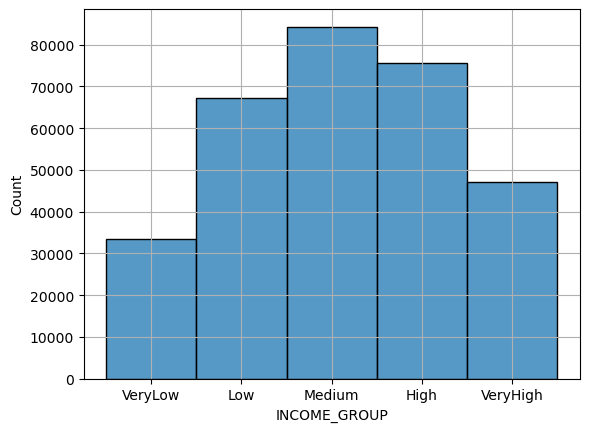

In [35]:
#Plot Histogram
sns.histplot(x = app_df["INCOME_GROUP"])
plt.grid()
plt.show()


**Point**
- More applicant belongs to Medium income group, then High income group

**Analyzing**

- AMT_CREDIT
- REGION_POPULATION_RELATIVE
- YEARS_EMPLOYED
- AMT_GOODS_PRICE
- AMT_ANNUITY
- YEARS_REGISTRATION
- DAYS_LAST_PHONE_CHANGE
- OBS_30_CNT_SOCIAL_CIRCLE


In [40]:
#AMT_CREDIT

app_df["AMT_CREDIT"].describe()


count    3.075110e+05
mean     5.990260e+05
std      4.024908e+05
min      4.500000e+04
25%      2.700000e+05
50%      5.135310e+05
75%      8.086500e+05
max      4.050000e+06
Name: AMT_CREDIT, dtype: float64

In [42]:
#REGION_POPULATION_RELATIVE
app_df["REGION_POPULATION_RELATIVE"].describe()


count    307511.000000
mean          0.020868
std           0.013831
min           0.000290
25%           0.010006
50%           0.018850
75%           0.028663
max           0.072508
Name: REGION_POPULATION_RELATIVE, dtype: float64

- MAx value of population is much higher than the 75th percentitle, which seems to be outlier

In [44]:
#YEARS_EMPLOYED
app_df["YEARS_EMPLOYED"].describe()


count    307511.000000
mean        184.837329
std         381.589859
min           0.000000
25%           2.000000
50%           6.000000
75%          15.000000
max         999.000000
Name: YEARS_EMPLOYED, dtype: float64

- Maximum Year of employment showing 999 years, which is not possible, may be error happened during data collection.

In [46]:
#AMT_GOODS_PRICE

app_df["AMT_GOODS_PRICE"].describe()


count    3.072330e+05
mean     5.383962e+05
std      3.694465e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.795000e+05
max      4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64

- max and min value way beyond from 75th and 25th percentile, which seems to be outlier

In [48]:
#AMT_ANNUITY
app_df["AMT_ANNUITY"].describe()

count    307499.000000
mean      27108.573909
std       14493.737315
min        1615.500000
25%       16524.000000
50%       24903.000000
75%       34596.000000
max      258025.500000
Name: AMT_ANNUITY, dtype: float64

In [50]:
#YEARS_REGISTRATION
app_df["YEARS_REGISTRATION"].describe()

count    307511.000000
mean         13.158209
std           9.640275
min           0.000000
25%           5.000000
50%          12.000000
75%          20.000000
max          67.000000
Name: YEARS_REGISTRATION, dtype: float64

In [52]:
#DAYS_LAST_PHONE_CHANGE

app_df["DAYS_LAST_PHONE_CHANGE"].describe()

count    307510.000000
mean       -962.858788
std         826.808487
min       -4292.000000
25%       -1570.000000
50%        -757.000000
75%        -274.000000
max           0.000000
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [54]:
#OBS_30_CNT_SOCIAL_CIRCLE

app_df["OBS_30_CNT_SOCIAL_CIRCLE"].describe()

count    306490.000000
mean          1.422245
std           2.400989
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max         348.000000
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: float64

In [55]:
app_df["YEARS_BIRTH"].describe()

count    307511.000000
mean         43.405137
std          11.945779
min          20.000000
25%          33.000000
50%          43.000000
75%          53.000000
max          69.000000
Name: YEARS_BIRTH, dtype: float64

- After Analyzing the below factor -- (their IQR), from first analysis
    - AMT_CREDIT
    - REGION_POPULATION_RELATIVE
    - YEARS_EMPLOYED
    - AMT_GOODS_PRICE
    - AMT_ANNUITY
    - YEARS_REGISTRATION
    - DAYS_LAST_PHONE_CHANGE
    - OBS_30_CNT_SOCIAL_CIRCLE
 - All having nearly same feature, there some value beyond their IQR range mostly at upper band, can be consider as outlier, need to further analysis. As of now we considers as outlier

In [22]:
# Binning Years_Birth for further analysis with target


app_df['AGE_GROUP']= pd.cut(app_df["YEARS_BIRTH"],bins=[20,30,40,50,60,999], labels=["20-30","30-40","40-50","50-60","60+"] )

app_df['AGE_GROUP'].value_counts()

AGE_GROUP
30-40    83212
40-50    74347
50-60    67864
20-30    52963
60+      29124
Name: count, dtype: int64

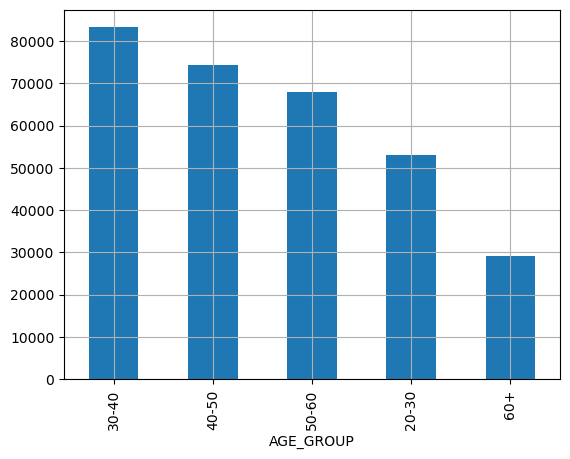

In [23]:
#Plot Histogram
app_df['AGE_GROUP'].value_counts().plot.bar()
plt.grid()
plt.show()

**Point**
 
- Maximum applicants belongs to 30-40 range

In [24]:
#Rest of outlier columns 

outlier_cols = ["AMT_CREDIT", "REGION_POPULATION_RELATIVE", "YEARS_EMPLOYED", "AMT_GOODS_PRICE", "AMT_ANNUITY", "YEARS_REGISTRATION", "DAYS_LAST_PHONE_CHANGE", "OBS_30_CNT_SOCIAL_CIRCLE"]

#### Outlier handling -- By Flooring & CApping


In [25]:
#Here i am
for i in outlier_cols:
    
    q1 = app_df[i].describe()["25%"]# 25th Percentile
    q3 = app_df[i].describe()["75%"]# 75th Percentile
    iqr = q3-q1
    upper_bound = q3 + 1.5 * iqr
    lower_bound = q1 - 1.5 * iqr
    app_df[i] = np.where(app_df[i] > upper_bound, upper_bound, app_df[i] )
    
    app_df[i] = np.where(app_df[i] < lower_bound, lower_bound, app_df[i] )

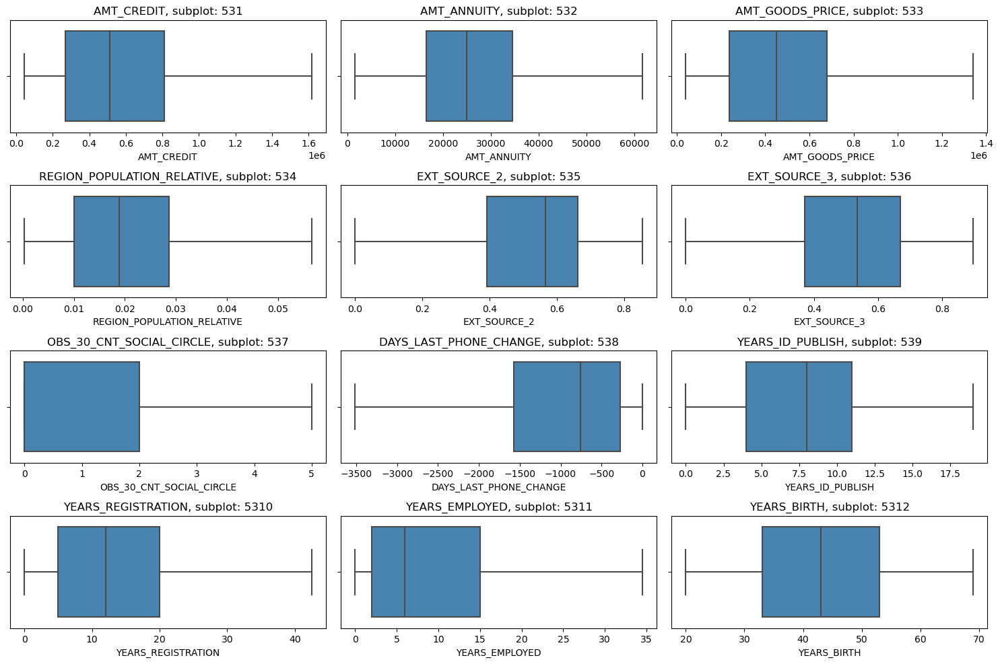

In [27]:
#Again plot boxplot for these columns

i = 5  # Row Count 
j = 3  # Column Count
k = 1  #  plot counter

fig = plt.figure(figsize=(15,12))

for col in num_cols:
    if col not in  ['SK_ID_CURR','AMT_INCOME_TOTAL', 'YEARS_AGE', 'OBS_60_CNT_SOCIAL_CIRCLE'] :

        plt.subplot(i, j, k)
        plt.title('{}, subplot: {}{}{}'.format(col, i, j, k))
        plt.xlabel(col)
        sns.boxplot(x = app_df[col], palette="Blues_d")
        k = k + 1

fig.tight_layout()
plt.show()

#### Categorical Columns -- Univariate analysis

In [26]:
#TAking some variable of Categorical Type for analysis

cat_col_Analysis =['TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS','OCCUPATION_TYPE']       

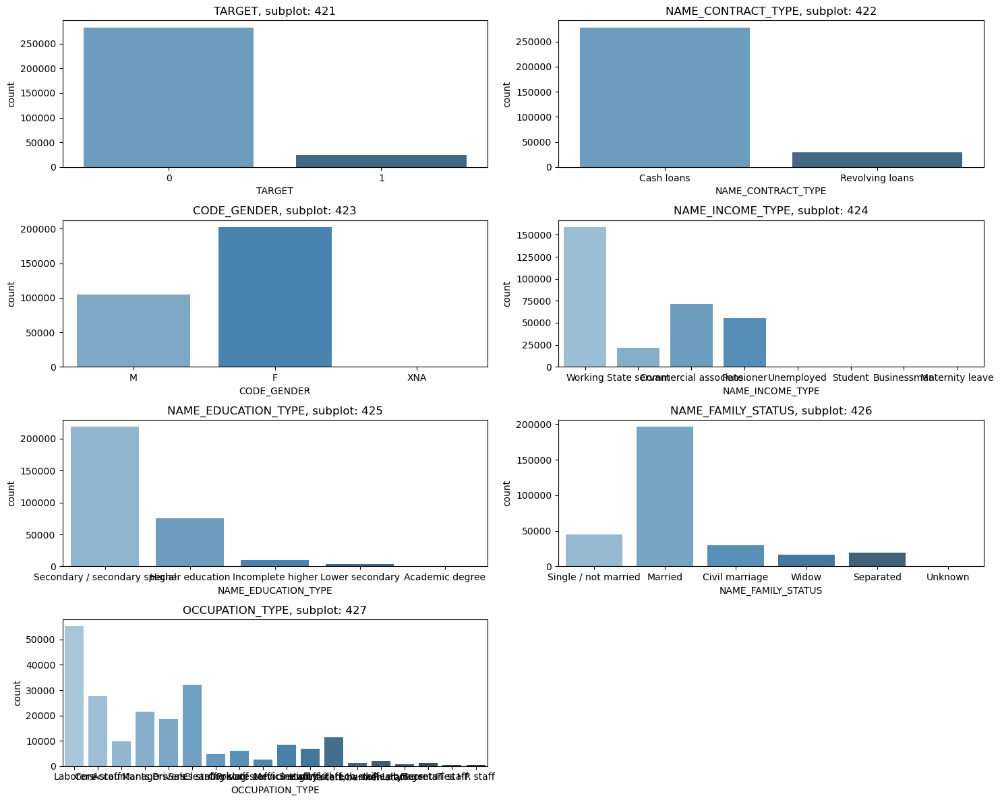

In [58]:
#Again plot boxplot for these columns

i = 4  # Row Count 
j = 2  # Column Count
k = 1  #  plot counter

fig = plt.figure(figsize=(15,12))

for col in cat_col_Analysis:
    plt.subplot(i, j, k)
    plt.title('{}, subplot: {}{}{}'.format(col, i, j, k))
    plt.xlabel(col)
    sns.countplot(x = app_df[col], palette="Blues_d")
    k = k + 1

fig.tight_layout()
plt.show()

#### Some Insights

1.  Very less applicant having payment difficulty as compared to Target = 0 : **Shows Data Imbalance**
2.  Cash loans offered are more than revolving loans
3.  More Females have taken loans in comparison to male.
4.  Most applicants have secondary education
5.  Most applicants are married
6.  Most applicant occupation type Labourer


In [74]:
#Analyze Occupation_Type
app_df["OCCUPATION_TYPE"].value_counts(normalize=True, dropna=False)

OCCUPATION_TYPE
NaN                      0.313455
Laborers                 0.179460
Sales staff              0.104393
Core staff               0.089655
Managers                 0.069497
Drivers                  0.060495
High skill tech staff    0.037007
Accountants              0.031911
Medicine staff           0.027762
Security staff           0.021856
Cooking staff            0.019336
Cleaning staff           0.015131
Private service staff    0.008624
Low-skill Laborers       0.006806
Waiters/barmen staff     0.004384
Secretaries              0.004244
Realty agents            0.002442
HR staff                 0.001831
IT staff                 0.001711
Name: proportion, dtype: float64

#### Points
- 31% applicants not specify their occupation Type

In [75]:
app_df["FLAG_OWN_CAR"].value_counts(dropna = False)

FLAG_OWN_CAR
N    202924
Y    104587
Name: count, dtype: int64

In [27]:
#Converting Flag_Own_Car to yes/No columns

app_df['OWN_CAR_YN']=np.where(app_df["FLAG_OWN_CAR"] == "Y", 1, 0)


In [33]:
app_df["FLAG_OWN_REALTY"].value_counts(dropna = False)

FLAG_OWN_REALTY
Y    213312
N     94199
Name: count, dtype: int64

In [28]:
#Converting Flag_Own_Realty to yes/No columns

app_df['OWN_REALTY_YN']= np.where(app_df["FLAG_OWN_REALTY"] =="Y",1,0)


In [29]:
#Remove Columns AMT_INCOME_TOTAL, YEARS_BIRTH from Num_Cols
num_cols.remove("AMT_INCOME_TOTAL")
num_cols.remove("YEARS_BIRTH")

#### BIVARIATE Analyis & MultiVariate also

In [30]:
num_col_Analysis = ['AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'YEARS_EMPLOYED']

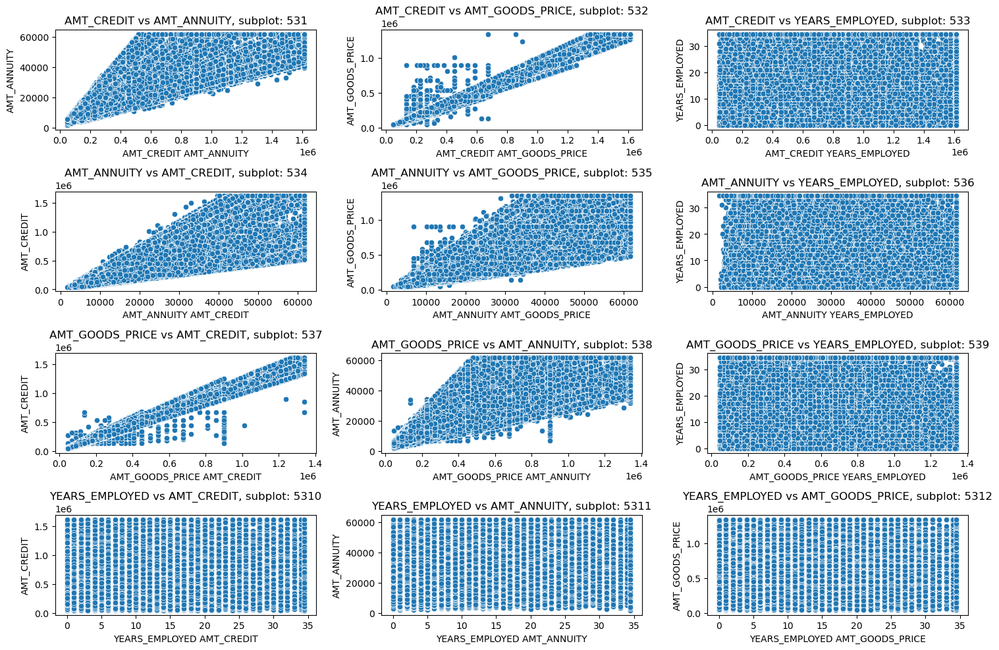

In [72]:
# Numerical Columns
i = 5  # Row Count 
j = 3  # Column Count
k = 1  #  plot counter

fig = plt.figure(figsize=(15,12))

for col1 in num_col_Analysis:
    for col2 in num_col_Analysis:
        if col1 != col2:
            plt.subplot(i, j, k)
            plt.title('{} vs {}, subplot: {}{}{}'.format(col1, col2, i, j, k))
            plt.xlabel(col1 + ' ' + col2 )
            sns.scatterplot(x = app_df[col1], y = app_df[col2], palette="Blues_d")
            k = k + 1

fig.tight_layout()
plt.show()

In [31]:
Flag_cols = ['FLAG_DOCUMENT_2','FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21']

In [37]:
#Add Age-Group and Income-Group in the cat_cols

cat_cols.append("INCOME_GROUP")
cat_cols.append("AGE_GROUP")
cat_cols.append("OWN_CAR_YN")
cat_cols.append("OWN_REALTY_YN")


#Remove 
cat_cols.remove("FLAG_OWN_CAR")
cat_cols.remove('FLAG_OWN_REALTY')

In [38]:
#Add YEARS_BIRTH in the num_cols for analysis with TARGET
num_cols.append("YEARS_BIRTH")

2.  **Numerical vs Categorical columns** 

#### Analyze various factor with TARGET

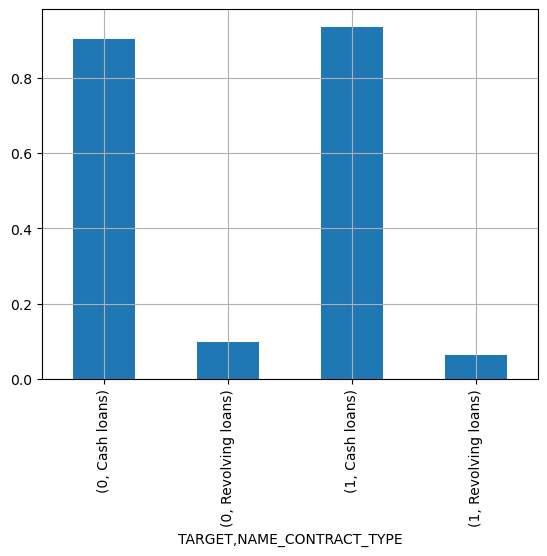

In [40]:
#1. NAME_CONTRACT TYPE Vs Target

app_df.groupby("TARGET")[["NAME_CONTRACT_TYPE"]].value_counts(normalize = True).plot.bar()
plt.grid()
plt.show()

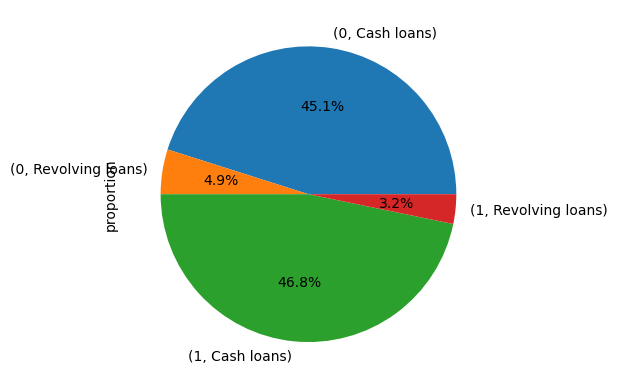

In [42]:
app_df.groupby("TARGET")[["NAME_CONTRACT_TYPE"]].value_counts(normalize = True).plot.pie(autopct='%1.1f%%')

plt.show()

**POINTS**
  
-  Most loan applications as of Cash Loans. 
-  For Target 0 - 45.1% and almost 46.8% for Target-1
-  Most cash loan having payment difficulty as compare to Revolving loan 

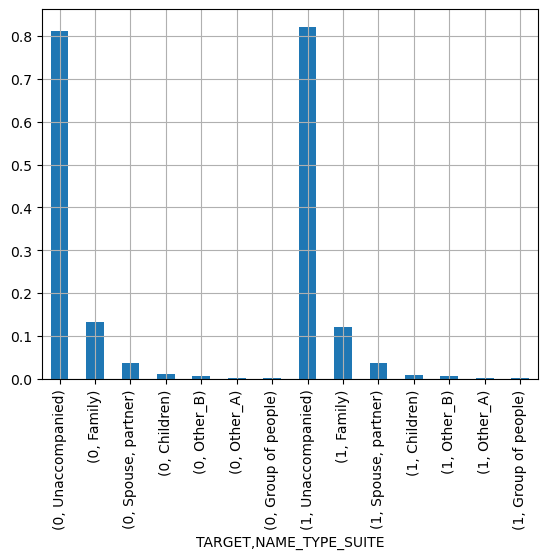

In [42]:
#2. NAME_TYPE_SUIT TYPE Vs Target

app_df.groupby("TARGET")[["NAME_TYPE_SUITE"]].value_counts(normalize = True).plot.bar()
plt.grid()
plt.show()

**POINTS**
  
- Maximum applicant apply for loan Unaccompanied both Target 1 and 0, 
- This feature does not show any inclination regarding default 


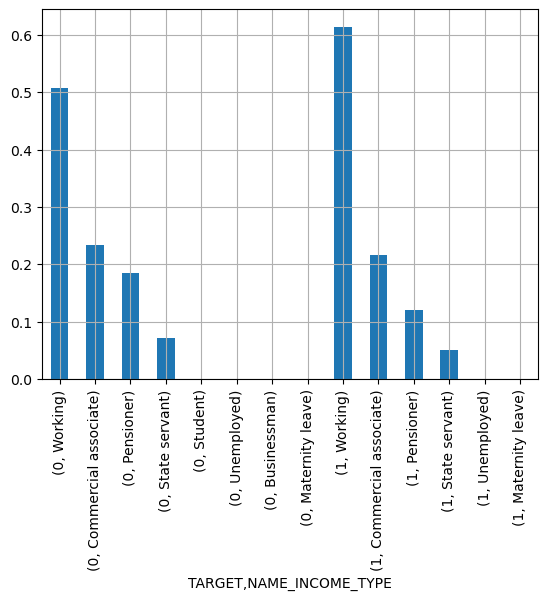

In [43]:
#3. NAME_INCOME_TYPE VS TARGET

app_df.groupby("TARGET")[["NAME_INCOME_TYPE"]].value_counts(normalize = True).plot.bar()
plt.grid()
plt.show()

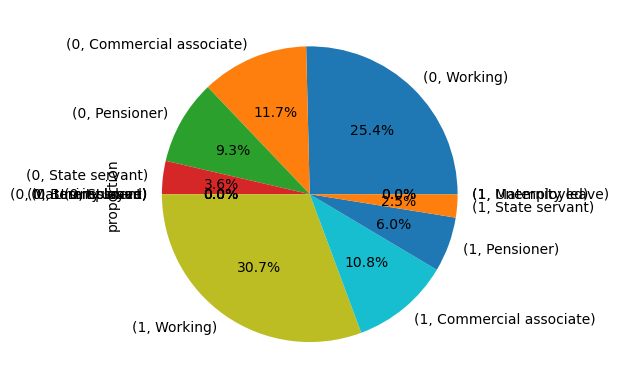

In [43]:
app_df.groupby("TARGET")[["NAME_INCOME_TYPE"]].value_counts(normalize = True).plot.pie(autopct='%1.1f%%')

plt.show()

**POINTS**

- Mostly applicant are of working type 
- 50% working in case of Target 0 and 63% in case of Target 1 are working income types. 


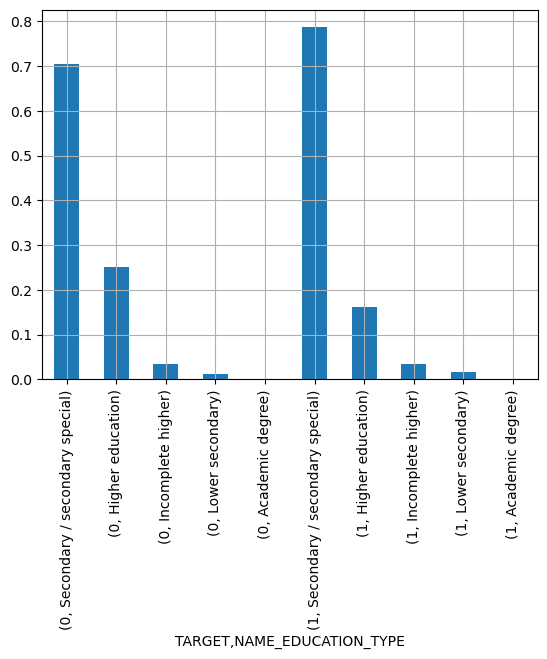

In [44]:
#4. NAME_EDUCATION_TYPE VS TARGET

app_df.groupby("TARGET")[["NAME_EDUCATION_TYPE"]].value_counts(normalize = True).plot.bar()
plt.grid()
plt.show()

**POINTS**

- Mostly applicants having Secondary Education in both cases
- In both Target 0 and 1, applicants with Secondary Education has applied for loans more than others.
- Approx. 80% of defaulting payments are from applicants with secondary education. 


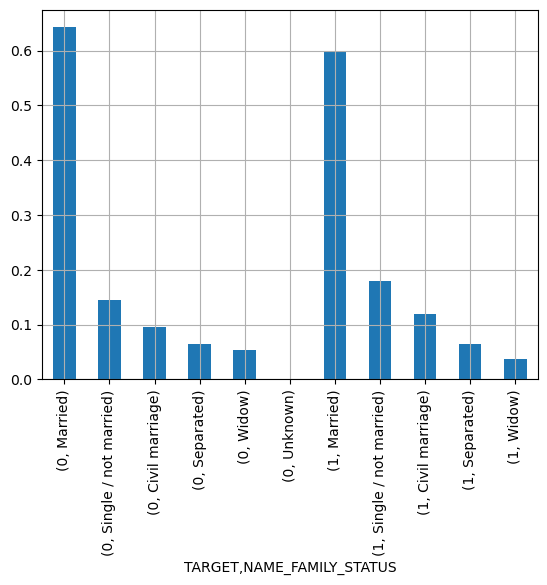

In [45]:
#NAME_FAMILY_STATUS Vs TARGET

app_df.groupby("TARGET")[["NAME_FAMILY_STATUS"]].value_counts(normalize = True).plot.bar()
plt.grid()
plt.show()

**POINTS** 
 
- Mostly applicants are Married.
- 60% of Target 1 -- and 62% Target = 1


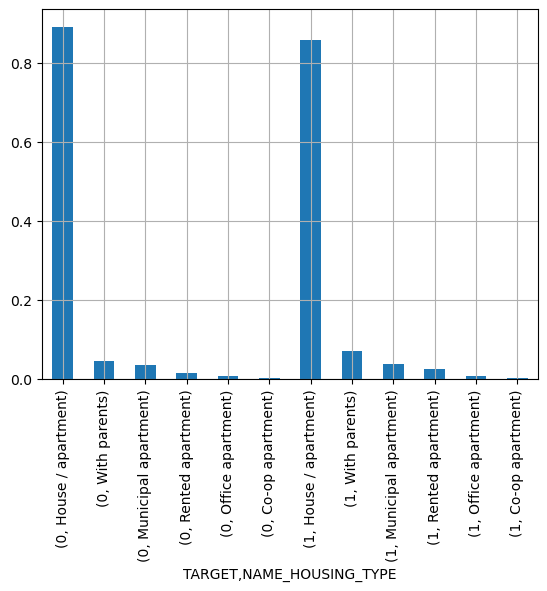

In [47]:
#NAME_HOSUING_TYPE vs TARGET

app_df.groupby("TARGET")[["NAME_HOUSING_TYPE"]].value_counts(normalize = True).plot.bar()
plt.grid()
plt.show()

- MAximum applicants owning house (90% - Target -0, 85% - Target - 1) -- This does not seems deciding parameter for default


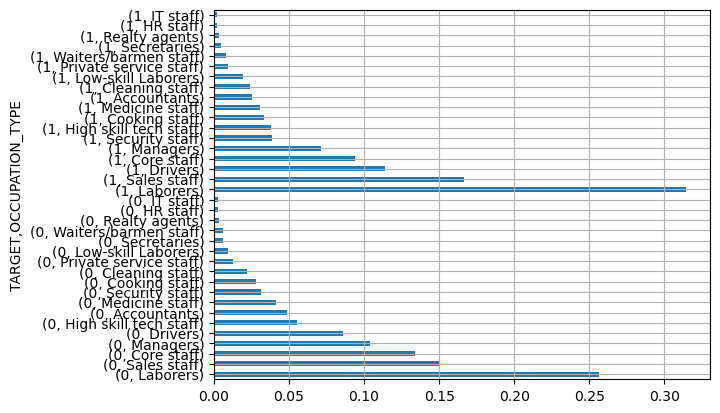

In [41]:
#OCCUPATION_TYPE vs TARGET

app_df.groupby("TARGET")[["OCCUPATION_TYPE"]].value_counts(normalize = True).plot.barh()
plt.grid()
plt.show()


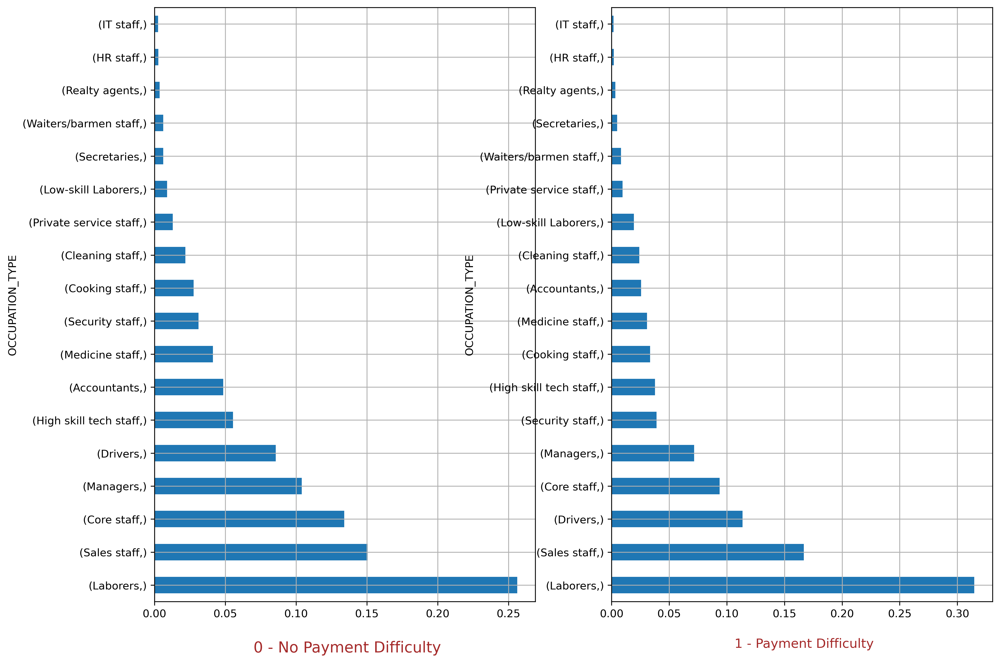

In [35]:
plt.figure(figsize =(14, 10), dpi = 300)

plt.subplot(1,2,1)
app_df[app_df.TARGET == 0][["OCCUPATION_TYPE"]].value_counts(normalize = True).plot.barh()

plt.xlabel("\n 0 - No Payment Difficulty", fontdict={'fontsize':14,"fontweight":5,"color":'Brown'})
plt.grid()

plt.subplot(1,2,2)
app_df[app_df.TARGET == 1][["OCCUPATION_TYPE"]].value_counts(normalize = True).plot.barh()

plt.xlabel("\n 1 - Payment Difficulty", fontdict={'fontsize':12,"fontweight":5,"color":'Brown'})
plt.grid()
plt.show()

-  In case of default case approx. 35% belongs to labourers.
- Most applicants as Labourer


In [63]:
app_df["ORGANIZATION_TYPE"].value_counts(normalize=True)

ORGANIZATION_TYPE
Business Entity Type 3    0.221104
XNA                       0.180072
Self-employed             0.124913
Other                     0.054252
Medicine                  0.036399
Business Entity Type 2    0.034317
Government                0.033833
School                    0.028919
Trade: type 7             0.025466
Kindergarten              0.022373
Construction              0.021856
Business Entity Type 1    0.019459
Transport: type 4         0.017554
Trade: type 3             0.011356
Industry: type 9          0.010952
Industry: type 3          0.010660
Security                  0.010559
Housing                   0.009619
Industry: type 11         0.008793
Military                  0.008566
Bank                      0.008153
Agriculture               0.007980
Police                    0.007613
Transport: type 2         0.007167
Postal                    0.007014
Security Ministries       0.006419
Trade: type 2             0.006179
Restaurant                0.005889
Se

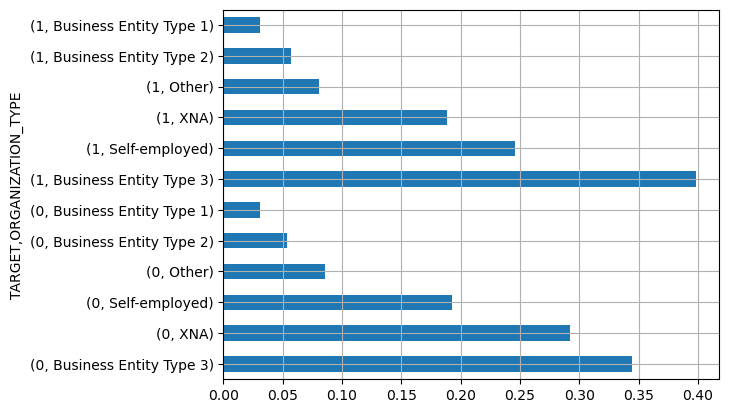

In [66]:
#ORGANIZATION_TYPE

app_df[app_df["ORGANIZATION_TYPE"].isin(["Business Entity Type 3","Business Entity Type 2","Business Entity Type 1", "Self-employed","Other","XNA"])].groupby("TARGET")[["ORGANIZATION_TYPE"]].value_counts(normalize = True).plot.barh()
plt.grid()
plt.show()


- Business ENTITY TYPE 3 AND SELF EMPLOYED add upto more than 40% defaulters. 
- The highest % of loan defaulters are also seems this category. 


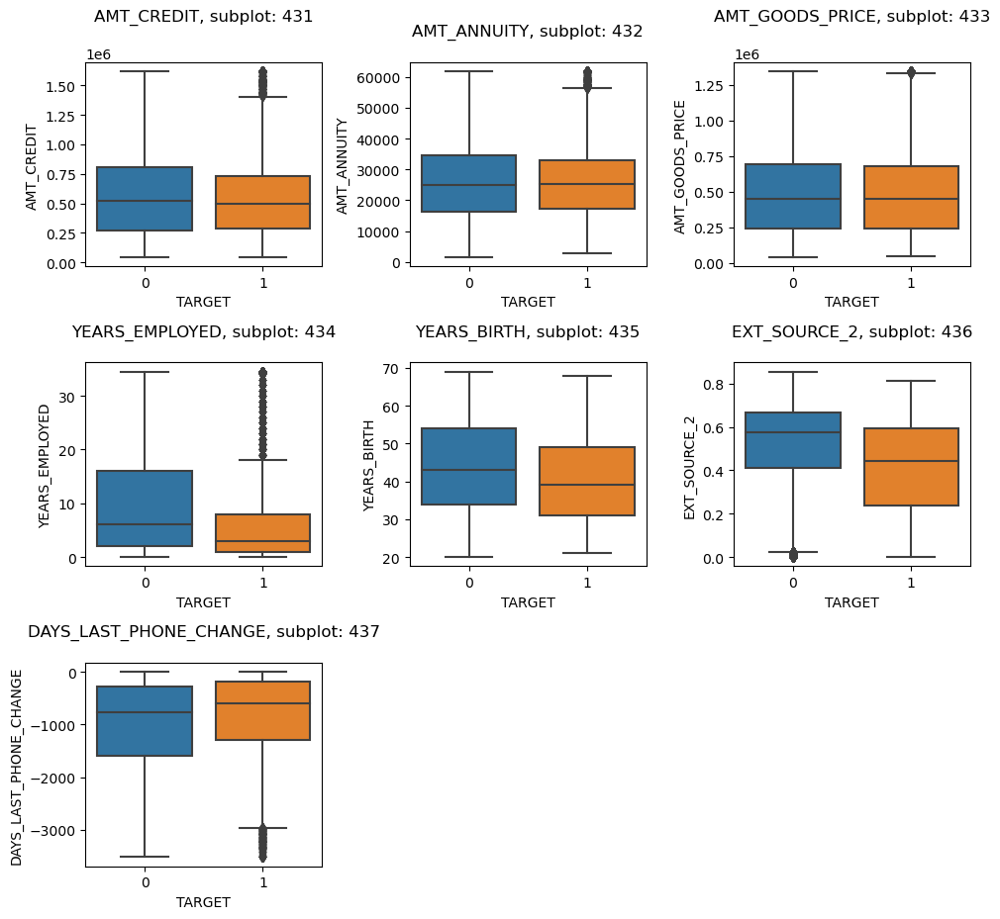

In [46]:
#Analyze TARGET with more possible factors
a = 4  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(10,12))

for col in ["AMT_CREDIT","AMT_ANNUITY", "AMT_GOODS_PRICE","YEARS_EMPLOYED", "YEARS_BIRTH","EXT_SOURCE_2","DAYS_LAST_PHONE_CHANGE"]:
        plt.subplot(a, b, c)
        plt.title('{}, subplot: {}{}{}\n'.format(col, a, b, c))
        plt.xlabel(i)
        sns.boxplot(x=app_df["TARGET"],y=app_df[col])

        c = c + 1

fig.tight_layout()
plt.show()

#### After Analysis some points

1.  Amount credit to Target 0 is more than 1
2.  AMT_CREDIT - Appears lower for Target 1, which is a good sign as lesser default loss to the company.
3.  Amt Annuity to target 0 is more than 1, For Target 1 having oulier
4.  Amt good price in target 0 is slightly greater than 1, For Target 1 having oulier
5.  More applicants are experienced in case of Target = 0 than target = 1, YEARS_EMPLOYED having outliers values 
6.  YEARS_EMPLOYED has large no of rows of incorrect data and hence the data representation is incorrect
7.  Mostly applicant belongs to 35-55 age group in case Target 0 as comapre to 32-48 in case of Target = 1
8.  IQR having lower band in case TARGET 1 shows younger are defaulting more
9.  EXT_SOURCE_2 is clearing showing that TARGET 0 has higher densiy of higher scores

10. DAYS_LAST_PHONE_CHANGE- More people from the Target 1 have changed their phone earlier than Target 1. Indicating intention issues in repaying loan



In [55]:
app_df.groupby("TARGET")['FLAG_DOCUMENT_2'].value_counts(normalize=True)

TARGET  FLAG_DOCUMENT_2
0       0                  0.999968
        1                  0.000032
1       0                  0.999839
        1                  0.000161
Name: proportion, dtype: float64

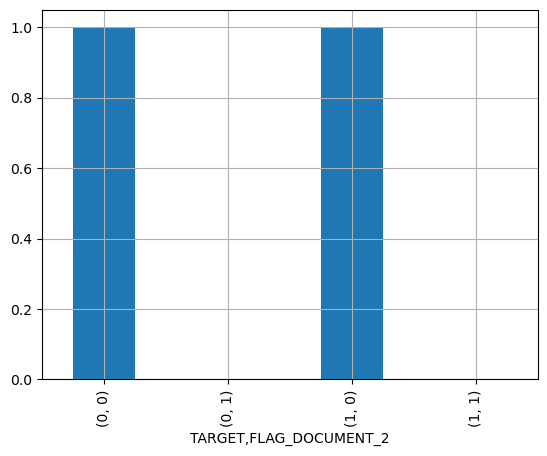

In [54]:
app_df.groupby("TARGET")['FLAG_DOCUMENT_2'].value_counts(normalize=True).plot.bar()

plt.grid()
plt.show()

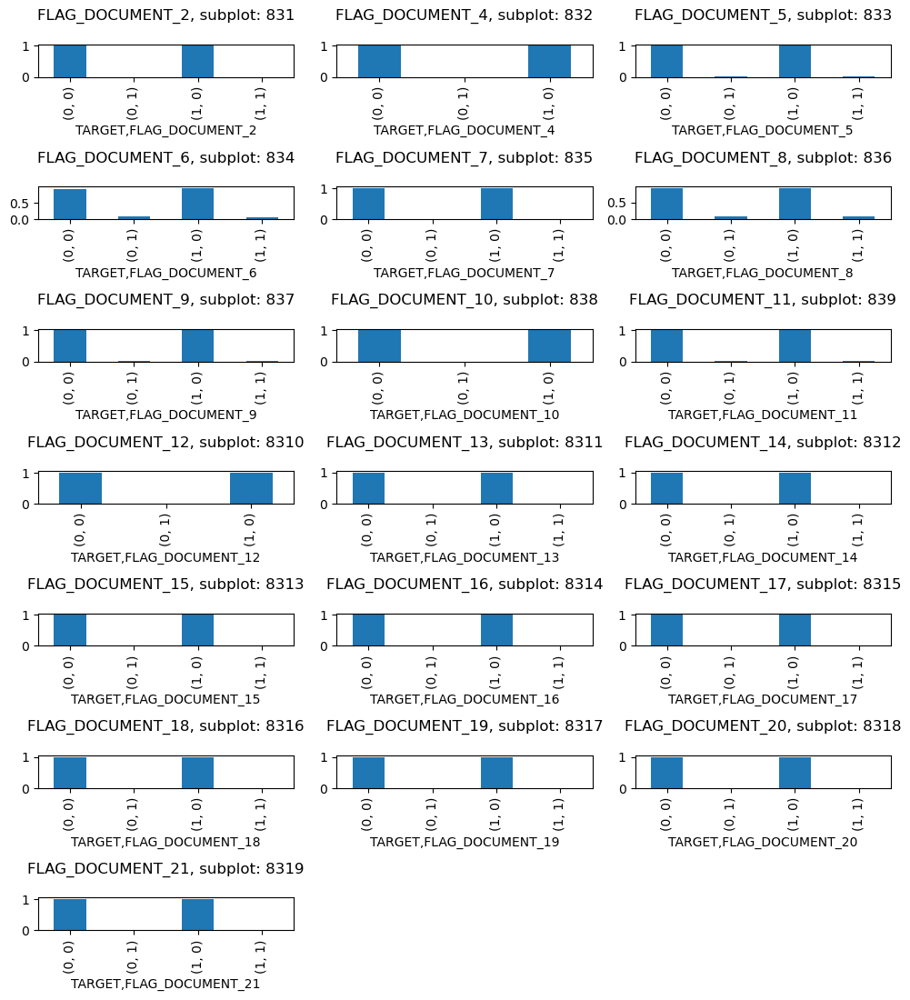

In [49]:
#Analyze TARGET with Falg columns
a = 8  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(10,12))

for col in Flag_cols:
        plt.subplot(a, b, c)
        plt.title('{}, subplot: {}{}{}\n'.format(col, a, b, c))
        plt.xlabel(i)
        app_df.groupby("TARGET")[col].value_counts(normalize=True).plot.bar()
#         plt.grid()
        c = c + 1

fig.tight_layout()
plt.show()

**Points**
 
- After analysis it shows that Document columns have not very effect on Target, we are not taking these columns for further analysis
  
- These columns also we are not considering for futher analysis  FLAG_WORK_PHONE, FLAG_CONT_MOBILE, FLAG_EMAIL, WEEKDAY_APPR_PROCESS_START, HOUR_APPR_PROCESS_START, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, not showing much impact of TARGET


In [39]:

#Add Columns 
#Drop Below columns
#1.FLAG_OWN_REALTY, FLAG_OWN_CAR -- These two columns we reconfigure in OWN_REALTY_YN & OWN_CAR_YN 
#2.YEARS_BIRTH, AMT_INCOME_TOTAL --These two reconfigure in AGE_GROUP, INCOME_GROUP

Flag_cols.append("FLAG_OWN_REALTY")
Flag_cols.append("FLAG_OWN_CAR")


 


Flag_cols.extend(["FLAG_WORK_PHONE", "FLAG_PHONE","FLAG_CONT_MOBILE", "FLAG_EMAIL", "WEEKDAY_APPR_PROCESS_START", "HOUR_APPR_PROCESS_START", "AMT_REQ_CREDIT_BUREAU_HOUR", "AMT_REQ_CREDIT_BUREAU_DAY", "AMT_REQ_CREDIT_BUREAU_WEEK"
])


In [48]:
print(len(Flag_cols))

30


In [40]:
#Remove all falg column from cat_cols
for col in cat_cols:
    if col in Flag_cols:
        cat_cols.remove(col)

In [39]:
len(cat_cols)

45

In [41]:
app_df = app_df.drop(Flag_cols,axis=1)

In [51]:
len(app_df.columns)

46

#### Multivariate Analysis with TARGET

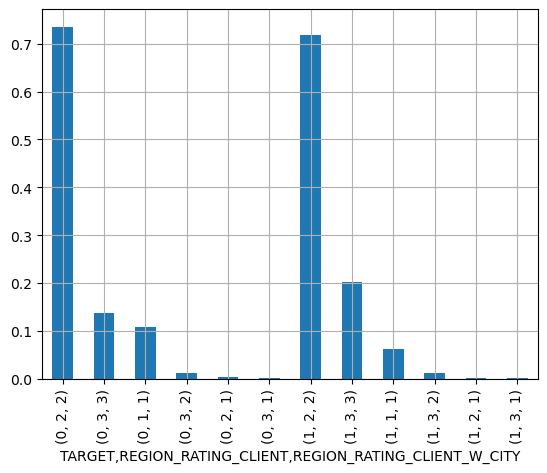

In [68]:
# 1.REGION_RATING_CLIENT'& 'REGION_RATING_CLIENT_W_CITY'- 

app_df.groupby(by=["TARGET"])[["REGION_RATING_CLIENT","REGION_RATING_CLIENT_W_CITY"]].value_counts(normalize=True).plot.bar()
plt.grid()
plt.show()


#POINTS

- Region 2 has the highest approx. 70% applicants both in TARGET 0 and Target 1

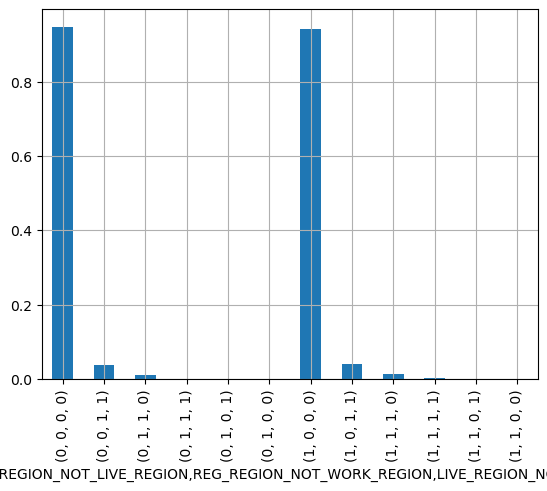

In [72]:
# 2.REG_REGION_NOT_LIVE_REGION, REGION_NOT_WORK_REGION, LIVE_REGION_NOT_WORK_REGION'- 

app_df.groupby(by=["TARGET"])[["REG_REGION_NOT_LIVE_REGION","REG_REGION_NOT_WORK_REGION","LIVE_REGION_NOT_WORK_REGION"]].value_counts(normalize=True).plot.bar()
plt.grid()
plt.show()


#POINTS

- For both Target 0 and Target 1 out of Region 0 having hight percentage


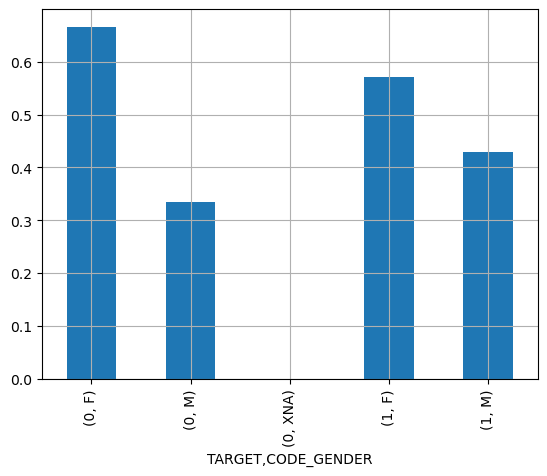

In [74]:
# 4.'CODE_GENDER'  VS TARGET
 
app_df.groupby(by=["TARGET"])[["CODE_GENDER"]].value_counts(normalize=True).plot.bar()
plt.grid()
plt.show()


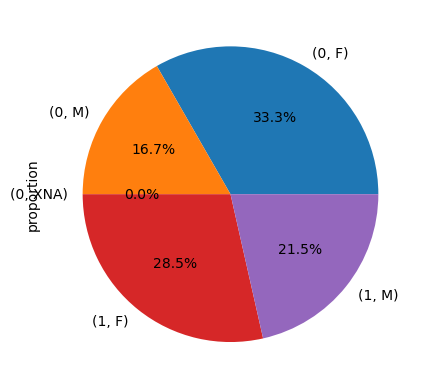

In [64]:
app_df.groupby(by=["TARGET"])[["CODE_GENDER"]].value_counts(normalize=True).plot.pie(autopct='%1.1f%%')

plt.show()


**POINTS**

1. Ratio defaulter case between Male and Female, shows that as compare to Female MAle defaulters are more.
2. As shown in the plot data has more females as loan applicant.
3. Similarly as per plot, though male applicants are lower, ratio of male applicants deafulting is higher.



In [58]:
app_df["AMT_CREDIT"].value_counts()

AMT_CREDIT
450000.0     9709
675000.0     8877
225000.0     8162
180000.0     7342
270000.0     7241
             ... 
1409719.5       1
391009.5        1
311562.0        1
1215499.5       1
1391130.0       1
Name: count, Length: 4969, dtype: int64

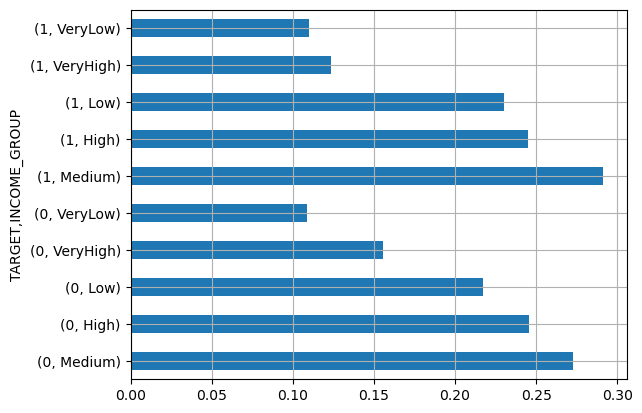

In [65]:
#TARGET VS INCOME Group and AMT_CREDIT

app_df.groupby(by="TARGET")[["INCOME_GROUP"]].value_counts(normalize=True).plot.barh()
plt.grid()
plt.show()

In [59]:
#Analyzing TARGET VS AMt_CREDIT and INCOME_GROUP

res_AMT_Credit = pd.pivot_table(data=app_df, index='INCOME_GROUP',columns='TARGET',values='AMT_CREDIT', aggfunc="mean")
round(res_AMT_Credit,2)

TARGET,0,1
INCOME_GROUP,,
VeryLow,347728.13,372671.88
Low,456229.41,451168.41
Medium,566961.63,541578.92
High,692315.40,640005.84
VeryHigh,860532.97,769396.29


**POINTS**

1. We can infer that though the maximum no of loans is given to Medium income group. 
    Default value per loan is highest in High income group as the AMT_CREDIT is higher too. 
    The loan book of the financial institution can get affected due to higher amount not being paid back.
2. The company must devise a different set of rules and policies while approving higher income group loans.


In [71]:
app_df["NAME_FAMILY_STATUS"].value_counts()

NAME_FAMILY_STATUS
Married                 196432
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Unknown                      2
Name: count, dtype: int64

In [39]:
#TARGET VS INCOME_GROUP and AGE_GROUP

res_INCOME_AGE = pd.pivot_table(data=app_df, index="INCOME_GROUP", columns="AGE_GROUP", values="TARGET")
res_INCOME_AGE

AGE_GROUP,"(20, 30]","(30, 40]","(40, 50]","(50, 60]","(60, 999]"
INCOME_GROUP,,,,,
VeryLow,0.139439,0.106182,0.080784,0.055290,0.051708
Low,0.122840,0.099074,0.079538,0.060574,0.050127
Medium,0.119073,0.101579,0.078901,0.059159,0.048439
High,0.105790,0.089443,0.076267,0.063187,0.048583
VeryHigh,0.080370,0.070902,0.063112,0.054928,0.042189


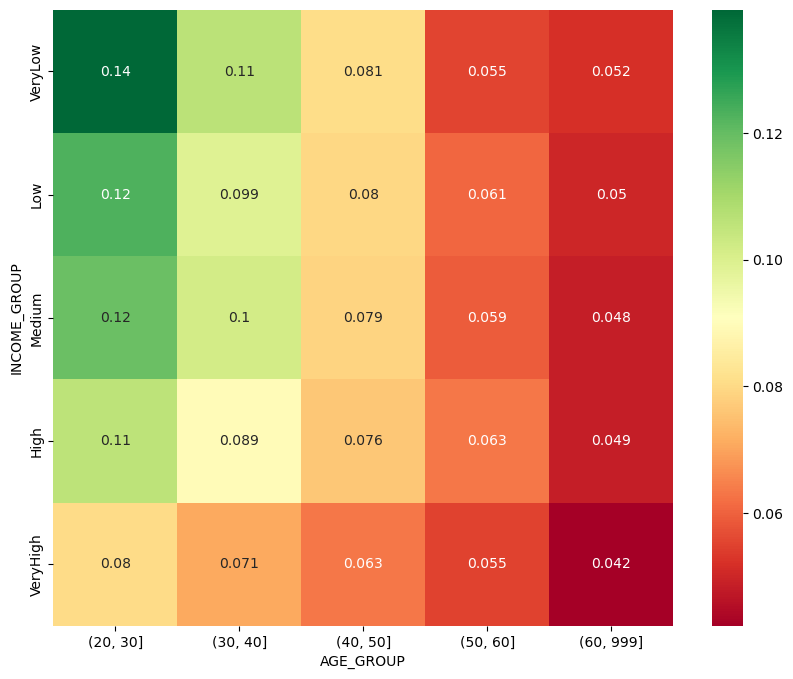

In [40]:
plt.figure(figsize=(10,8))
sns.heatmap(res_INCOME_AGE, annot=True , cmap="RdYlGn")
plt.show()

**Points**

1. AGE_GROPUP - 40+ are more in tARGET 0. In Target 1- 20-30 have higher share. Age does seem like influencing default as shown in earlier plot also.
2. INCOME_GROUP - Medium income group, Low and very Low income group have more count in Target 1 then other income group

In [42]:
#TARGET VS NAME_FAMILY_STATUS and AGE_GROUP

res_FAMILY_AGE = pd.pivot_table(data=app_df, index="NAME_FAMILY_STATUS", columns="AGE_GROUP", values="TARGET")
res_FAMILY_AGE

AGE_GROUP,20-30,30-40,40-50,50-60,60+
NAME_FAMILY_STATUS,,,,,
Civil marriage,0.120414,0.109469,0.096966,0.072447,0.059231
Married,0.108946,0.086831,0.069914,0.055794,0.047188
Separated,0.130675,0.096441,0.079203,0.066615,0.051641
Single / not married,0.118754,0.108628,0.090704,0.066132,0.048465
Unknown,NaN,0.000000,NaN,NaN,NaN
Widow,0.076087,0.096350,0.063889,0.059202,0.051068


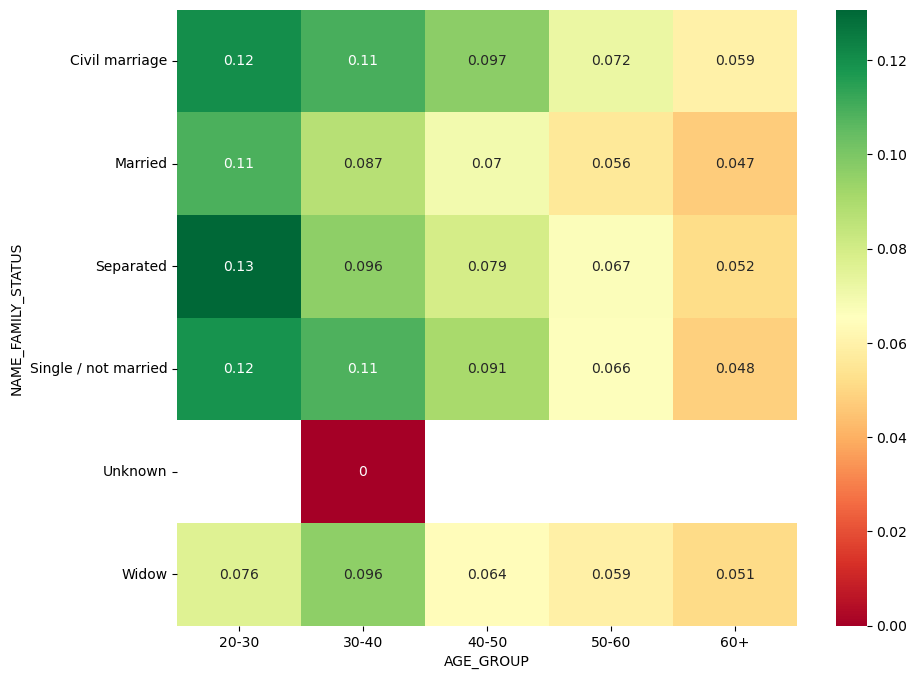

In [43]:
plt.figure(figsize=(10,8))
sns.heatmap(res_FAMILY_AGE, annot=True , cmap="RdYlGn")
plt.show()

**POINTS**

1. In Married Applicant in the age group 20-30 amd 30-40 is the largest group of applicant with payment difficulties then other age group.
2. In all Marital status Age 20-30 having largest share in payment difficulty

In [67]:
#Analysing relationship of AMT_CREDIT with Gender and Income type for Target 1 & Target 0

res_TARGET_1 =pd.pivot_table(data=app_df[ app_df["TARGET"] ==1] , index="NAME_INCOME_TYPE",columns='CODE_GENDER',values='AMT_CREDIT', aggfunc="mean")
round(res_TARGET_1,0)

CODE_GENDER,F,M
NAME_INCOME_TYPE,,
Commercial associate,605041.0,593991.0
Maternity leave,929250.0,NaN
Pensioner,556533.0,554262.0
State servant,610823.0,611347.0
Unemployed,653250.0,546750.0
Working,534914.0,531730.0


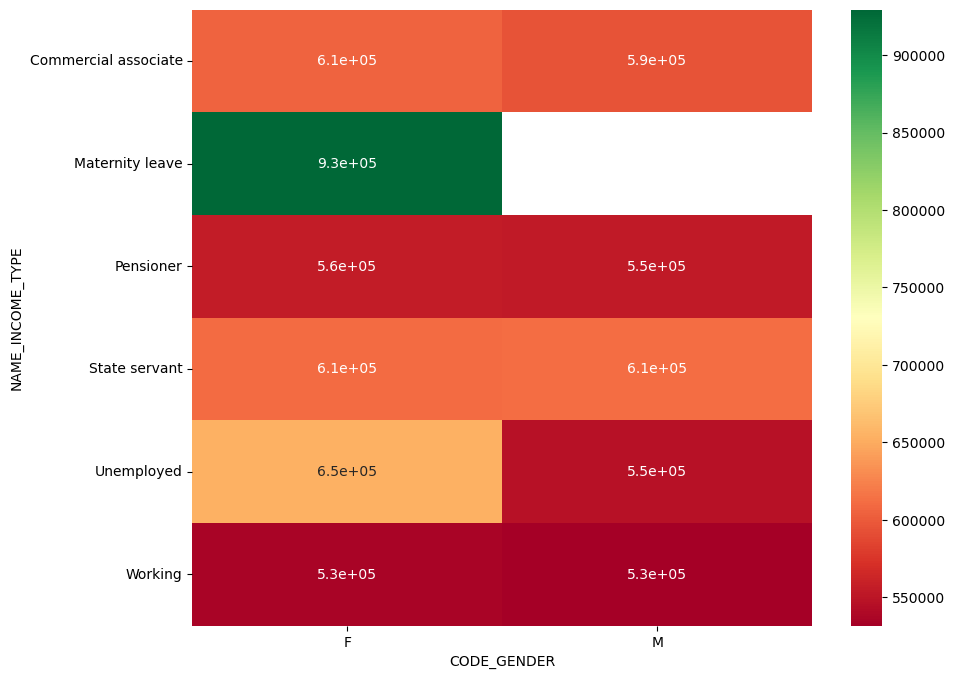

In [68]:
plt.figure(figsize=(10,8))
sns.heatmap(res_TARGET_1, annot=True , cmap="RdYlGn")
plt.show()

- Female on Maternity leave and unmployed, Females and males are defaulting larger loan values credited to them

#### Calculating Imbalance percentage

In [90]:
#As per the analysis till now
# Since the majority is target = 0 and minority is target = 1    


imb_ratio = round(len( app_df[app_df["TARGET"] == 0 ] ) / len( app_df[ app_df["TARGET"] == 1 ] ),2)

print('Imbalance Ratio:', imb_ratio)

Imbalance Ratio: 11.39


**Default ratio is 11.39% (Imbalance ratio)**

#### TOP COORELATION


In [48]:
print(num_cols)

['SK_ID_CURR', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'EXT_SOURCE_2', 'OBS_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'YEARS_ID_PUBLISH', 'YEARS_REGISTRATION', 'YEARS_EMPLOYED', 'YEARS_BIRTH']


In [49]:
# COLS_FOR_CORR = ['YEARS_EMPLOYED','AMT_CREDIT','AMT_ANNUITY','OBS_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE']
COLS_FOR_CORR = ['YEARS_EMPLOYED','AMT_CREDIT','AMT_ANNUITY','OBS_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE', 'AMT_GOODS_PRICE','REGION_POPULATION_RELATIVE','DAYS_LAST_PHONE_CHANGE', 'YEARS_ID_PUBLISH', 'YEARS_REGISTRATION', 'YEARS_EMPLOYED', 'YEARS_BIRTH']


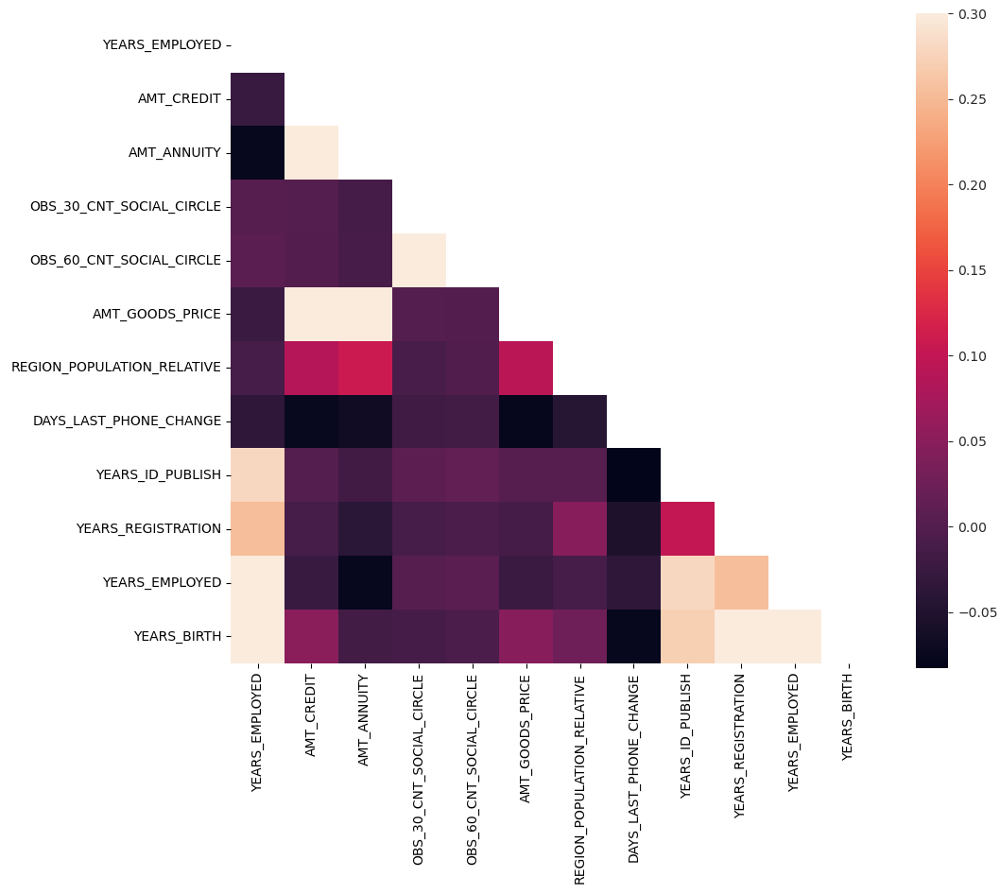

In [50]:
corr = app_df[app_df["TARGET"] == 0][COLS_FOR_CORR].corr()
# corr = app_df[app_df["TARGET"] == 0].corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(11, 9))
with sns.axes_style("white"):
    ax = sns.heatmap(corr, mask=mask, vmax=.3, square=True)

### Finding Top Coorelation

**For Target == 1 -- No Payment difficulties**

In [51]:
app_df[app_df["TARGET"] == 0][COLS_FOR_CORR].corr()

,YEARS_EMPLOYED,AMT_CREDIT,AMT_ANNUITY,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_LAST_PHONE_CHANGE,YEARS_ID_PUBLISH,YEARS_REGISTRATION,YEARS_EMPLOYED,YEARS_BIRTH
YEARS_EMPLOYED,1.000000,-0.025552,-0.076543,0.002574,0.006854,-0.023779,-0.011253,-0.035405,0.279391,0.254229,1.000000,0.674407
AMT_CREDIT,-0.025552,1.000000,0.794822,0.001109,0.000209,0.985841,0.088673,-0.074787,0.001510,-0.012191,-0.025552,0.049398
AMT_ANNUITY,-0.076543,0.794822,1.000000,-0.013145,-0.010893,0.797647,0.107379,-0.066562,-0.016306,-0.041022,-0.076543,-0.014699
OBS_30_CNT_SOCIAL_CIRCLE,0.002574,0.001109,-0.013145,1.000000,0.884378,0.000986,-0.008744,-0.017944,0.009375,-0.011387,0.002574,-0.013614
OBS_60_CNT_SOCIAL_CIRCLE,0.006854,0.000209,-0.010893,0.884378,1.000000,0.000645,-0.002876,-0.014710,0.012892,-0.008203,0.006854,-0.007315
AMT_GOODS_PRICE,-0.023779,0.985841,0.797647,0.000986,0.000645,1.000000,0.092439,-0.078237,0.003338,-0.013990,-0.023779,0.047613
REGION_POPULATION_RELATIVE,-0.011253,0.088673,0.107379,-0.008744,-0.002876,0.092439,1.000000,-0.043489,0.003420,0.048278,-0.011253,0.025885
DAYS_LAST_PHONE_CHANGE,-0.035405,-0.074787,-0.066562,-0.017944,-0.014710,-0.078237,-0.043489,1.000000,-0.083031,-0.053623,-0.035405,-0.076394
YEARS_ID_PUBLISH,0.279391,0.001510,-0.016306,0.009375,0.012892,0.003338,0.003420,-0.083031,1.000000,0.099670,0.279391,0.270082
YEARS_REGISTRATION,0.254229,-0.012191,-0.041022,-0.011387,-0.008203,-0.013990,0.048278,-0.053623,0.099670,1.000000,0.254229,0.332771


In [52]:
app_df[app_df["TARGET"] == 0][COLS_FOR_CORR].corr().abs()

,YEARS_EMPLOYED,AMT_CREDIT,AMT_ANNUITY,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_LAST_PHONE_CHANGE,YEARS_ID_PUBLISH,YEARS_REGISTRATION,YEARS_EMPLOYED,YEARS_BIRTH
YEARS_EMPLOYED,1.000000,0.025552,0.076543,0.002574,0.006854,0.023779,0.011253,0.035405,0.279391,0.254229,1.000000,0.674407
AMT_CREDIT,0.025552,1.000000,0.794822,0.001109,0.000209,0.985841,0.088673,0.074787,0.001510,0.012191,0.025552,0.049398
AMT_ANNUITY,0.076543,0.794822,1.000000,0.013145,0.010893,0.797647,0.107379,0.066562,0.016306,0.041022,0.076543,0.014699
OBS_30_CNT_SOCIAL_CIRCLE,0.002574,0.001109,0.013145,1.000000,0.884378,0.000986,0.008744,0.017944,0.009375,0.011387,0.002574,0.013614
OBS_60_CNT_SOCIAL_CIRCLE,0.006854,0.000209,0.010893,0.884378,1.000000,0.000645,0.002876,0.014710,0.012892,0.008203,0.006854,0.007315
AMT_GOODS_PRICE,0.023779,0.985841,0.797647,0.000986,0.000645,1.000000,0.092439,0.078237,0.003338,0.013990,0.023779,0.047613
REGION_POPULATION_RELATIVE,0.011253,0.088673,0.107379,0.008744,0.002876,0.092439,1.000000,0.043489,0.003420,0.048278,0.011253,0.025885
DAYS_LAST_PHONE_CHANGE,0.035405,0.074787,0.066562,0.017944,0.014710,0.078237,0.043489,1.000000,0.083031,0.053623,0.035405,0.076394
YEARS_ID_PUBLISH,0.279391,0.001510,0.016306,0.009375,0.012892,0.003338,0.003420,0.083031,1.000000,0.099670,0.279391,0.270082
YEARS_REGISTRATION,0.254229,0.012191,0.041022,0.011387,0.008203,0.013990,0.048278,0.053623,0.099670,1.000000,0.254229,0.332771


In [53]:
app_df[app_df["TARGET"] == 0][COLS_FOR_CORR].corr().abs().unstack()

YEARS_EMPLOYED              YEARS_EMPLOYED                1.000000
                            AMT_CREDIT                    0.025552
                            AMT_ANNUITY                   0.076543
                            OBS_30_CNT_SOCIAL_CIRCLE      0.002574
                            OBS_60_CNT_SOCIAL_CIRCLE      0.006854
                            AMT_GOODS_PRICE               0.023779
                            REGION_POPULATION_RELATIVE    0.011253
                            DAYS_LAST_PHONE_CHANGE        0.035405
                            YEARS_ID_PUBLISH              0.279391
                            YEARS_REGISTRATION            0.254229
                            YEARS_EMPLOYED                1.000000
                            YEARS_BIRTH                   0.674407
AMT_CREDIT                  YEARS_EMPLOYED                0.025552
                            AMT_CREDIT                    1.000000
                            AMT_ANNUITY                   0.79

In [57]:
app_df[app_df["TARGET"] == 0][COLS_FOR_CORR].corr().abs().unstack().sort_values(ascending=False)

YEARS_EMPLOYED              YEARS_EMPLOYED                1.000000
AMT_CREDIT                  AMT_CREDIT                    1.000000
YEARS_EMPLOYED              YEARS_EMPLOYED                1.000000
                            YEARS_EMPLOYED                1.000000
YEARS_REGISTRATION          YEARS_REGISTRATION            1.000000
YEARS_ID_PUBLISH            YEARS_ID_PUBLISH              1.000000
DAYS_LAST_PHONE_CHANGE      DAYS_LAST_PHONE_CHANGE        1.000000
REGION_POPULATION_RELATIVE  REGION_POPULATION_RELATIVE    1.000000
AMT_GOODS_PRICE             AMT_GOODS_PRICE               1.000000
OBS_60_CNT_SOCIAL_CIRCLE    OBS_60_CNT_SOCIAL_CIRCLE      1.000000
OBS_30_CNT_SOCIAL_CIRCLE    OBS_30_CNT_SOCIAL_CIRCLE      1.000000
AMT_ANNUITY                 AMT_ANNUITY                   1.000000
YEARS_BIRTH                 YEARS_BIRTH                   1.000000
YEARS_EMPLOYED              YEARS_EMPLOYED                1.000000
AMT_CREDIT                  AMT_GOODS_PRICE               0.98

In [58]:
correlation_0 = app_df[app_df["TARGET"] == 0][COLS_FOR_CORR].corr().abs().unstack().sort_values(ascending=False).dropna()
correlation_0

YEARS_EMPLOYED              YEARS_EMPLOYED                1.000000
AMT_CREDIT                  AMT_CREDIT                    1.000000
YEARS_EMPLOYED              YEARS_EMPLOYED                1.000000
                            YEARS_EMPLOYED                1.000000
YEARS_REGISTRATION          YEARS_REGISTRATION            1.000000
YEARS_ID_PUBLISH            YEARS_ID_PUBLISH              1.000000
DAYS_LAST_PHONE_CHANGE      DAYS_LAST_PHONE_CHANGE        1.000000
REGION_POPULATION_RELATIVE  REGION_POPULATION_RELATIVE    1.000000
AMT_GOODS_PRICE             AMT_GOODS_PRICE               1.000000
OBS_60_CNT_SOCIAL_CIRCLE    OBS_60_CNT_SOCIAL_CIRCLE      1.000000
OBS_30_CNT_SOCIAL_CIRCLE    OBS_30_CNT_SOCIAL_CIRCLE      1.000000
AMT_ANNUITY                 AMT_ANNUITY                   1.000000
YEARS_BIRTH                 YEARS_BIRTH                   1.000000
YEARS_EMPLOYED              YEARS_EMPLOYED                1.000000
AMT_CREDIT                  AMT_GOODS_PRICE               0.98

In [100]:
correlation_0 = correlation_0[correlation_0 != 1.0]
print(correlation_0)

AMT_CREDIT                  AMT_GOODS_PRICE               0.985841
AMT_GOODS_PRICE             AMT_CREDIT                    0.985841
OBS_30_CNT_SOCIAL_CIRCLE    OBS_60_CNT_SOCIAL_CIRCLE      0.884378
OBS_60_CNT_SOCIAL_CIRCLE    OBS_30_CNT_SOCIAL_CIRCLE      0.884378
AMT_GOODS_PRICE             AMT_ANNUITY                   0.797647
AMT_ANNUITY                 AMT_GOODS_PRICE               0.797647
                            AMT_CREDIT                    0.794822
AMT_CREDIT                  AMT_ANNUITY                   0.794822
YEARS_BIRTH                 YEARS_EMPLOYED                0.674407
                            YEARS_EMPLOYED                0.674407
YEARS_EMPLOYED              YEARS_BIRTH                   0.674407
                            YEARS_BIRTH                   0.674407
YEARS_REGISTRATION          YEARS_BIRTH                   0.332771
YEARS_BIRTH                 YEARS_REGISTRATION            0.332771
YEARS_ID_PUBLISH            YEARS_EMPLOYED                0.27

In [ ]:
#### Top Coorelation for without payment Difficulties

#-- AMT_CREDIT                  AMT_GOODS_PRICE               0.985841
#-- AMT_GOODS_PRICE             AMT_CREDIT                    0.985841
#-- OBS_30_CNT_SOCIAL_CIRCLE    OBS_60_CNT_SOCIAL_CIRCLE      0.884378
#-- OBS_60_CNT_SOCIAL_CIRCLE    OBS_30_CNT_SOCIAL_CIRCLE      0.884378
#-- AMT_GOODS_PRICE             AMT_ANNUITY                   0.797647
#-- AMT_ANNUITY                 AMT_GOODS_PRICE               0.797647
#                               AMT_CREDIT                    0.794822
#-- AMT_CREDIT                  AMT_ANNUITY                   0.794822
#-- YEARS_BIRTH                 YEARS_EMPLOYED                0.674407
#--                             YEARS_EMPLOYED                0.674407
#-- YEARS_EMPLOYED              YEARS_BIRTH                   0.674407
#--                             YEARS_BIRTH                   0.674407

In [60]:
app_df[app_df["TARGET"] == 1][COLS_FOR_CORR].corr()

,YEARS_EMPLOYED,AMT_CREDIT,AMT_ANNUITY,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_LAST_PHONE_CHANGE,YEARS_ID_PUBLISH,YEARS_REGISTRATION,YEARS_EMPLOYED,YEARS_BIRTH
YEARS_EMPLOYED,1.000000,0.046490,-0.056352,0.006621,0.004572,0.053640,0.017644,-0.068720,0.244286,0.224223,1.000000,0.626492
AMT_CREDIT,0.046490,1.000000,0.760123,0.019210,0.020853,0.982183,0.064405,-0.113162,0.051996,0.027247,0.046490,0.137612
AMT_ANNUITY,-0.056352,0.760123,1.000000,0.005777,0.007042,0.760733,0.063312,-0.080733,0.015274,-0.036313,-0.056352,0.013109
OBS_30_CNT_SOCIAL_CIRCLE,0.006621,0.019210,0.005777,1.000000,0.918295,0.019125,0.012365,-0.037843,0.019058,-0.015314,0.006621,0.004565
OBS_60_CNT_SOCIAL_CIRCLE,0.004572,0.020853,0.007042,0.918295,1.000000,0.021183,0.013244,-0.029378,0.018503,-0.014998,0.004572,0.005504
AMT_GOODS_PRICE,0.053640,0.982183,0.760733,0.019125,0.021183,1.000000,0.072620,-0.121890,0.056420,0.027985,0.053640,0.139097
REGION_POPULATION_RELATIVE,0.017644,0.064405,0.063312,0.012365,0.013244,0.072620,1.000000,-0.055968,0.016481,0.050670,0.017644,0.047224
DAYS_LAST_PHONE_CHANGE,-0.068720,-0.113162,-0.080733,-0.037843,-0.029378,-0.121890,-0.055968,1.000000,-0.124457,-0.071829,-0.068720,-0.111413
YEARS_ID_PUBLISH,0.244286,0.051996,0.015274,0.019058,0.018503,0.056420,0.016481,-0.124457,1.000000,0.096740,0.244286,0.252264
YEARS_REGISTRATION,0.224223,0.027247,-0.036313,-0.015314,-0.014998,0.027985,0.050670,-0.071829,0.096740,1.000000,0.224223,0.288794


In [61]:
app_df[app_df["TARGET"] == 1][COLS_FOR_CORR].corr().abs()

,YEARS_EMPLOYED,AMT_CREDIT,AMT_ANNUITY,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_LAST_PHONE_CHANGE,YEARS_ID_PUBLISH,YEARS_REGISTRATION,YEARS_EMPLOYED,YEARS_BIRTH
YEARS_EMPLOYED,1.000000,0.046490,0.056352,0.006621,0.004572,0.053640,0.017644,0.068720,0.244286,0.224223,1.000000,0.626492
AMT_CREDIT,0.046490,1.000000,0.760123,0.019210,0.020853,0.982183,0.064405,0.113162,0.051996,0.027247,0.046490,0.137612
AMT_ANNUITY,0.056352,0.760123,1.000000,0.005777,0.007042,0.760733,0.063312,0.080733,0.015274,0.036313,0.056352,0.013109
OBS_30_CNT_SOCIAL_CIRCLE,0.006621,0.019210,0.005777,1.000000,0.918295,0.019125,0.012365,0.037843,0.019058,0.015314,0.006621,0.004565
OBS_60_CNT_SOCIAL_CIRCLE,0.004572,0.020853,0.007042,0.918295,1.000000,0.021183,0.013244,0.029378,0.018503,0.014998,0.004572,0.005504
AMT_GOODS_PRICE,0.053640,0.982183,0.760733,0.019125,0.021183,1.000000,0.072620,0.121890,0.056420,0.027985,0.053640,0.139097
REGION_POPULATION_RELATIVE,0.017644,0.064405,0.063312,0.012365,0.013244,0.072620,1.000000,0.055968,0.016481,0.050670,0.017644,0.047224
DAYS_LAST_PHONE_CHANGE,0.068720,0.113162,0.080733,0.037843,0.029378,0.121890,0.055968,1.000000,0.124457,0.071829,0.068720,0.111413
YEARS_ID_PUBLISH,0.244286,0.051996,0.015274,0.019058,0.018503,0.056420,0.016481,0.124457,1.000000,0.096740,0.244286,0.252264
YEARS_REGISTRATION,0.224223,0.027247,0.036313,0.015314,0.014998,0.027985,0.050670,0.071829,0.096740,1.000000,0.224223,0.288794


In [62]:
app_df[app_df["TARGET"] == 1][COLS_FOR_CORR].corr().abs().unstack()

YEARS_EMPLOYED              YEARS_EMPLOYED                1.000000
                            AMT_CREDIT                    0.046490
                            AMT_ANNUITY                   0.056352
                            OBS_30_CNT_SOCIAL_CIRCLE      0.006621
                            OBS_60_CNT_SOCIAL_CIRCLE      0.004572
                            AMT_GOODS_PRICE               0.053640
                            REGION_POPULATION_RELATIVE    0.017644
                            DAYS_LAST_PHONE_CHANGE        0.068720
                            YEARS_ID_PUBLISH              0.244286
                            YEARS_REGISTRATION            0.224223
                            YEARS_EMPLOYED                1.000000
                            YEARS_BIRTH                   0.626492
AMT_CREDIT                  YEARS_EMPLOYED                0.046490
                            AMT_CREDIT                    1.000000
                            AMT_ANNUITY                   0.76

In [63]:
app_df[app_df["TARGET"] == 1][COLS_FOR_CORR].corr().abs().unstack().sort_values(ascending=False)

YEARS_EMPLOYED              YEARS_EMPLOYED                1.000000
AMT_CREDIT                  AMT_CREDIT                    1.000000
YEARS_EMPLOYED              YEARS_EMPLOYED                1.000000
                            YEARS_EMPLOYED                1.000000
YEARS_REGISTRATION          YEARS_REGISTRATION            1.000000
YEARS_ID_PUBLISH            YEARS_ID_PUBLISH              1.000000
DAYS_LAST_PHONE_CHANGE      DAYS_LAST_PHONE_CHANGE        1.000000
REGION_POPULATION_RELATIVE  REGION_POPULATION_RELATIVE    1.000000
AMT_GOODS_PRICE             AMT_GOODS_PRICE               1.000000
OBS_60_CNT_SOCIAL_CIRCLE    OBS_60_CNT_SOCIAL_CIRCLE      1.000000
OBS_30_CNT_SOCIAL_CIRCLE    OBS_30_CNT_SOCIAL_CIRCLE      1.000000
AMT_ANNUITY                 AMT_ANNUITY                   1.000000
YEARS_BIRTH                 YEARS_BIRTH                   1.000000
YEARS_EMPLOYED              YEARS_EMPLOYED                1.000000
AMT_CREDIT                  AMT_GOODS_PRICE               0.98

In [64]:
correlation_1 = app_df[app_df["TARGET"] == 1][COLS_FOR_CORR].corr().abs().unstack().sort_values(ascending=False).dropna()
correlation_1

YEARS_EMPLOYED              YEARS_EMPLOYED                1.000000
AMT_CREDIT                  AMT_CREDIT                    1.000000
YEARS_EMPLOYED              YEARS_EMPLOYED                1.000000
                            YEARS_EMPLOYED                1.000000
YEARS_REGISTRATION          YEARS_REGISTRATION            1.000000
YEARS_ID_PUBLISH            YEARS_ID_PUBLISH              1.000000
DAYS_LAST_PHONE_CHANGE      DAYS_LAST_PHONE_CHANGE        1.000000
REGION_POPULATION_RELATIVE  REGION_POPULATION_RELATIVE    1.000000
AMT_GOODS_PRICE             AMT_GOODS_PRICE               1.000000
OBS_60_CNT_SOCIAL_CIRCLE    OBS_60_CNT_SOCIAL_CIRCLE      1.000000
OBS_30_CNT_SOCIAL_CIRCLE    OBS_30_CNT_SOCIAL_CIRCLE      1.000000
AMT_ANNUITY                 AMT_ANNUITY                   1.000000
YEARS_BIRTH                 YEARS_BIRTH                   1.000000
YEARS_EMPLOYED              YEARS_EMPLOYED                1.000000
AMT_CREDIT                  AMT_GOODS_PRICE               0.98

In [102]:
correlation_1 = correlation_1[correlation_1 != 1.0]

print(correlation_1)

AMT_CREDIT                  AMT_GOODS_PRICE               0.982183
AMT_GOODS_PRICE             AMT_CREDIT                    0.982183
OBS_60_CNT_SOCIAL_CIRCLE    OBS_30_CNT_SOCIAL_CIRCLE      0.918295
OBS_30_CNT_SOCIAL_CIRCLE    OBS_60_CNT_SOCIAL_CIRCLE      0.918295
AMT_ANNUITY                 AMT_GOODS_PRICE               0.760733
AMT_GOODS_PRICE             AMT_ANNUITY                   0.760733
AMT_CREDIT                  AMT_ANNUITY                   0.760123
AMT_ANNUITY                 AMT_CREDIT                    0.760123
YEARS_BIRTH                 YEARS_EMPLOYED                0.626492
YEARS_EMPLOYED              YEARS_BIRTH                   0.626492
                            YEARS_BIRTH                   0.626492
YEARS_BIRTH                 YEARS_EMPLOYED                0.626492
YEARS_REGISTRATION          YEARS_BIRTH                   0.288794
YEARS_BIRTH                 YEARS_REGISTRATION            0.288794
                            YEARS_ID_PUBLISH              0.25

In [ ]:
## TOP Coorelation for Defaulter ##


#-- AMT_CREDIT                  AMT_GOODS_PRICE               0.982183
#-- AMT_GOODS_PRICE             AMT_CREDIT                    0.982183
#-- OBS_60_CNT_SOCIAL_CIRCLE    OBS_30_CNT_SOCIAL_CIRCLE      0.918295
#-- OBS_30_CNT_SOCIAL_CIRCLE    OBS_60_CNT_SOCIAL_CIRCLE      0.918295
#-- AMT_ANNUITY                 AMT_GOODS_PRICE               0.760733
#-- AMT_GOODS_PRICE             AMT_ANNUITY                   0.760733
#-- AMT_CREDIT                  AMT_ANNUITY                   0.760123
#-- AMT_ANNUITY                 AMT_CREDIT                    0.760123
#-- YEARS_BIRTH                 YEARS_EMPLOYED                0.626492
#-- YEARS_EMPLOYED              YEARS_BIRTH                   0.626492
#--                             YEARS_BIRTH                   0.626492
#-- YEARS_BIRTH                 YEARS_EMPLOYED                0.626492


**POINTS**
 
- Correlation matrix is shows nearly same trends for TARGET 0 and TARGET 1
- AMT_Annuity is highly coorelated with AMT_Credit
- AMT_Credit highly coorelated with AMT_Goods_Price


## Previous LOan Data Analysis

**Load data**

In [65]:


prev_loan_df = pd.read_csv("previous_application.csv")

**Analyzing the data**


In [75]:
prev_loan_df.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [76]:
prev_loan_df.tail()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
1670209,2300464,352015,Consumer loans,14704.290,267295.5,311400.0,0.0,267295.5,WEDNESDAY,12,Y,1,0.000000,NaN,NaN,XAP,Approved,-544,Cash through the bank,XAP,NaN,Refreshed,Furniture,POS,XNA,Stone,43,Furniture,30.0,low_normal,POS industry with interest,365243.0,-508.0,362.0,-358.0,-351.0,0.0
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,29250.0,87750.0,TUESDAY,15,Y,1,0.340554,NaN,NaN,XAP,Approved,-1694,Cash through the bank,XAP,Unaccompanied,New,Furniture,POS,XNA,Stone,43,Furniture,12.0,middle,POS industry with interest,365243.0,-1604.0,-1274.0,-1304.0,-1297.0,0.0
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,10525.5,105237.0,MONDAY,12,Y,1,0.101401,NaN,NaN,XAP,Approved,-1488,Cash through the bank,XAP,"Spouse, partner",Repeater,Consumer Electronics,POS,XNA,Country-wide,1370,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-1457.0,-1187.0,-1187.0,-1181.0,0.0
1670212,2785582,400317,Cash loans,18821.520,180000.0,191880.0,NaN,180000.0,WEDNESDAY,9,Y,1,NaN,NaN,NaN,XNA,Approved,-1185,Cash through the bank,XAP,Family,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-1155.0,-825.0,-825.0,-817.0,1.0
1670213,2418762,261212,Cash loans,16431.300,360000.0,360000.0,NaN,360000.0,SUNDAY,10,Y,1,NaN,NaN,NaN,XNA,Approved,-1193,Cash through the bank,XAP,Family,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),-1,XNA,48.0,middle,Cash X-Sell: middle,365243.0,-1163.0,247.0,-443.0,-423.0,0.0


In [77]:
prev_loan_df.shape

(1670214, 37)

In [67]:
prev_loan_df.columns.values

array(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT',
       'AMT_GOODS_PRICE', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT',
       'NFLAG_LAST_APPL_IN_DAY', 'RATE_DOWN_PAYMENT',
       'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED',
       'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'DAYS_DECISION',
       'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_TYPE_SUITE',
       'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO',
       'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'SELLERPLACE_AREA',
       'NAME_SELLER_INDUSTRY', 'CNT_PAYMENT', 'NAME_YIELD_GROUP',
       'PRODUCT_COMBINATION', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE',
       'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION',
       'NFLAG_INSURED_ON_APPROVAL'], dtype=object)

In [78]:
prev_loan_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [79]:
prev_loan_df.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,5951.000000,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,0.188357,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,0.087671,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,0.034781,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,0.160716,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,0.189122,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,0.193330,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,1.000000,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


**Missing values**

In [80]:

prev_loan_df.isnull().mean() * 100

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.286665
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000060
AMT_DOWN_PAYMENT               53.636480
AMT_GOODS_PRICE                23.081773
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
RATE_DOWN_PAYMENT              53.636480
RATE_INTEREST_PRIMARY          99.643698
RATE_INTEREST_PRIVILEGED       99.643698
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_TYPE_SUITE                49.119754
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYP

**Columns having missing value more than 40%**

In [69]:
cut_off=40

cols_to_drop = list(prev_loan_df.columns[100 * prev_loan_df.isnull().mean() > cut_off] )

print(cols_to_drop)

print('\n')

print("No. of columns to be dropped:",len(cols_to_drop))

['AMT_DOWN_PAYMENT', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'NAME_TYPE_SUITE', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL']


No. of columns to be dropped: 11


In [70]:
#Drop those columns
prev_loan_df = prev_loan_df.drop(cols_to_drop,axis=1)

In [83]:
prev_loan_df.shape

(1670214, 26)

In [84]:
prev_loan_df.isnull().mean() * 100

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.286665
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000060
AMT_GOODS_PRICE                23.081773
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYPE               0.000000
CHANNEL_TYPE                    0.000000
SELLERPLACE_AREA                0.000000
NAME_SELLER_INDUSTRY            0.000000
CNT_PAYMENT                    22.286366
NAME_YIELD_GROUP

**Columns with missing values less than 40%**

- AMT_ANNUITY                    22.286665
- AMT_GOODS_PRICE                23.081773
- CNT_PAYMENT                    22.286366

In [85]:
#Checking null value of AMT_ANNUITY

prev_loan_df[ prev_loan_df.AMT_ANNUITY.isnull() ]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,TUESDAY,11,Y,1,XNA,Canceled,-14,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
7,1656711,296299,Cash loans,NaN,0.0,0.0,NaN,MONDAY,7,Y,1,XNA,Canceled,-21,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
8,2367563,342292,Cash loans,NaN,0.0,0.0,NaN,MONDAY,15,Y,1,XNA,Canceled,-386,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
9,2579447,334349,Cash loans,NaN,0.0,0.0,NaN,SATURDAY,15,Y,1,XNA,Canceled,-57,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
22,1172842,302212,Cash loans,NaN,0.0,0.0,NaN,TUESDAY,9,Y,1,XNA,Refused,-239,XNA,HC,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670187,1971628,435554,Cash loans,NaN,0.0,0.0,NaN,MONDAY,10,Y,1,XNA,Canceled,-134,XNA,XAP,Repeater,XNA,XNA,XNA,Contact center,-1,XNA,NaN,XNA,Cash
1670190,2381880,175920,Cash loans,NaN,0.0,0.0,NaN,FRIDAY,11,Y,1,XNA,Canceled,-243,XNA,XAP,Repeater,XNA,XNA,XNA,Contact center,-1,XNA,NaN,XNA,Cash
1670193,1120445,179433,Revolving loans,NaN,0.0,0.0,NaN,SUNDAY,13,Y,1,XAP,Refused,-365,XNA,HC,Refreshed,XNA,XNA,XNA,AP+ (Cash loan),10,XNA,NaN,XNA,Card Street
1670196,1662123,398290,Consumer loans,NaN,57910.5,57910.5,57910.5,SATURDAY,9,Y,1,XAP,Unused offer,-289,Cash through the bank,CLIENT,Repeater,Mobile,XNA,XNA,Country-wide,96,Connectivity,NaN,XNA,POS mobile with interest


In [86]:
#Checking null value of AMT_Goods

prev_loan_df[ prev_loan_df.AMT_GOODS_PRICE.isnull() ]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,TUESDAY,11,Y,1,XNA,Canceled,-14,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
7,1656711,296299,Cash loans,NaN,0.0,0.0,NaN,MONDAY,7,Y,1,XNA,Canceled,-21,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
8,2367563,342292,Cash loans,NaN,0.0,0.0,NaN,MONDAY,15,Y,1,XNA,Canceled,-386,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
9,2579447,334349,Cash loans,NaN,0.0,0.0,NaN,SATURDAY,15,Y,1,XNA,Canceled,-57,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
22,1172842,302212,Cash loans,NaN,0.0,0.0,NaN,TUESDAY,9,Y,1,XNA,Refused,-239,XNA,HC,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670186,1433968,272570,Cash loans,NaN,0.0,0.0,NaN,THURSDAY,15,Y,1,XNA,Canceled,-21,XNA,XAP,Repeater,XNA,XNA,XNA,Contact center,-1,XNA,NaN,XNA,Cash
1670187,1971628,435554,Cash loans,NaN,0.0,0.0,NaN,MONDAY,10,Y,1,XNA,Canceled,-134,XNA,XAP,Repeater,XNA,XNA,XNA,Contact center,-1,XNA,NaN,XNA,Cash
1670190,2381880,175920,Cash loans,NaN,0.0,0.0,NaN,FRIDAY,11,Y,1,XNA,Canceled,-243,XNA,XAP,Repeater,XNA,XNA,XNA,Contact center,-1,XNA,NaN,XNA,Cash
1670192,2101747,339383,Revolving loans,3375.0,0.0,67500.0,NaN,FRIDAY,18,Y,1,XAP,Approved,-540,XNA,XAP,Refreshed,XNA,Cards,x-sell,AP+ (Cash loan),10,XNA,0.0,XNA,Card X-Sell


In [87]:
#Checking null value of CNT_PAYMENT

prev_loan_df[ prev_loan_df.CNT_PAYMENT.isnull() ]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,TUESDAY,11,Y,1,XNA,Canceled,-14,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
7,1656711,296299,Cash loans,NaN,0.0,0.0,NaN,MONDAY,7,Y,1,XNA,Canceled,-21,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
8,2367563,342292,Cash loans,NaN,0.0,0.0,NaN,MONDAY,15,Y,1,XNA,Canceled,-386,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
9,2579447,334349,Cash loans,NaN,0.0,0.0,NaN,SATURDAY,15,Y,1,XNA,Canceled,-57,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
22,1172842,302212,Cash loans,NaN,0.0,0.0,NaN,TUESDAY,9,Y,1,XNA,Refused,-239,XNA,HC,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670187,1971628,435554,Cash loans,NaN,0.0,0.0,NaN,MONDAY,10,Y,1,XNA,Canceled,-134,XNA,XAP,Repeater,XNA,XNA,XNA,Contact center,-1,XNA,NaN,XNA,Cash
1670190,2381880,175920,Cash loans,NaN,0.0,0.0,NaN,FRIDAY,11,Y,1,XNA,Canceled,-243,XNA,XAP,Repeater,XNA,XNA,XNA,Contact center,-1,XNA,NaN,XNA,Cash
1670193,1120445,179433,Revolving loans,NaN,0.0,0.0,NaN,SUNDAY,13,Y,1,XAP,Refused,-365,XNA,HC,Refreshed,XNA,XNA,XNA,AP+ (Cash loan),10,XNA,NaN,XNA,Card Street
1670196,1662123,398290,Consumer loans,NaN,57910.5,57910.5,57910.5,SATURDAY,9,Y,1,XAP,Unused offer,-289,Cash through the bank,CLIENT,Repeater,Mobile,XNA,XNA,Country-wide,96,Connectivity,NaN,XNA,POS mobile with interest


In [88]:
prev_loan_df.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'DAYS_DECISION',
       'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

In [71]:
#Some columns seems no use for analysis
extra_cols_for_drop = ['WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY','DAYS_DECISION','SELLERPLACE_AREA']


In [72]:
prev_loan_df = prev_loan_df.drop(extra_cols_for_drop,axis=1)

In [73]:
prev_loan_df["CODE_REJECT_REASON"].value_counts(dropna=False)

CODE_REJECT_REASON
XAP       1353093
HC         175231
LIMIT       55680
SCO         37467
CLIENT      26436
SCOFR       12811
XNA          5244
VERIF        3535
SYSTEM        717
Name: count, dtype: int64

In [74]:
#This Columns not that useful for further analysis -- Drop

prev_loan_df = prev_loan_df.drop("CODE_REJECT_REASON",axis=1)

In [11]:
prev_loan_df.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_GOODS_PRICE',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY', 'CNT_PAYMENT',
       'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

In [ ]:
#SEGMENTATION

In [76]:
extra_cols = ['SK_ID_PREV', 'SK_ID_CURR']

#### Segmentation of columns on the basis of no. of unique count

In [77]:
cat_cols_prev = []
num_cols_prev =[]
for i in prev_loan_df.columns:
    if i not in extra_cols:
        if prev_loan_df[i].nunique()>30:
        
            num_cols_prev.append(i)
        
        else:
            cat_cols_prev.append(i)       

In [51]:
print(num_cols_prev)
len(num_cols_prev)

['AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_GOODS_PRICE', 'CNT_PAYMENT']


5

In [52]:
print(cat_cols_prev)
print(len(cat_cols_prev))

['NAME_CONTRACT_TYPE', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION']
13


In [16]:
#Analyzing data in num_cols
prev_loan_df[num_cols_prev].head()

,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,CNT_PAYMENT
0,1730.430,17145.0,17145.0,17145.0,12.0
1,25188.615,607500.0,679671.0,607500.0,36.0
2,15060.735,112500.0,136444.5,112500.0,12.0
3,47041.335,450000.0,470790.0,450000.0,12.0
4,31924.395,337500.0,404055.0,337500.0,24.0


In [17]:
#Analyzing data in num_cols
prev_loan_df[num_cols_prev].dtypes

AMT_ANNUITY        float64
AMT_APPLICATION    float64
AMT_CREDIT         float64
AMT_GOODS_PRICE    float64
CNT_PAYMENT        float64
dtype: object

In [18]:
#Analyzing data in cat_cols
prev_loan_df[cat_cols_prev].head()

,NAME_CONTRACT_TYPE,FLAG_LAST_APPL_PER_CONTRACT,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,NAME_PAYMENT_TYPE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,NAME_SELLER_INDUSTRY,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,Consumer loans,Y,XAP,Approved,Cash through the bank,Repeater,Mobile,POS,XNA,Country-wide,Connectivity,middle,POS mobile with interest
1,Cash loans,Y,XNA,Approved,XNA,Repeater,XNA,Cash,x-sell,Contact center,XNA,low_action,Cash X-Sell: low
2,Cash loans,Y,XNA,Approved,Cash through the bank,Repeater,XNA,Cash,x-sell,Credit and cash offices,XNA,high,Cash X-Sell: high
3,Cash loans,Y,XNA,Approved,Cash through the bank,Repeater,XNA,Cash,x-sell,Credit and cash offices,XNA,middle,Cash X-Sell: middle
4,Cash loans,Y,Repairs,Refused,Cash through the bank,Repeater,XNA,Cash,walk-in,Credit and cash offices,XNA,high,Cash Street: high


In [19]:
#Analyzing data in cat_cols
prev_loan_df[cat_cols_prev].dtypes

NAME_CONTRACT_TYPE             object
FLAG_LAST_APPL_PER_CONTRACT    object
NAME_CASH_LOAN_PURPOSE         object
NAME_CONTRACT_STATUS           object
NAME_PAYMENT_TYPE              object
NAME_CLIENT_TYPE               object
NAME_GOODS_CATEGORY            object
NAME_PORTFOLIO                 object
NAME_PRODUCT_TYPE              object
CHANNEL_TYPE                   object
NAME_SELLER_INDUSTRY           object
NAME_YIELD_GROUP               object
PRODUCT_COMBINATION            object
dtype: object

In [ ]:
# Automation of Imputation

In [20]:
100 * prev_loan_df[num_cols_prev].isnull().mean()

AMT_ANNUITY        22.286665
AMT_APPLICATION     0.000000
AMT_CREDIT          0.000060
AMT_GOODS_PRICE    23.081773
CNT_PAYMENT        22.286366
dtype: float64

**Imputing Numerical columns with median value of that column**

In [78]:

for i in num_cols_prev:
    if i not in extra_cols:
        if prev_loan_df[i].isnull().mean()>0:
            med=prev_loan_df[i].median()
            prev_loan_df[i]=prev_loan_df[i].fillna(med)
            

In [22]:
100 * prev_loan_df[num_cols_prev].isnull().mean()

AMT_ANNUITY        0.0
AMT_APPLICATION    0.0
AMT_CREDIT         0.0
AMT_GOODS_PRICE    0.0
CNT_PAYMENT        0.0
dtype: float64

**Imputing categorical columns with Mode of that column**

In [79]:


for i in cat_cols_prev:
    if i not in extra_cols:
        if prev_loan_df[i].isnull().mean()>0:
            mod = prev_loan_df[i].mode()[0]# 
            prev_loan_df[i] = prev_loan_df[i].fillna(mod)
            

In [24]:
100 * prev_loan_df[cat_cols_prev].isnull().mean()

NAME_CONTRACT_TYPE             0.0
FLAG_LAST_APPL_PER_CONTRACT    0.0
NAME_CASH_LOAN_PURPOSE         0.0
NAME_CONTRACT_STATUS           0.0
NAME_PAYMENT_TYPE              0.0
NAME_CLIENT_TYPE               0.0
NAME_GOODS_CATEGORY            0.0
NAME_PORTFOLIO                 0.0
NAME_PRODUCT_TYPE              0.0
CHANNEL_TYPE                   0.0
NAME_SELLER_INDUSTRY           0.0
NAME_YIELD_GROUP               0.0
PRODUCT_COMBINATION            0.0
dtype: float64

In [67]:
print(num_cols_prev)
print(cat_cols_prev)
print(extra_cols)

['AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_GOODS_PRICE', 'CNT_PAYMENT']
['NAME_CONTRACT_TYPE', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION']
['SK_ID_PREV', 'SK_ID_CURR']


#### Univariate Analysis

**1. Numerical columns**

In [61]:
prev_loan_df['AMT_CREDIT'].value_counts(normalize=True)

AMT_CREDIT
0.00         2.016316e-01
45000.00     2.098593e-02
225000.00    1.262952e-02
450000.00    1.194697e-02
135000.00    1.120814e-02
                 ...     
262768.50    5.987257e-07
354213.00    5.987257e-07
438817.50    5.987257e-07
253111.50    5.987257e-07
436370.22    5.987257e-07
Name: proportion, Length: 86803, dtype: float64

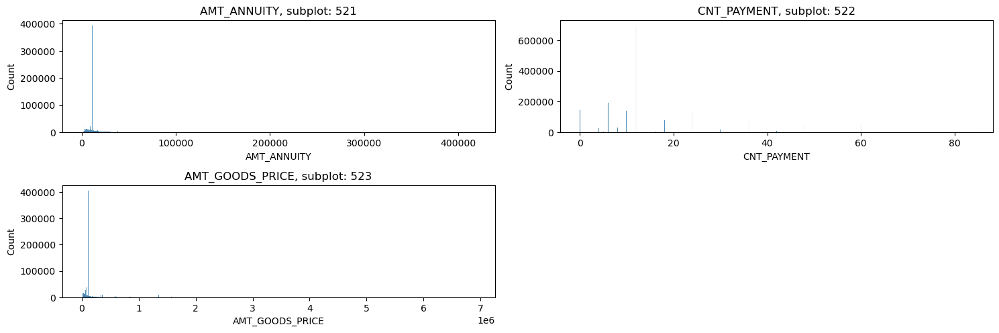

In [65]:
i = 5  # Row Count 
j = 2  # Column Count
k = 1  #  plot counter

fig = plt.figure(figsize=(15,12))

# for col in num_cols_prev:
for col in ['AMT_ANNUITY','CNT_PAYMENT','AMT_GOODS_PRICE']:
   
    plt.subplot(i, j, k)
    plt.title('{}, subplot: {}{}{}'.format(col, i, j, k))
#     plt.grid()
    plt.xlabel(col)
    sns.histplot(x = prev_loan_df[col], palette="Blues_d")
    k = k + 1

fig.tight_layout()
plt.show()

**Insights**

-  Not having much distribution
-  Some columns say AMT_ANNUITY, CNT_PAYMENT, AMT_GOODS_PRICE seems to have outlier

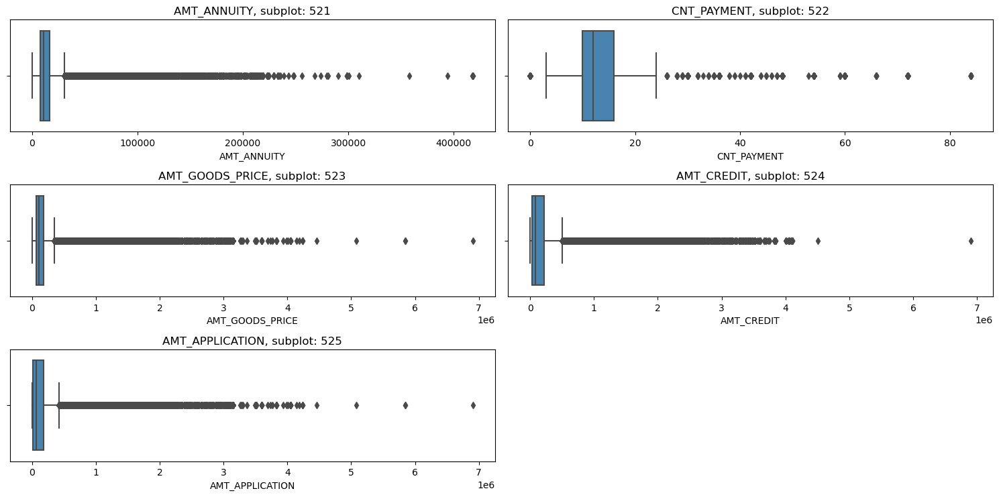

In [71]:
i = 5  # Row Count 
j = 2  # Column Count
k = 1  #  plot counter

fig = plt.figure(figsize=(15,12))

# for col in num_cols_prev:
for col in ['AMT_ANNUITY','CNT_PAYMENT','AMT_GOODS_PRICE', 'AMT_CREDIT', 'AMT_APPLICATION']:
   
    plt.subplot(i, j, k)
    plt.title('{}, subplot: {}{}{}'.format(col, i, j, k))
#     plt.grid()
    plt.xlabel(col)
    sns.boxplot(x = prev_loan_df[col], palette="Blues_d")
    k = k + 1

fig.tight_layout()
plt.show()

In [80]:
extra_cols

['SK_ID_PREV', 'SK_ID_CURR']

**Insights**

- Outlier shown in all these columns
  -  AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,CNT_PAYMENT


#### Outlier Treatment

In [ ]:
#Check value range in each columns

In [34]:
prev_loan_df["AMT_ANNUITY"].value_counts(normalize=True)

AMT_ANNUITY
11250.000    2.312332e-01
2250.000     1.907839e-02
6750.000     8.048070e-03
9000.000     7.481676e-03
22500.000    7.126632e-03
                 ...     
3794.445     5.987257e-07
8723.160     5.987257e-07
27948.330    5.987257e-07
25374.285    5.987257e-07
14704.290    5.987257e-07
Name: proportion, Length: 357959, dtype: float64

In [35]:
prev_loan_df["AMT_ANNUITY"].describe()

count    1.670214e+06
mean     1.490651e+04
std      1.317751e+04
min      0.000000e+00
25%      7.547096e+03
50%      1.125000e+04
75%      1.682403e+04
max      4.180581e+05
Name: AMT_ANNUITY, dtype: float64

In [36]:
prev_loan_df["AMT_APPLICATION"].value_counts(normalize=True)

AMT_APPLICATION
0.00         2.349412e-01
45000.00     2.863765e-02
225000.00    2.607031e-02
135000.00    2.435496e-02
450000.00    2.329342e-02
                 ...     
185292.00    5.987257e-07
225054.00    5.987257e-07
156212.55    5.987257e-07
99896.31     5.987257e-07
267295.50    5.987257e-07
Name: proportion, Length: 93885, dtype: float64

In [37]:
prev_loan_df["AMT_APPLICATION"].describe()

count    1.670214e+06
mean     1.752339e+05
std      2.927798e+05
min      0.000000e+00
25%      1.872000e+04
50%      7.104600e+04
75%      1.803600e+05
max      6.905160e+06
Name: AMT_APPLICATION, dtype: float64

In [38]:
prev_loan_df["AMT_APPLICATION"].value_counts(normalize=True)

AMT_APPLICATION
0.00         2.349412e-01
45000.00     2.863765e-02
225000.00    2.607031e-02
135000.00    2.435496e-02
450000.00    2.329342e-02
                 ...     
185292.00    5.987257e-07
225054.00    5.987257e-07
156212.55    5.987257e-07
99896.31     5.987257e-07
267295.50    5.987257e-07
Name: proportion, Length: 93885, dtype: float64

In [39]:
prev_loan_df["AMT_APPLICATION"].describe()

count    1.670214e+06
mean     1.752339e+05
std      2.927798e+05
min      0.000000e+00
25%      1.872000e+04
50%      7.104600e+04
75%      1.803600e+05
max      6.905160e+06
Name: AMT_APPLICATION, dtype: float64

In [40]:
prev_loan_df["AMT_CREDIT"].value_counts(normalize=True)

AMT_CREDIT
0.00         2.016316e-01
45000.00     2.098593e-02
225000.00    1.262952e-02
450000.00    1.194697e-02
135000.00    1.120814e-02
                 ...     
262768.50    5.987257e-07
354213.00    5.987257e-07
438817.50    5.987257e-07
253111.50    5.987257e-07
436370.22    5.987257e-07
Name: proportion, Length: 86803, dtype: float64

In [41]:
prev_loan_df["AMT_CREDIT"].describe()

count    1.670214e+06
mean     1.961140e+05
std      3.185745e+05
min      0.000000e+00
25%      2.416050e+04
50%      8.054100e+04
75%      2.164185e+05
max      6.905160e+06
Name: AMT_CREDIT, dtype: float64

-  Each of these columns shows major difference between max and 75 percentile value, which seems there having outlier

**Treatment of outlier -- By Capping and Flooring**

In [81]:
for i in num_cols_prev:
    q1 = prev_loan_df[i].describe()["25%"]# 25th Percentile
    q3 = prev_loan_df[i].describe()["75%"]# 75th Percentile
    iqr = q3 - q1
    upper_bound = q3 + 1.5 * iqr
    lower_bound = q1 - 1.5 * iqr
    prev_loan_df[i] = np.where(prev_loan_df[i] > upper_bound , upper_bound, prev_loan_df[i] )
    prev_loan_df[i] = np.where(prev_loan_df[i] < lower_bound , lower_bound, prev_loan_df[i] )
    

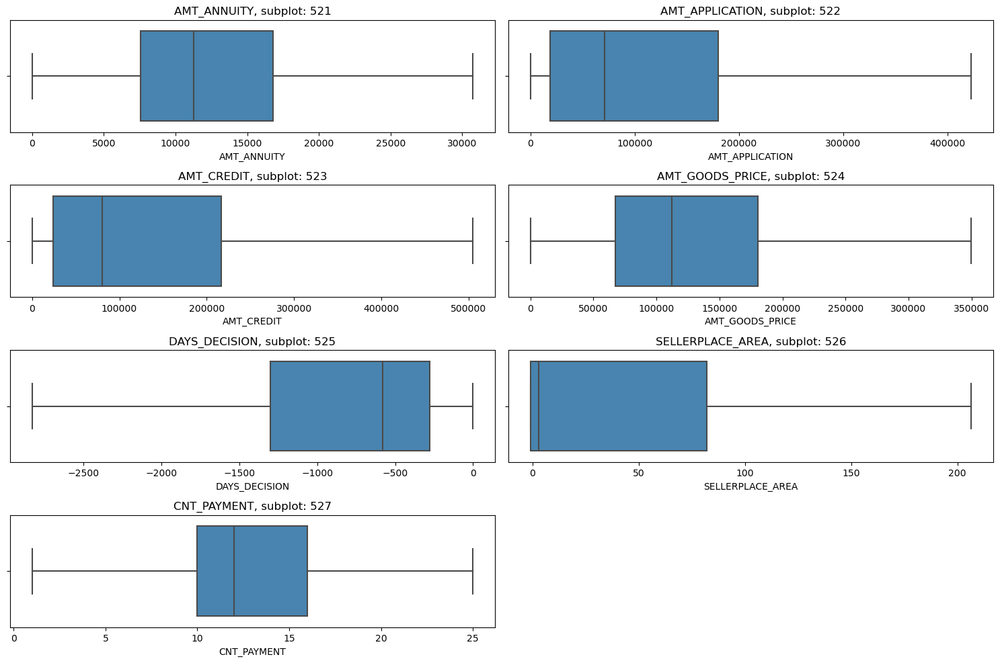

In [74]:
#BOX PLOT -- Rechecking

i = 5  # Row Count 
j = 2  # Column Count
k = 1  #  plot counter

fig = plt.figure(figsize=(15,12))

for col in num_cols_prev:
# for col in ['AMT_ANNUITY','CNT_PAYMENT','AMT_GOODS_PRICE', 'AMT_CREDIT', 'AMT_APPLICATION']:
   
    plt.subplot(i, j, k)
    plt.title('{}, subplot: {}{}{}'.format(col, i, j, k))
#     plt.grid()
    plt.xlabel(col)
    sns.boxplot(x = prev_loan_df[col], palette="Blues_d")
    k = k + 1

fig.tight_layout()
plt.show()

In [30]:
#Analyze categorical columns
print(cat_cols_prev)

['NAME_CONTRACT_TYPE', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION']


In [31]:
for i in cat_cols_prev:
    print(prev_loan_df[i].value_counts(normalize=True, dropna= False))
    print('\n\n')

NAME_CONTRACT_TYPE
Cash loans         0.447579
Consumer loans     0.436561
Revolving loans    0.115652
XNA                0.000207
Name: proportion, dtype: float64



FLAG_LAST_APPL_PER_CONTRACT
Y    0.994926
N    0.005074
Name: proportion, dtype: float64



NAME_CASH_LOAN_PURPOSE
XAP                                 0.552421
XNA                                 0.405887
Repairs                             0.014229
Other                               0.009345
Urgent needs                        0.005036
Buying a used car                   0.001729
Building a house or an annex        0.001612
Everyday expenses                   0.001447
Medicine                            0.001302
Payments on other loans             0.001156
Education                           0.000942
Journey                             0.000742
Purchase of electronic equipment    0.000635
Buying a new car                    0.000606
Wedding / gift / holiday            0.000576
Buying a home                       0.00051

In [82]:
# Deleting Some more columns after looking at data--which are not relevant for analysis
,
drop_cols =[ 'NAME_PRODUCT_TYPE','NAME_CASH_LOAN_PURPOSE', 'NAME_PAYMENT_TYPE']


In [83]:
prev_loan_df = prev_loan_df.drop(drop_cols,axis=1)

In [34]:
prev_loan_df.shape

(1670214, 17)

In [84]:
#Drop these columns from cat_cols 'NAME_PRODUCT_TYPE','NAME_CASH_LOAN_PURPOSE', 'NAME_PAYMENT_TYPE','CODE_REJECT_REASON'

cat_cols_prev.remove('NAME_PRODUCT_TYPE')
cat_cols_prev.remove('NAME_CASH_LOAN_PURPOSE')
cat_cols_prev.remove('NAME_PAYMENT_TYPE')


In [59]:
print(len(cat_cols_prev))
print(len(num_cols_prev))

10
5


**Categorical Univariate**

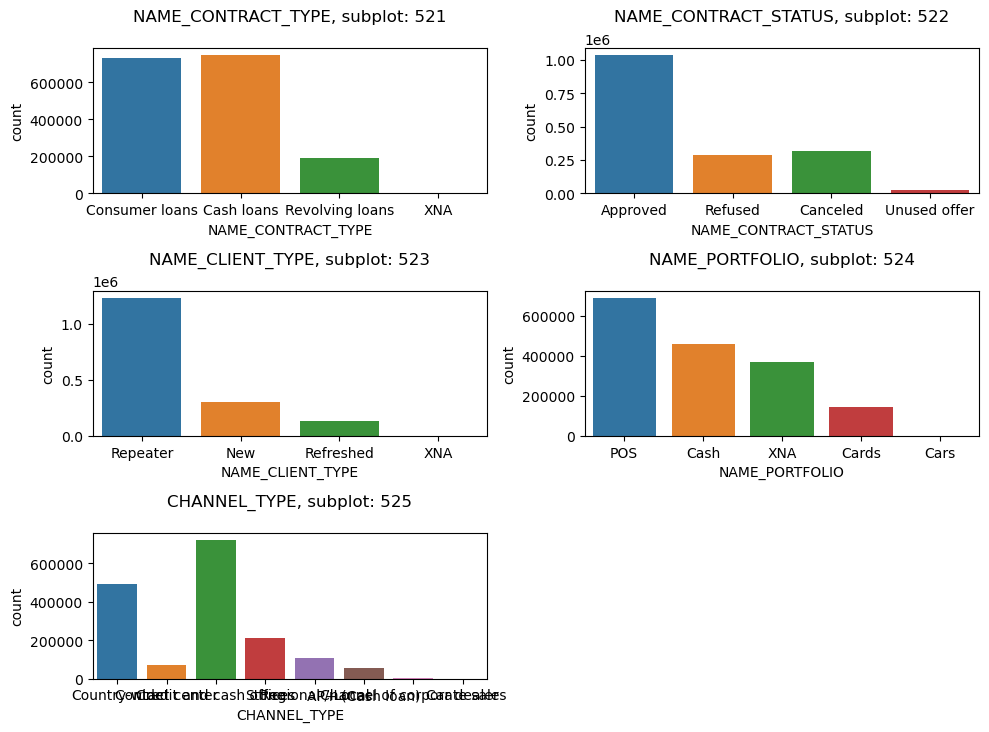

In [82]:
a = 5  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(10,12))

for col in ['NAME_CONTRACT_TYPE','NAME_CONTRACT_STATUS','NAME_CLIENT_TYPE','NAME_PORTFOLIO', 'CHANNEL_TYPE']:
        plt.subplot(a, b, c)
        plt.title('{}, subplot: {}{}{}\n'.format(col, a, b, c))
        plt.xlabel(i)
        sns.countplot(x=prev_loan_df[col])

        c = c + 1

fig.tight_layout()
plt.show()

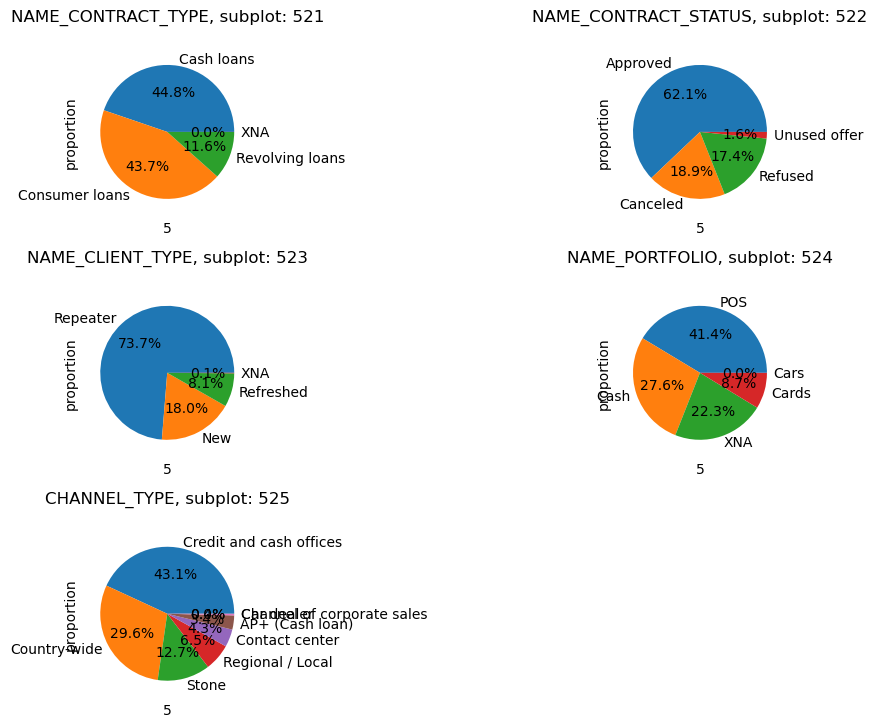

In [83]:
a = 5  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(10,12))

for col in ['NAME_CONTRACT_TYPE','NAME_CONTRACT_STATUS','NAME_CLIENT_TYPE','NAME_PORTFOLIO', 'CHANNEL_TYPE']:
        plt.subplot(a, b, c)
        plt.title('{}, subplot: {}{}{}\n'.format(col, a, b, c))
        plt.xlabel(i)
        prev_loan_df[col].value_counts(normalize=True).plot.pie(autopct='%1.1f%%')

        c = c + 1

fig.tight_layout()
plt.show()

**Insight**
  
1.  Previous loan application having  Consumer Loan Type. 43.7% of loans are consumer loans. 44.*% cash loans and rest revolving
2.  Approved loans are 62.1% rest are  refused, cancelled, unused - rest. **IMBALANCE IN DATA**
3.  73.7% are repeaters. NAME_CLIENT_TYPE also has some null values showing as XNA
4.  41.4% of the applicants have taken loan for POS purchase.
5.  Maximum applicants are from Credit and cash Offices (43.1%)
6.  Name seller industry has 37% XNA values, Consumer electronics is next highest category at 30%

In [84]:
prev_loan_df["NAME_GOODS_CATEGORY"].value_counts(normalize=True)

NAME_GOODS_CATEGORY
XNA                         5.692738e-01
Mobile                      1.345384e-01
Consumer Electronics        7.279067e-02
Computers                   6.332662e-02
Audio/Video                 5.953788e-02
Furniture                   3.212522e-02
Photo / Cinema Equipment    1.498072e-02
Construction Materials      1.496515e-02
Clothing and Accessories    1.410238e-02
Auto Accessories            4.419194e-03
Jewelry                     3.765984e-03
Homewares                   3.007399e-03
Medical Supplies            2.300903e-03
Vehicles                    2.017706e-03
Sport and Leisure           1.784801e-03
Gardening                   1.597400e-03
Other                       1.529145e-03
Office Appliances           1.396827e-03
Tourism                     9.932859e-04
Medicine                    9.280248e-04
Direct Sales                2.670316e-04
Fitness                     1.251337e-04
Additional Service          7.663689e-05
Education                   6.406365e

- Drop NAME_GOODS_CATEGORY-- it having lots XNA value, about which we are not aware

In [85]:

prev_loan_df = prev_loan_df.drop("NAME_GOODS_CATEGORY", axis=1)

In [86]:
#Remove NAME_GOODS_CATEGORY from cat_cols_prev
cat_cols_prev.remove('NAME_GOODS_CATEGORY')


#### BiVariate Analysis

**Numerical VS Numerical**

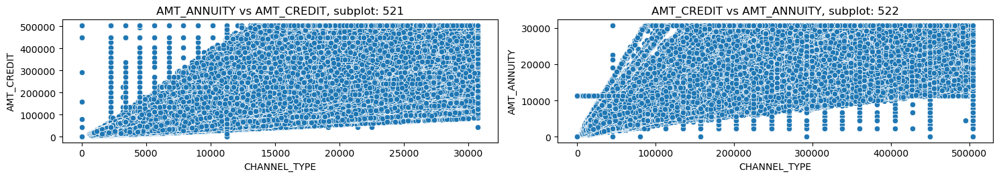

In [90]:
i = 5  # Row Count 
j = 2  # Column Count
k = 1  #  plot counter

fig = plt.figure(figsize=(15,12))

# for col in num_cols_prev:
# for col in ['AMT_ANNUITY','CNT_PAYMENT','AMT_GOODS_PRICE', 'AMT_CREDIT', 'AMT_APPLICATION']:
for col1 in ['AMT_ANNUITY','AMT_CREDIT']:
    for col2 in  ['AMT_ANNUITY','AMT_CREDIT']:
        if col1 != col2:
            plt.subplot(i, j, k)
            plt.title('{} vs {}, subplot: {}{}{}'.format(col1,col2, i, j, k))
        #     plt.grid()
            plt.xlabel(col)
#                 sns.boxplot(x = prev_loan_df[col], palette="Blues_d")
            sns.scatterplot(x = prev_loan_df[col1], y = prev_loan_df[col2], palette="Blues_d")

            k = k + 1

fig.tight_layout()
plt.show()

**Insight**
- 'AMT_GOODS_PRICE','AMT_CREDIT' shows strong connection between them


<Figure size 1000x800 with 0 Axes>

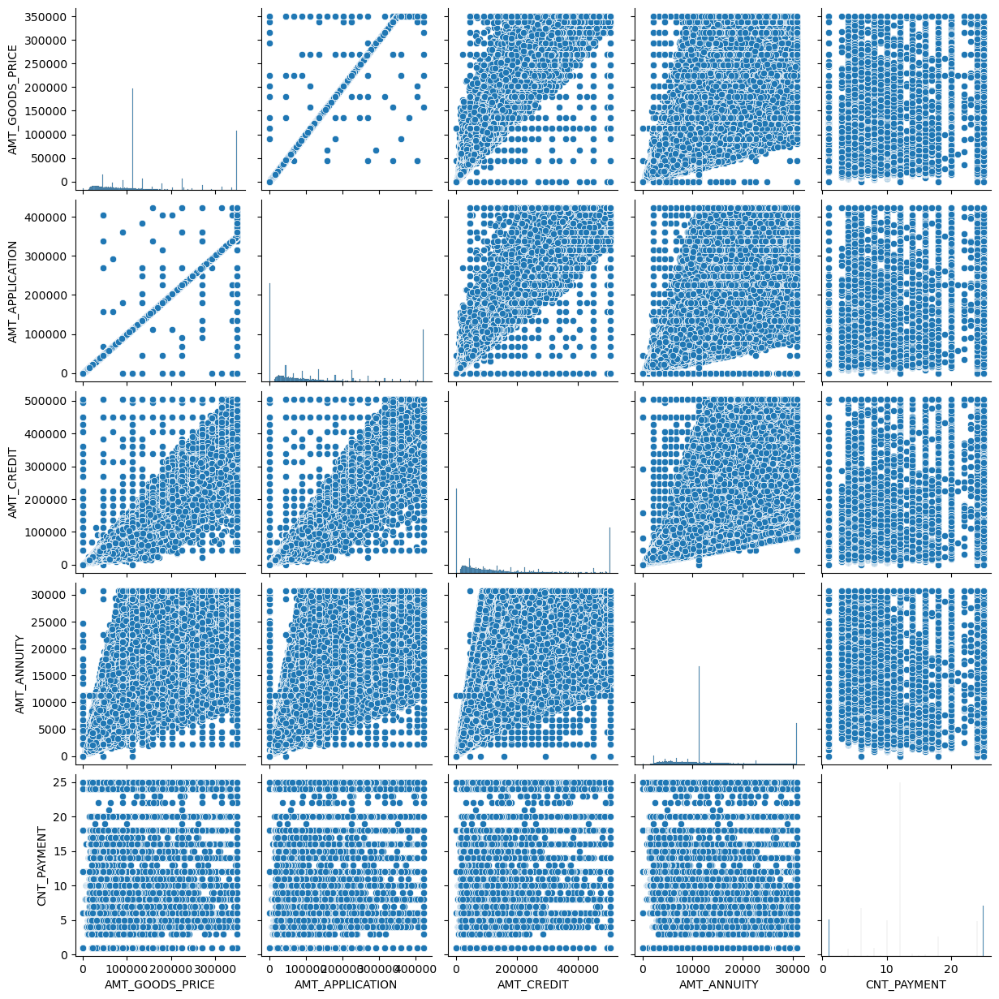

In [65]:
#Plot pair plots among them
plt.figure(figsize=[10,8])
sns.pairplot(prev_loan_df[['AMT_GOODS_PRICE','AMT_APPLICATION','AMT_CREDIT','AMT_ANNUITY','CNT_PAYMENT']])
plt.show()    

**POINTS**

1.  AMT_GOODS_PRICE, AMT_ANNUITY, AMT_APPLICATION - as expected have high correlation. which is relevant also
2.  Column CNT_Payment ideally should have had a high correlation with AMT_credit, ie higher credit, more the term of 
    loan. But no such correaltion can be seen


**NUmerical vs Categorical Analysis**

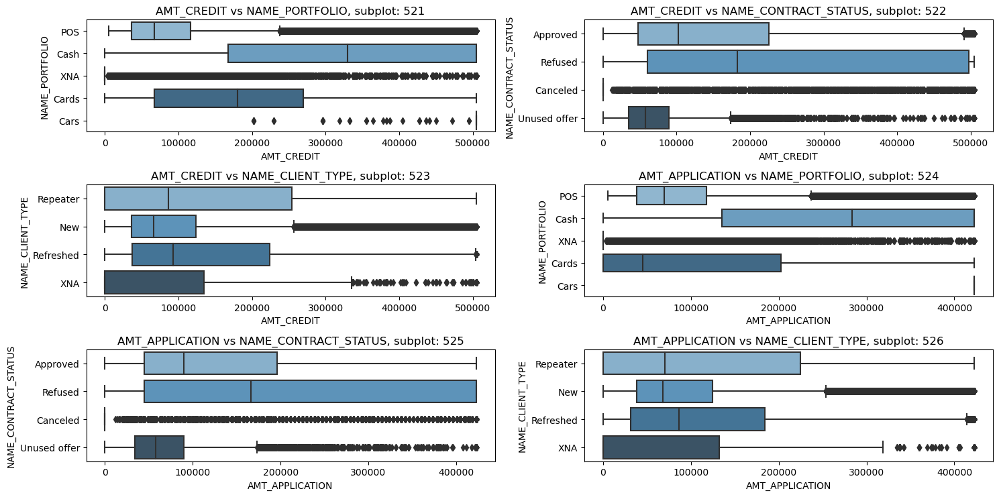

In [66]:


i = 5  # Row Count 
j = 2  # Column Count
k = 1  #  plot counter

fig = plt.figure(figsize=(15,12))

# for col in num_cols_prev:
for col1 in ['AMT_CREDIT', 'AMT_APPLICATION']:
    for col2 in ["NAME_PORTFOLIO","NAME_CONTRACT_STATUS","NAME_CLIENT_TYPE"]:
        plt.subplot(i, j, k)
        plt.title('{} vs {}, subplot: {}{}{}'.format(col1, col2, i, j, k))
    #     plt.grid()
        plt.xlabel(col)
        sns.boxplot(x = prev_loan_df[col1],y = prev_loan_df[col2], palette="Blues_d")
        k = k + 1

fig.tight_layout()
plt.show()

**Insight   -- Some relations that shown in above plots**
  
-  More applications are Refused than accepted
-  Repeaters Amt Credit is  more than new
-  CASH Porfolio AMT_Application, AMT_Credit, much higher than others

1.   Need to further analyze the columns AMT_APPLICATION, AMT_CREDIT, AMT_GOODS_PRICE with NAME_CONTRACT_STATUS
2.   Need to explore NAME_CONTRACT_STATUS with NAME_CONTRACT_TYPE, NAME_CLIENT_TYPE, NAME_PORTFOLIO

**To explore more -- Compare all with Application status column (NAME_CONTRACT_STATUS)**

In [33]:


prev_loan_df["NAME_CONTRACT_STATUS"].value_counts(dropna=False)


NAME_CONTRACT_STATUS
Approved        1036781
Canceled         316319
Refused          290678
Unused offer      26436
Name: count, dtype: int64

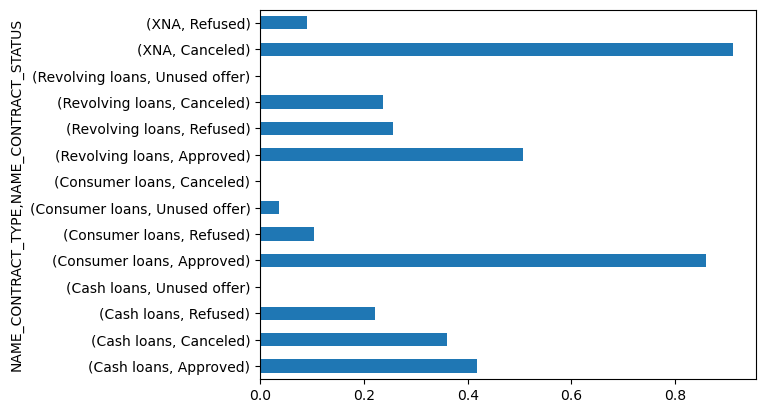

In [34]:
#1. NAME_CONTRACT_TYPE vs NAME_CONTRACT_STATUS

prev_loan_df.groupby(by="NAME_CONTRACT_TYPE")[["NAME_CONTRACT_STATUS"]].value_counts(normalize=True).plot.barh()
plt.show()


**Points**

-  In approved category, consumer loan has largest no of applicants. 
-  There seem to be no cancelled loans in consumer category than cash loan.
-  More cash loans have been refused than consumer loans.


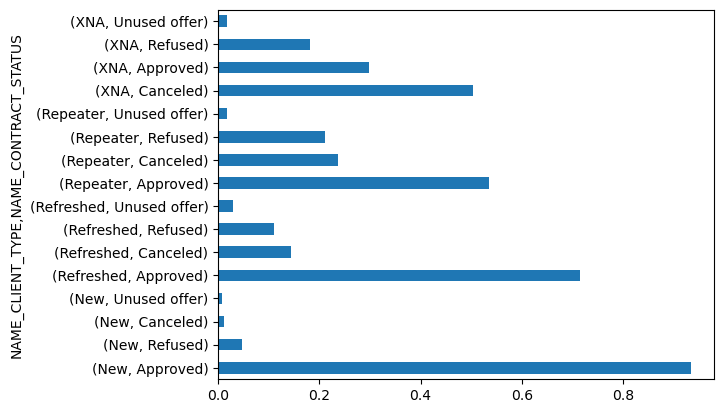

In [36]:
#2. NAME_CLIENT_TYPE vs NAME_CONTRACT_STATUS

prev_loan_df.groupby(by="NAME_CLIENT_TYPE")[["NAME_CONTRACT_STATUS"]].value_counts(normalize=True).plot.barh()
plt.show()


**POINTS**
 
-  The bank has more repeaters in all  refused, unused, cancelled categories
-  The bank approved more applications for new applicants


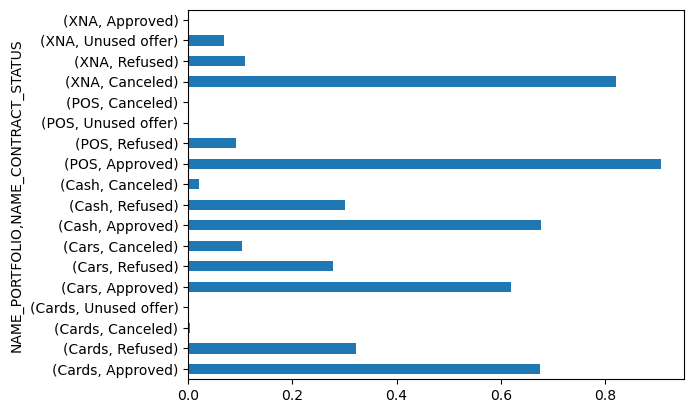

In [42]:
#3. NAME_PORTFOLIO vs NAME_CONTRACT_STATUS

prev_loan_df.groupby(by="NAME_PORTFOLIO")[["NAME_CONTRACT_STATUS"]].value_counts(normalize=True).plot.barh()
plt.show()


**POINTS**
 
- POS porfolio have more approved loans 
- More cash laons have been refused than POS portfolio loans.

#### Multivariate Analysis 

- Now Analyze the relationship between NAME_CONTRACT_STATUS, NAME_CLIENT_TYPE, AMT_CREDIT, AMT_Application and AMT_Good_Price

In [43]:
#1. NAME_CONTRACT_STATUS, NAME_CLIENT_TYPE and AMT_CREDIT

res_amt_credit = pd.pivot_table(data=prev_loan_df, index="NAME_CONTRACT_STATUS",columns='NAME_CLIENT_TYPE',values='AMT_CREDIT')
res_amt_credit

NAME_CLIENT_TYPE,New,Refreshed,Repeater,XNA
NAME_CONTRACT_STATUS,,,,
Approved,97694.074626,169863.566209,192024.541183,169801.696479
Canceled,18162.279030,19922.663518,13330.114783,8978.712602
Refused,139495.749962,234476.579165,246183.472621,282907.930678
Unused offer,79733.578765,67761.197326,68118.098420,60532.500000


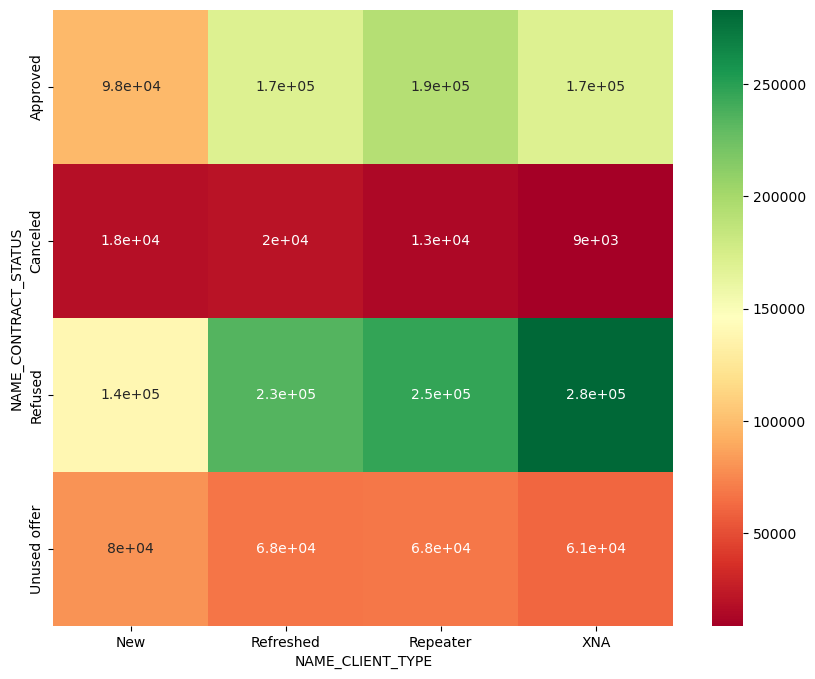

In [59]:
plt.figure(figsize=(10,8))
sns.heatmap(res_amt_credit, annot=True, cmap="RdYlGn")
plt.show()

**POINTS**
 
-  Unused offer having less credit amount
-  Refused offer having more credit amount

In [60]:
#2. NAME_CONTRACT_STATUS, NAME_CLIENT_TYPE and AMT_Application

res_amt_app = pd.pivot_table(data=prev_loan_df, index="NAME_CONTRACT_STATUS",columns='NAME_CLIENT_TYPE',values='AMT_APPLICATION')
res_amt_app

NAME_CLIENT_TYPE,New,Refreshed,Repeater,XNA
NAME_CONTRACT_STATUS,,,,
Approved,96809.296298,147111.666752,160142.109781,155939.941168
Canceled,16220.780158,17214.249613,11498.084259,7835.163934
Refused,131577.995403,197107.561581,207919.698799,248358.545085
Unused offer,79455.343235,67523.668452,67820.055837,60532.500000


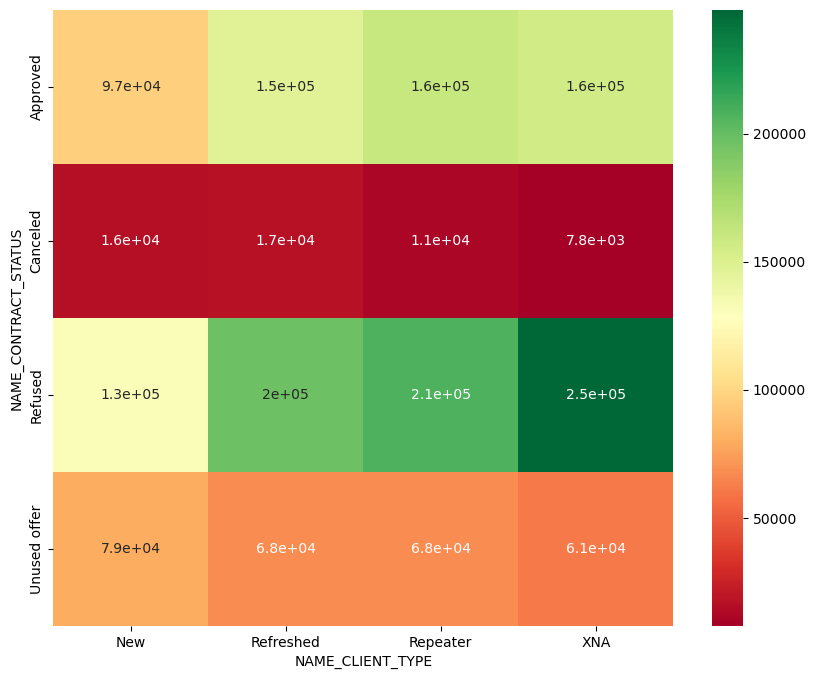

In [61]:
plt.figure(figsize=(10,8))
sns.heatmap(res_amt_app, annot=True, cmap="RdYlGn")
plt.show()

**POINTS**
 
- Unused application amount is less
- Refused application amount is more, it means bank reject the application more, which shows in previous plot also
- Repeater Approved application amount is higher than new applicant

In [62]:
#3. NAME_CONTRACT_STATUS, NAME_CLIENT_TYPE and AMT_CREDIT

res_amt_credit = pd.pivot_table(data=prev_loan_df, index="NAME_CONTRACT_STATUS",columns='NAME_CLIENT_TYPE',values='AMT_CREDIT')
res_amt_credit

NAME_CLIENT_TYPE,New,Refreshed,Repeater,XNA
NAME_CONTRACT_STATUS,,,,
Approved,97694.074626,169863.566209,192024.541183,169801.696479
Canceled,18162.279030,19922.663518,13330.114783,8978.712602
Refused,139495.749962,234476.579165,246183.472621,282907.930678
Unused offer,79733.578765,67761.197326,68118.098420,60532.500000


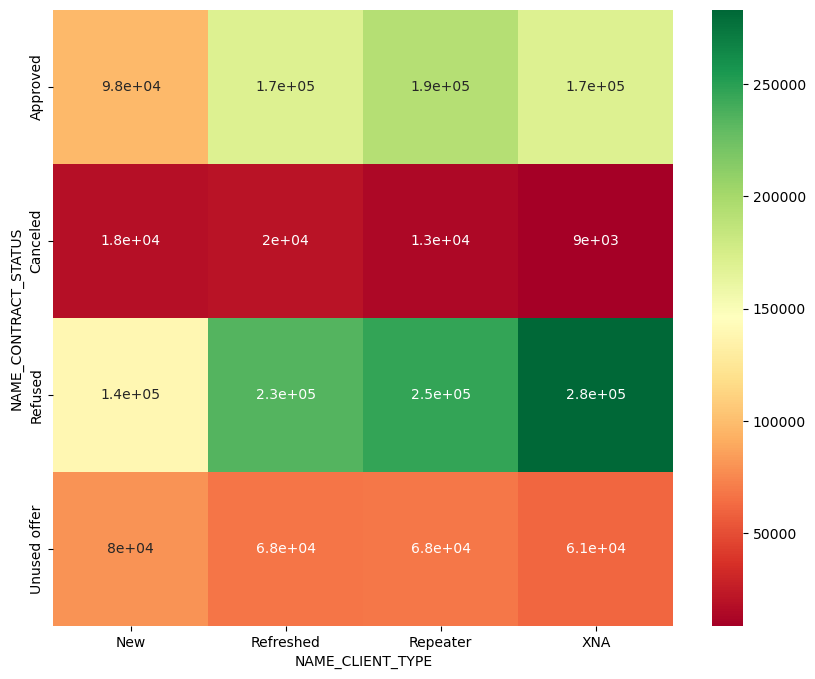

In [63]:
plt.figure(figsize=(10,8))
sns.heatmap(res_amt_credit, annot=True, cmap="RdYlGn")
plt.show()

**POINTS**
 
-  Unused offer having low credit amount
-  Refused having high credit amount- Need to analyze further


In [89]:
columns_drops_for_corelation = ['NAME_CONTRACT_TYPE', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CONTRACT_STATUS', 'NAME_CLIENT_TYPE',
 'NAME_PORTFOLIO', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION','SK_ID_CURR','SK_ID_PREV']


In [90]:
df_corr_prev_loan = prev_loan_df.drop(axis=1,columns=columns_drops_for_corelation )

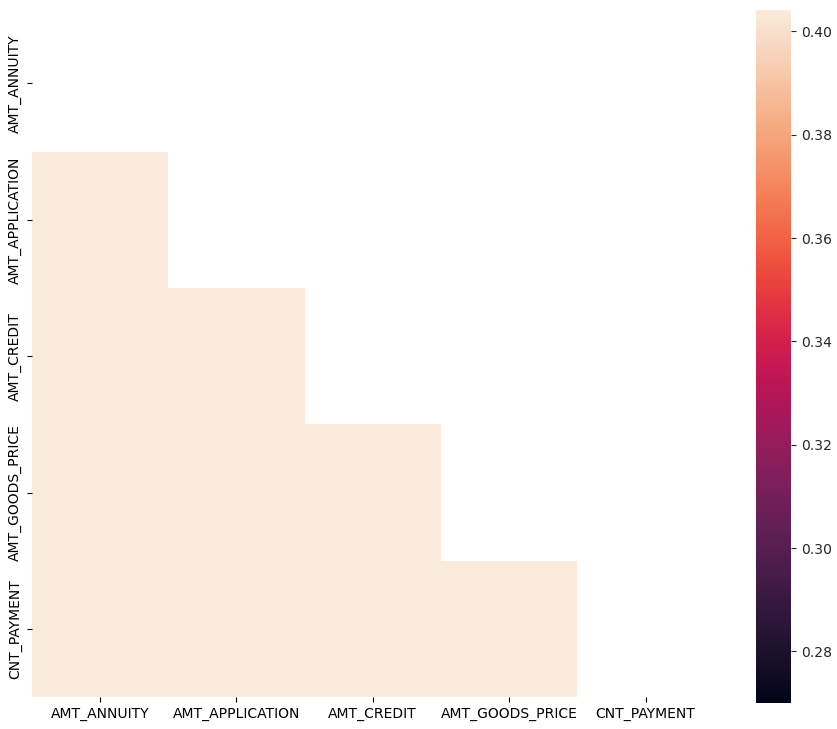

In [91]:
corr = df_corr_prev_loan.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(11, 9))
with sns.axes_style("white"):
    ax = sns.heatmap(corr, mask=mask, vmax=.3, square=True)

### Finding TOP Coorelation

In [92]:
df_corr_prev_loan.corr()

,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,CNT_PAYMENT
AMT_ANNUITY,1.000000,0.798277,0.822025,0.856074,0.404178
AMT_APPLICATION,0.798277,1.000000,0.941220,0.931341,0.586771
AMT_CREDIT,0.822025,0.941220,1.000000,0.905632,0.529697
AMT_GOODS_PRICE,0.856074,0.931341,0.905632,1.000000,0.593267
CNT_PAYMENT,0.404178,0.586771,0.529697,0.593267,1.000000


In [93]:
df_corr_prev_loan.corr().abs()

,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,CNT_PAYMENT
AMT_ANNUITY,1.000000,0.798277,0.822025,0.856074,0.404178
AMT_APPLICATION,0.798277,1.000000,0.941220,0.931341,0.586771
AMT_CREDIT,0.822025,0.941220,1.000000,0.905632,0.529697
AMT_GOODS_PRICE,0.856074,0.931341,0.905632,1.000000,0.593267
CNT_PAYMENT,0.404178,0.586771,0.529697,0.593267,1.000000


In [94]:
df_corr_prev_loan.corr().abs().unstack()

AMT_ANNUITY      AMT_ANNUITY        1.000000
                 AMT_APPLICATION    0.798277
                 AMT_CREDIT         0.822025
                 AMT_GOODS_PRICE    0.856074
                 CNT_PAYMENT        0.404178
AMT_APPLICATION  AMT_ANNUITY        0.798277
                 AMT_APPLICATION    1.000000
                 AMT_CREDIT         0.941220
                 AMT_GOODS_PRICE    0.931341
                 CNT_PAYMENT        0.586771
AMT_CREDIT       AMT_ANNUITY        0.822025
                 AMT_APPLICATION    0.941220
                 AMT_CREDIT         1.000000
                 AMT_GOODS_PRICE    0.905632
                 CNT_PAYMENT        0.529697
AMT_GOODS_PRICE  AMT_ANNUITY        0.856074
                 AMT_APPLICATION    0.931341
                 AMT_CREDIT         0.905632
                 AMT_GOODS_PRICE    1.000000
                 CNT_PAYMENT        0.593267
CNT_PAYMENT      AMT_ANNUITY        0.404178
                 AMT_APPLICATION    0.586771
          

In [95]:
df_corr_prev_loan.corr().abs().unstack().sort_values(ascending=False)

AMT_ANNUITY      AMT_ANNUITY        1.000000
AMT_APPLICATION  AMT_APPLICATION    1.000000
AMT_GOODS_PRICE  AMT_GOODS_PRICE    1.000000
AMT_CREDIT       AMT_CREDIT         1.000000
CNT_PAYMENT      CNT_PAYMENT        1.000000
AMT_CREDIT       AMT_APPLICATION    0.941220
AMT_APPLICATION  AMT_CREDIT         0.941220
                 AMT_GOODS_PRICE    0.931341
AMT_GOODS_PRICE  AMT_APPLICATION    0.931341
                 AMT_CREDIT         0.905632
AMT_CREDIT       AMT_GOODS_PRICE    0.905632
AMT_GOODS_PRICE  AMT_ANNUITY        0.856074
AMT_ANNUITY      AMT_GOODS_PRICE    0.856074
AMT_CREDIT       AMT_ANNUITY        0.822025
AMT_ANNUITY      AMT_CREDIT         0.822025
                 AMT_APPLICATION    0.798277
AMT_APPLICATION  AMT_ANNUITY        0.798277
AMT_GOODS_PRICE  CNT_PAYMENT        0.593267
CNT_PAYMENT      AMT_GOODS_PRICE    0.593267
AMT_APPLICATION  CNT_PAYMENT        0.586771
CNT_PAYMENT      AMT_APPLICATION    0.586771
                 AMT_CREDIT         0.529697
AMT_CREDIT

In [97]:
correlation_prev = df_corr_prev_loan.corr().abs().unstack().sort_values(ascending=False).dropna()
correlation_prev


AMT_ANNUITY      AMT_ANNUITY        1.000000
AMT_APPLICATION  AMT_APPLICATION    1.000000
AMT_GOODS_PRICE  AMT_GOODS_PRICE    1.000000
AMT_CREDIT       AMT_CREDIT         1.000000
CNT_PAYMENT      CNT_PAYMENT        1.000000
AMT_CREDIT       AMT_APPLICATION    0.941220
AMT_APPLICATION  AMT_CREDIT         0.941220
                 AMT_GOODS_PRICE    0.931341
AMT_GOODS_PRICE  AMT_APPLICATION    0.931341
                 AMT_CREDIT         0.905632
AMT_CREDIT       AMT_GOODS_PRICE    0.905632
AMT_GOODS_PRICE  AMT_ANNUITY        0.856074
AMT_ANNUITY      AMT_GOODS_PRICE    0.856074
AMT_CREDIT       AMT_ANNUITY        0.822025
AMT_ANNUITY      AMT_CREDIT         0.822025
                 AMT_APPLICATION    0.798277
AMT_APPLICATION  AMT_ANNUITY        0.798277
AMT_GOODS_PRICE  CNT_PAYMENT        0.593267
CNT_PAYMENT      AMT_GOODS_PRICE    0.593267
AMT_APPLICATION  CNT_PAYMENT        0.586771
CNT_PAYMENT      AMT_APPLICATION    0.586771
                 AMT_CREDIT         0.529697
AMT_CREDIT

In [99]:
correlation_prev = correlation_prev[correlation_prev != 1.0]

print(correlation_prev)

AMT_CREDIT       AMT_APPLICATION    0.941220
AMT_APPLICATION  AMT_CREDIT         0.941220
                 AMT_GOODS_PRICE    0.931341
AMT_GOODS_PRICE  AMT_APPLICATION    0.931341
                 AMT_CREDIT         0.905632
AMT_CREDIT       AMT_GOODS_PRICE    0.905632
AMT_GOODS_PRICE  AMT_ANNUITY        0.856074
AMT_ANNUITY      AMT_GOODS_PRICE    0.856074
AMT_CREDIT       AMT_ANNUITY        0.822025
AMT_ANNUITY      AMT_CREDIT         0.822025
                 AMT_APPLICATION    0.798277
AMT_APPLICATION  AMT_ANNUITY        0.798277
AMT_GOODS_PRICE  CNT_PAYMENT        0.593267
CNT_PAYMENT      AMT_GOODS_PRICE    0.593267
AMT_APPLICATION  CNT_PAYMENT        0.586771
CNT_PAYMENT      AMT_APPLICATION    0.586771
                 AMT_CREDIT         0.529697
AMT_CREDIT       CNT_PAYMENT        0.529697
CNT_PAYMENT      AMT_ANNUITY        0.404178
AMT_ANNUITY      CNT_PAYMENT        0.404178
dtype: float64


In [ ]:
### Top Coorelation##

#- AMT_CREDIT       AMT_APPLICATION    0.941220
#- AMT_APPLICATION  AMT_CREDIT         0.941220
#-                  AMT_GOODS_PRICE    0.931341
#- AMT_GOODS_PRICE  AMT_APPLICATION    0.931341
#-                  AMT_CREDIT         0.905632
#- AMT_CREDIT       AMT_GOODS_PRICE    0.905632
#- AMT_GOODS_PRICE  AMT_ANNUITY        0.856074
#- AMT_ANNUITY      AMT_GOODS_PRICE    0.856074
#- AMT_CREDIT       AMT_ANNUITY        0.822025
#- AMT_ANNUITY      AMT_CREDIT         0.822025
#-                  AMT_APPLICATION    0.798277
#- AMT_APPLICATION  AMT_ANNUITY        0.798277

- Its shows that AMT_CREDIT and AMT_ANNUITY, AMT_APPLICATION are highly coorelated
- Similarly AMT_GOOD_PRICE, AMT_ANNUITY and AMT_CREDIT also highly coorelated

## Merged Dataset 

-  Merge application with prev_loan dataset with called inner merge. 
-  We need to check the application which having previous history


In [73]:

merged_df = pd.merge(left=app_df,right=prev_loan_df, how='inner', left_on='SK_ID_CURR', right_on='SK_ID_CURR')
merged_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,INCOME_GROUP,AGE_GROUP,OWN_CAR_YN,OWN_REALTY_YN,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,FLAG_LAST_APPL_PER_CONTRACT,NAME_CONTRACT_STATUS,NAME_CLIENT_TYPE,NAME_PORTFOLIO,CHANNEL_TYPE,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,100002,1,Cash loans,M,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,25.0,1.0,9.0,5.0,1,1,Laborers,1.0,2,2,0,0,0,0,0,0,Business Entity Type 3,0.262949,2.0,2.0,2.0,2.0,-1134.0,1,0.0,0.0,1.0,High,"(20, 30]",0,1,1038818,Consumer loans,9251.77500,179055.0,179055.0,179055.0,Y,Approved,New,POS,Stone,Auto technology,24.0,low_normal,POS other with interest
1,100003,0,Cash loans,F,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,45.0,3.0,3.0,0.0,1,1,Core staff,2.0,1,1,0,0,0,0,0,0,School,0.622246,1.0,0.0,1.0,0.0,-828.0,1,0.0,0.0,0.0,VeryHigh,"(40, 50]",0,0,1810518,Cash loans,30739.42125,422820.0,504805.5,349762.5,Y,Approved,Repeater,Cash,Credit and cash offices,XNA,12.0,low_normal,Cash X-Sell: low
2,100003,0,Cash loans,F,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,45.0,3.0,3.0,0.0,1,1,Core staff,2.0,1,1,0,0,0,0,0,0,School,0.622246,1.0,0.0,1.0,0.0,-828.0,1,0.0,0.0,0.0,VeryHigh,"(40, 50]",0,0,2636178,Consumer loans,30739.42125,337500.0,348637.5,337500.0,Y,Approved,Refreshed,POS,Stone,Furniture,6.0,middle,POS industry with interest
3,100003,0,Cash loans,F,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,45.0,3.0,3.0,0.0,1,1,Core staff,2.0,1,1,0,0,0,0,0,0,School,0.622246,1.0,0.0,1.0,0.0,-828.0,1,0.0,0.0,0.0,VeryHigh,"(40, 50]",0,0,2396755,Consumer loans,6737.31000,68809.5,68053.5,68809.5,Y,Approved,Refreshed,POS,Country-wide,Consumer electronics,12.0,middle,POS household with interest
4,100004,0,Revolving loans,M,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52.0,0.0,11.0,6.0,1,1,Laborers,1.0,2,2,0,0,0,0,0,0,Government,0.555912,0.0,0.0,0.0,0.0,-815.0,0,0.0,0.0,0.0,VeryLow,"(50, 60]",1,1,1564014,Consumer loans,5357.25000,24282.0,20106.0,24282.0,Y,Approved,New,POS,Regional / Local,Connectivity,4.0,middle,POS mobile without interest


In [74]:
merged_df.tail()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,INCOME_GROUP,AGE_GROUP,OWN_CAR_YN,OWN_REALTY_YN,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,FLAG_LAST_APPL_PER_CONTRACT,NAME_CONTRACT_STATUS,NAME_CLIENT_TYPE,NAME_PORTFOLIO,CHANNEL_TYPE,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
1413696,456255,0,Cash loans,F,0,157500.0,675000.0,49117.5,675000.0,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,0.04622,46.0,3.0,14.0,1.0,1,1,Laborers,2.0,1,1,0,0,0,0,1,1,Business Entity Type 3,0.708569,0.0,0.0,0.0,0.0,-787.0,1,2.0,0.0,1.0,Medium,"(40, 50]",0,0,2073384,Cash loans,16400.61000,229500.0,254340.0,229500.0,Y,Approved,Repeater,Cash,Credit and cash offices,XNA,24.0,middle,Cash X-Sell: middle
1413697,456255,0,Cash loans,F,0,157500.0,675000.0,49117.5,675000.0,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,0.04622,46.0,3.0,14.0,1.0,1,1,Laborers,2.0,1,1,0,0,0,0,1,1,Business Entity Type 3,0.708569,0.0,0.0,0.0,0.0,-787.0,1,2.0,0.0,1.0,Medium,"(40, 50]",0,0,1708056,Revolving loans,2250.00000,45000.0,45000.0,45000.0,Y,Refused,Repeater,Cards,Country-wide,Connectivity,1.0,XNA,Card Street
1413698,456255,0,Cash loans,F,0,157500.0,675000.0,49117.5,675000.0,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,0.04622,46.0,3.0,14.0,1.0,1,1,Laborers,2.0,1,1,0,0,0,0,1,1,Business Entity Type 3,0.708569,0.0,0.0,0.0,0.0,-787.0,1,2.0,0.0,1.0,Medium,"(40, 50]",0,0,1296007,Cash loans,30737.65500,422820.0,504805.5,349762.5,Y,Refused,Repeater,Cash,Credit and cash offices,XNA,25.0,low_normal,Cash Street: low
1413699,456255,0,Cash loans,F,0,157500.0,675000.0,49117.5,675000.0,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,0.04622,46.0,3.0,14.0,1.0,1,1,Laborers,2.0,1,1,0,0,0,0,1,1,Business Entity Type 3,0.708569,0.0,0.0,0.0,0.0,-787.0,1,2.0,0.0,1.0,Medium,"(40, 50]",0,0,2631384,Cash loans,30739.42125,422820.0,504805.5,349762.5,Y,Approved,Repeater,Cash,AP+ (Cash loan),XNA,25.0,low_normal,Cash X-Sell: low
1413700,456255,0,Cash loans,F,0,157500.0,675000.0,49117.5,675000.0,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,0.04622,46.0,3.0,14.0,1.0,1,1,Laborers,2.0,1,1,0,0,0,0,1,1,Business Entity Type 3,0.708569,0.0,0.0,0.0,0.0,-787.0,1,2.0,0.0,1.0,Medium,"(40, 50]",0,0,2729207,Consumer loans,11514.55500,58225.5,58545.0,58225.5,Y,Approved,Repeater,POS,Country-wide,Connectivity,6.0,high,POS mobile with interest


In [76]:
merged_df.shape

(1413701, 61)

In [77]:
merged_df.isnull().mean() * 100

SK_ID_CURR                      0.000000
TARGET                          0.000000
NAME_CONTRACT_TYPE_x            0.000000
CODE_GENDER                     0.000000
CNT_CHILDREN                    0.000000
AMT_INCOME_TOTAL                0.000000
AMT_CREDIT_x                    0.000000
AMT_ANNUITY_x                   0.006578
AMT_GOODS_PRICE_x               0.085449
NAME_TYPE_SUITE                 0.249416
NAME_INCOME_TYPE                0.000000
NAME_EDUCATION_TYPE             0.000000
NAME_FAMILY_STATUS              0.000000
NAME_HOUSING_TYPE               0.000000
REGION_POPULATION_RELATIVE      0.000000
YEARS_BIRTH                     0.000000
YEARS_EMPLOYED                  0.000000
YEARS_REGISTRATION              0.000000
YEARS_ID_PUBLISH                0.000000
FLAG_MOBIL                      0.000000
FLAG_EMP_PHONE                  0.000000
OCCUPATION_TYPE                32.367523
CNT_FAM_MEMBERS                 0.000000
REGION_RATING_CLIENT            0.000000
REGION_RATING_CL

#### Analyzing the default applications --- With Application Approval status and vice versa

In [85]:
#. Analyze the Default Status in diffrent Loan status category
merged_df["NAME_CONTRACT_STATUS"].value_counts()

NAME_CONTRACT_STATUS
Approved        886099
Canceled        259441
Refused         245390
Unused offer     22771
Name: count, dtype: int64

In [78]:
merged_df.groupby("NAME_CONTRACT_STATUS")[["TARGET"]].value_counts(normalize=True)

NAME_CONTRACT_STATUS  TARGET
Approved              0         0.924113
                      1         0.075887
Canceled              0         0.908264
                      1         0.091736
Refused               0         0.880036
                      1         0.119964
Unused offer          0         0.917483
                      1         0.082517
Name: proportion, dtype: float64

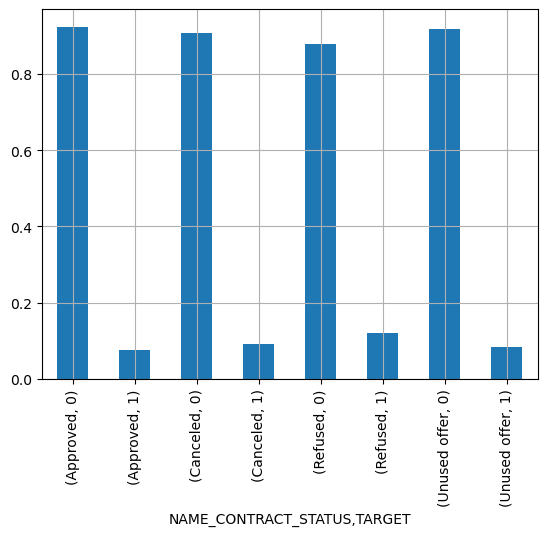

In [79]:
merged_df.groupby("NAME_CONTRACT_STATUS")[["TARGET"]].value_counts(normalize=True).plot.bar()
plt.grid()
plt.show()

**POINTS**
 
-  Maximum application without having payment difficulty(TARGET = 0)- get cancelled, refused and unused : Loss of business
-  Similarly Previous cancelled, refused and unused application having payment Difficulty, need to think why previously not approved application, now approved and facing payment difficulty


**Analyze the Approved cases with TARGET**

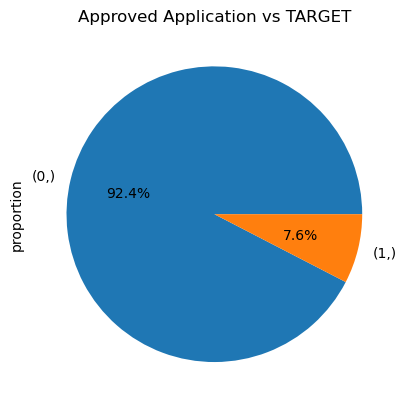

In [80]:
merged_df[merged_df["NAME_CONTRACT_STATUS"] == "Approved"][["TARGET"]].value_counts(normalize=True).plot.pie(autopct='%1.1f%%')
plt.title("Approved Application vs TARGET")
plt.grid()
plt.show()

- 7.6% previously Approved cases having payment Difficulty 

**Now Analyzing NAME_CONTRACT_STATUS with TARGET and some variable that shown impact on TARGET from our previous analysis**
 
- NAME_INCOME_TYPE
- NAME_EDUCATION_TYPE
- NAME_FAMILY_STATUS
- CODE_GENDER
- NAME_CONTRACT_TYPE
- AGE_GROUP
- AMT_INCOME_TOTAL/ INCOME_GROUP


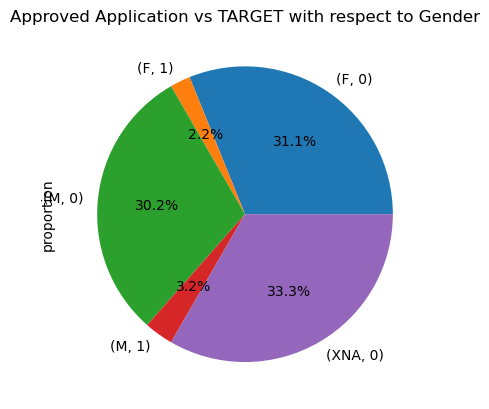

In [81]:
#Analyze the case when prev application approved, and current application TARGET- 0 and 1 with respect to gender

merged_df[merged_df["NAME_CONTRACT_STATUS"] =="Approved" ].groupby(by="CODE_GENDER")[["TARGET"]].value_counts(normalize=True).plot.pie(autopct='%1.1f%%')
plt.title("Approved Application vs TARGET with respect to Gender")
plt.show()


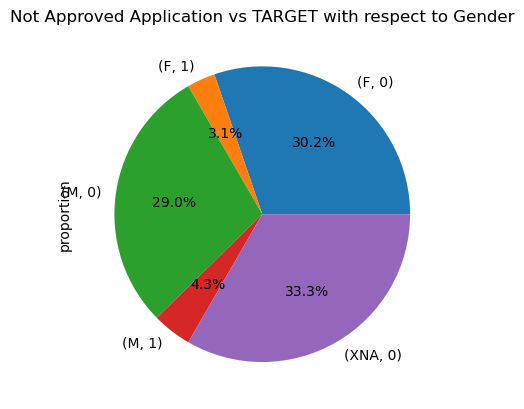

In [82]:
merged_df[merged_df["NAME_CONTRACT_STATUS"] !="Approved" ].groupby(by="CODE_GENDER")[["TARGET"]].value_counts(normalize=True).plot.pie(autopct='%1.1f%%')
plt.title("Not Approved Application vs TARGET with respect to Gender")
plt.show()


**POINTS**
 
-  It Shows that male applicants are more defaulter (3.2%) as comparision to Female(2.2%), This trends also shown in previous analysis also
-  Similarly female applicant, whose application was previously not approved still their default rate is very less as compared to male counterpart.


In [ ]:
#NAME_INCOME_TYPE

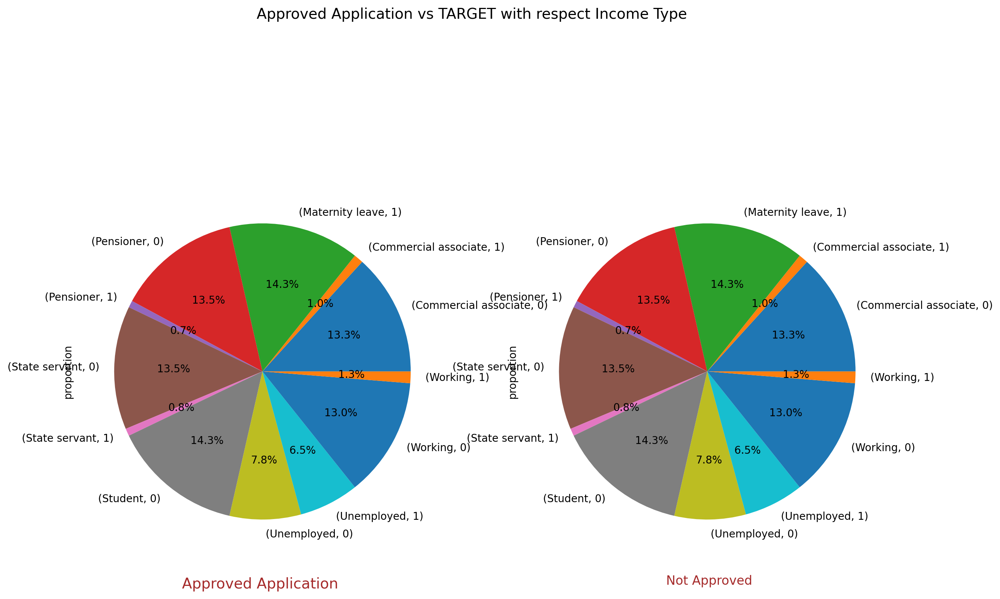

In [89]:
plt.figure(figsize =(14, 10), dpi = 200)
plt.subplot(1,2,1)

merged_df[merged_df["NAME_CONTRACT_STATUS"] =="Approved" ].groupby(by="NAME_INCOME_TYPE")[["TARGET"]].value_counts(normalize=True).plot.pie(autopct='%1.1f%%')


plt.xlabel("\n Approved Application  ", fontdict={'fontsize':14,"fontweight":5,"color":'Brown'})
plt.grid()

plt.subplot(1,2,2)

merged_df[merged_df["NAME_CONTRACT_STATUS"] =="Approved" ].groupby(by="NAME_INCOME_TYPE")[["TARGET"]].value_counts(normalize=True).plot.pie(autopct='%1.1f%%')


plt.xlabel("\n Not Approved", fontdict={'fontsize':12,"fontweight":5,"color":'Brown'})
plt.grid()
plt.suptitle('Approved Application vs TARGET with respect Income Type', fontsize=14)
plt.show()

**Points**
 
-  Maternity Leave and UnEmployed as more defaulter then others

In [ ]:
#NAME_EDUCATION_TYPE

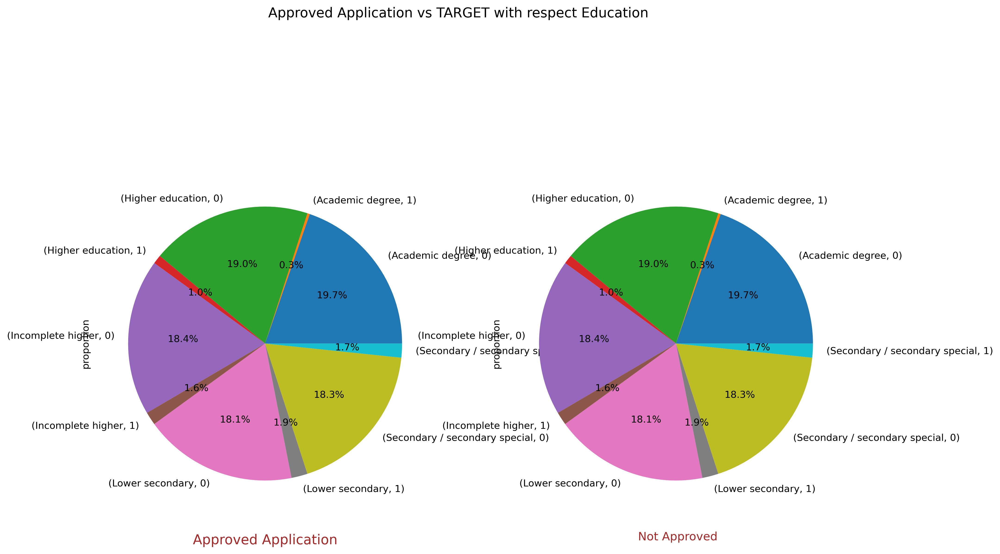

In [90]:
plt.figure(figsize =(14, 10), dpi = 300)

plt.subplot(1,2,1)

merged_df[merged_df["NAME_CONTRACT_STATUS"] =="Approved" ].groupby(by="NAME_EDUCATION_TYPE")[["TARGET"]].value_counts(normalize=True).plot.pie(autopct='%1.1f%%')


plt.xlabel("\n Approved Application ", fontdict={'fontsize':14,"fontweight":5,"color":'Brown'})
plt.grid()

plt.subplot(1,2,2)

merged_df[merged_df["NAME_CONTRACT_STATUS"] =="Approved" ].groupby(by="NAME_EDUCATION_TYPE")[["TARGET"]].value_counts(normalize=True).plot.pie(autopct='%1.1f%%')


plt.xlabel("\n Not Approved", fontdict={'fontsize':12,"fontweight":5,"color":'Brown'})
plt.grid()
plt.suptitle('Approved Application vs TARGET with respect Education', fontsize=14)
plt.show()

**POINTS**
  
-  It Shows that Lower Secondary applicants are more defaulter (1.9%) as comparision to other, This trends also shown in previous analysis also
-  Similarly Lower secondary applicant, whose application was previously not approved still their default rate is much higher(1.9%) as compared to Others.


In [ ]:
#AGE_GROUP

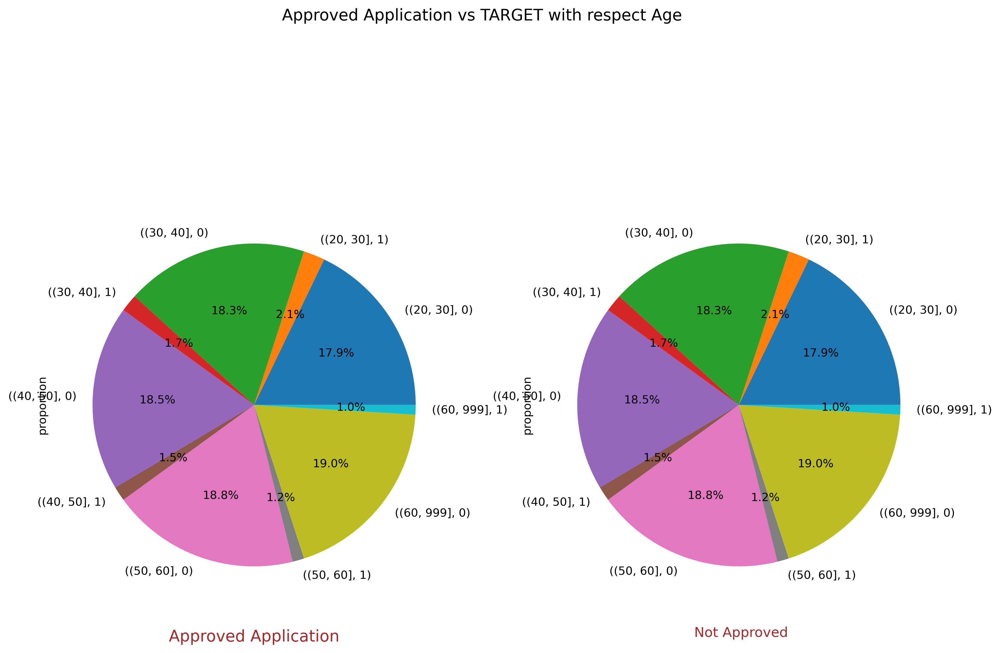

In [91]:
plt.figure(figsize =(14, 10), dpi = 300)

plt.subplot(1,2,1)

merged_df[merged_df["NAME_CONTRACT_STATUS"] =="Approved" ].groupby(by="AGE_GROUP")[["TARGET"]].value_counts(normalize=True).plot.pie(autopct='%1.1f%%')


plt.xlabel("\n Approved Application ", fontdict={'fontsize':14,"fontweight":5,"color":'Brown'})
plt.grid()

plt.subplot(1,2,2)

merged_df[merged_df["NAME_CONTRACT_STATUS"] =="Approved" ].groupby(by="AGE_GROUP")[["TARGET"]].value_counts(normalize=True).plot.pie(autopct='%1.1f%%')


plt.xlabel("\n Not Approved", fontdict={'fontsize':12,"fontweight":5,"color":'Brown'})
plt.grid()
plt.suptitle('Approved Application vs TARGET with respect Age', fontsize=14)
plt.show()

**Points**
 
-  AGE Group [20-30] approx. 2.1% having more default cases as compare to others

In [ ]:
#OCCUPATION_TYPE

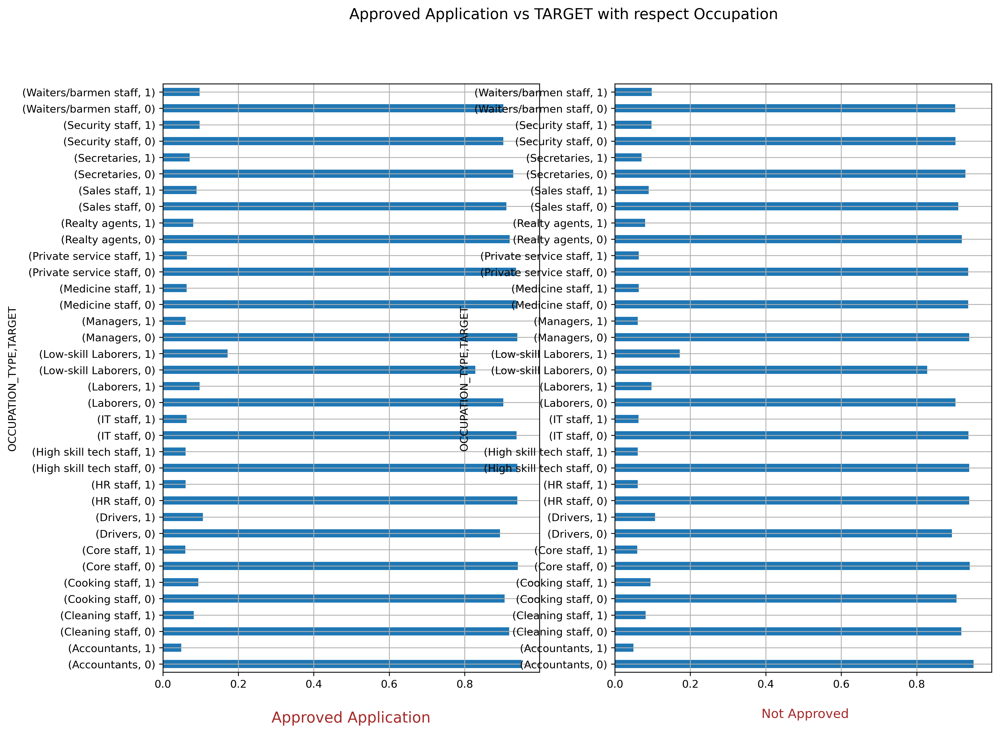

In [92]:
plt.figure(figsize =(14, 10), dpi = 300)

plt.subplot(1,2,1)

merged_df[merged_df["NAME_CONTRACT_STATUS"] =="Approved" ].groupby(by="OCCUPATION_TYPE")[["TARGET"]].value_counts(normalize=True).plot.barh()


plt.xlabel("\n Approved Application ", fontdict={'fontsize':14,"fontweight":5,"color":'Brown'})
plt.grid()

plt.subplot(1,2,2)

merged_df[merged_df["NAME_CONTRACT_STATUS"] =="Approved" ].groupby(by="OCCUPATION_TYPE")[["TARGET"]].value_counts(normalize=True).plot.barh()


plt.xlabel("\n Not Approved", fontdict={'fontsize':12,"fontweight":5,"color":'Brown'})
plt.grid()
plt.suptitle('Approved Application vs TARGET with respect Occupation', fontsize=14)
plt.show()

**Points**
 
 -  Low -skill laborers having more default rate as compared to other

In [90]:
#Now Check Approved Default cases with respects to all factors 

merged_df[ ( merged_df["NAME_CONTRACT_STATUS"] =="Approved" ) &  ( merged_df["TARGET"] == 1 )][["ORGANIZATION_TYPE"]].value_counts(normalize=True)

ORGANIZATION_TYPE     
Business Entity Type 3    0.246033
Self-employed             0.154975
XNA                       0.133040
Other                     0.050340
Business Entity Type 2    0.036539
Medicine                  0.032122
Trade: type 7             0.030516
Construction              0.030011
Government                0.029564
School                    0.021593
Business Entity Type 1    0.020404
Transport: type 4         0.019764
Kindergarten              0.019214
Industry: type 3          0.014648
Security                  0.012834
Trade: type 3             0.012834
Industry: type 11         0.009771
Industry: type 9          0.009711
Housing                   0.009547
Agriculture               0.009101
Restaurant                0.008179
Transport: type 2         0.007183
Transport: type 3         0.007183
Postal                    0.007049
Military                  0.006157
Trade: type 2             0.005800
Police                    0.005220
Bank                      0.0048

#### Points

**After all these analysis some factors that surface as far as default cases as follows**

-  Medium Income group having more defaulters
-  Age group 20-30 having more defaulters
-  Labourer having more default cases
-  Organization Business-3 having more default case
-  Default rate in male is more as compared to female


# Summary



### Defaulters Case 

  -->Below are the some factors / variables that effecting the default cases,that we found during the analysis of application data that also shown correct when analyze the same with previous applications against the Approved loans as well as other loans type, which having defaults, and it showing same trends
    
    --1. Medium Income group 
    --2. Age group 20-30 
    --3. Labourer Occupation Type
    --4. Organization Business-3 
    --5. Male having more default as compared to female
    --6. Unemployed or Female on Maternity Leave having more default  
    
### Some Points need to analyzed

    -Previous applications with Refused, Cancelled, Unused loans also have default which is a matter of concern.
     
    This indicates that the financial company had Refused/Cancelled previous application but has approved the current 
    and is facing default on these. 
    

### Some Suggesations

    - Female applicants should be given extra weightage as defaults are lesser.

    - More dafaulter are Working applicants and coming from labourer class. 
     Proper scrunity need to done before approving the loan, to reduce chances of default. 

    - Previous applications with Refused, Cancelled,Unused loans also have cases where payments are coming on time in 
      current application. This indicates that possibly wrong decisions were done in those cases.
      
**THANK YOU**